In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np
import h5py
import matplotlib.pyplot as plt
from real_data_manager import RealData
from ImageFactory import ImageFactory
from MagCounts import Mag2Counts, Count2Mag
from psf_sampler import PSFSampler
import cv2

In [2]:
#sim_data_path = "/home/rodrigo/supernovae_detection/simulated_data/image_sequences/small_may30_erf_distr50.hdf5"
sim_data_path = "/home/rcarrasco/simulated_data/image_sequences/complete_june8_erf_distr2500.hdf5"
sim_data = h5py.File(sim_data_path, "r")
fields = list(sim_data.keys())
print(list(sim_data[fields[0]]["obs_cond"].keys()))
keys_to_plot = ["flux_conversion","zero_point", "seeing", "airmass", "limmag5", "sky_brightness"]

['airmass', 'epoch', 'exp_time', 'filter', 'flux_conversion', 'good_quality_points', 'limmag3', 'limmag5', 'obs_day', 'seeing', 'sky_brightness', 'zero_point']


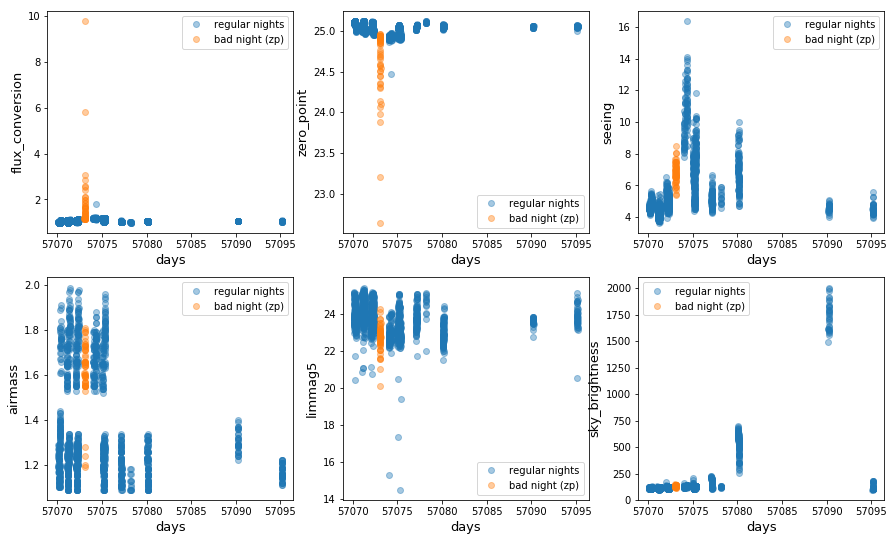

In [3]:
f, ax = plt.subplots(2, 3, figsize=(15,9))
ax = np.reshape(ax, newshape=(6,))
for i, key in enumerate(keys_to_plot):
    all_params = []
    all_days = []
    for field in fields:
        param = sim_data[field]["obs_cond"][key]["g"][:]
        days = sim_data[field]["obs_cond"]["obs_day"]["g"][:]
        all_params.append(param)
        all_days.append(days)
    all_params = np.concatenate(all_params)
    all_days = np.concatenate(all_days)
    bad_night_limits = [57072.7, 57073.5]
    regular_nights_index = np.logical_or(all_days>bad_night_limits[1], all_days<bad_night_limits[0])
    regular_nights_days = all_days[regular_nights_index]
    regular_nights_params = all_params[regular_nights_index]
    bad_night_days = all_days[np.logical_not(regular_nights_index)]
    bad_night_params = all_params[np.logical_not(regular_nights_index)]
    ax[i].plot(regular_nights_days, regular_nights_params, "o", alpha=0.4, label="regular nights")
    ax[i].plot(bad_night_days, bad_night_params, "o", alpha=0.4, label="bad night (zp)")
    ax[i].legend()
    ax[i].set_xlabel("days", fontsize=13)
    ax[i].set_ylabel(key, fontsize=13)
plt.show()

In [4]:
total_seeing = []
for f in fields:
    seeing = sim_data[f]["obs_cond"]["seeing"]["g"][:]
    total_seeing.append(seeing)
total_seeing = np.concatenate(total_seeing)
print(np.amin(total_seeing), np.amax(total_seeing))

3.635 16.4


In [5]:
#galaxy_path = "/home/rodrigo/supernovae_detection/galaxies/gal_mags_dev_exp_z_all_Filter_rodrigocd.csv"
galaxy_path = "/home/rcarrasco/simulated_data/galaxies/gal_mags_dev_exp_z_all_Filter_rodrigocd.csv"
obs_cond_path = "../real_obs/pickles/camera_and_obs_cond.pkl"
camera_and_obs_cond = np.load(obs_cond_path)
camera_params = camera_and_obs_cond["camera_params"]
available_cameras = camera_params.keys()
image_factory = ImageFactory(nx=21,
                             ny=21,
                             astrometric_error=0.3, #not used
                             galaxies_distr_path=galaxy_path,
                             bands=["g",],
                             sky_clipping=2000,
                             ccd_parameters=camera_params["CCD25"],
                             real_psfs=True,
                             obs_cond_path=obs_cond_path,
                             augmented_psfs=True)

- Using PSF sampler
(21, 21, 11560)
Doing gaussian fit to psf to compute SEEING
- Galaxy images


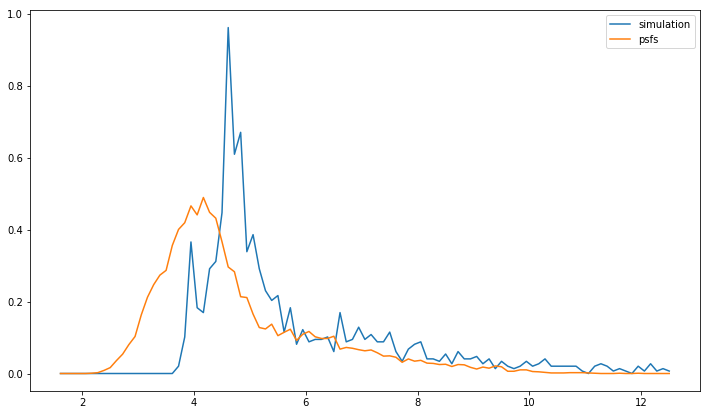

2.1271833376317293 11.9015327868241
3.635 16.4


In [6]:
sampler = image_factory.psf_sampler
seeing_to_plot = np.arange(start=4, stop=10, step=0.3)
bins = np.linspace(1.5, 12.5, num=100)
h_sim, _ = np.histogram(total_seeing, bins=bins, density=True)
h_psf, _ = np.histogram(sampler.psf_seeing, bins=bins, density=True)
plt.figure(figsize=(12,7))
plt.plot(bins[1:], h_sim, label="simulation")
plt.plot(bins[1:], h_psf, label="psfs")
plt.legend()
plt.show()
print(np.amin(sampler.psf_seeing), np.amax(sampler.psf_seeing))
print(np.amin(total_seeing), np.amax(total_seeing))

In [7]:
def augment_psf(psf_image, angle=np.pi/6.0, shrink=0.5, reduce=0.1):
    rows,cols = psf_image.shape
    # Rotation Matrix
    rm = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])
    center = np.zeros(shape=(1,2))
    p1 = np.array([3, 0])[..., np.newaxis]
    p2 = np.array([0, 3])[..., np.newaxis]
    # Shrink parameter
    shrink_vector = np.array([-shrink, shrink])[..., np.newaxis]
    shrink_vector = np.dot(rm, shrink_vector).T
    p1_f = np.dot(rm, p1-p1*reduce).T# + shrink_vector).T 
    p2_f = np.dot(rm, p2-p2*reduce).T# + np.flip(shrink_vector, axis=0)).T
    print(p1_f, p2_f)
    pts1 = np.concatenate([center, p1.T, p2.T]).astype(np.float32) +10
    pts2 = np.concatenate([center, 
                           p1_f+shrink_vector, 
                           p2_f+np.flip(shrink_vector, axis=1)]).astype(np.float32) +10

    M = cv2.getAffineTransform(pts1, pts2)
    dst = cv2.warpAffine(psf_image,M,(cols,rows))
    dst = dst/np.sum(dst)
    return dst

3.2998244946706805 3.0


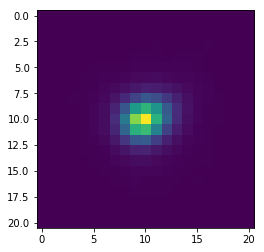

3.3841880000665645 3.3


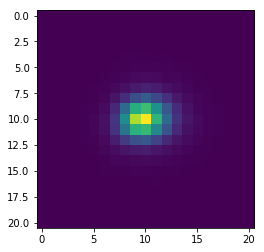

3.578485685548328 3.5999999999999996


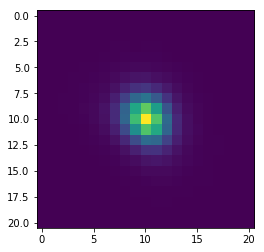

4.008487265593686 3.8999999999999995


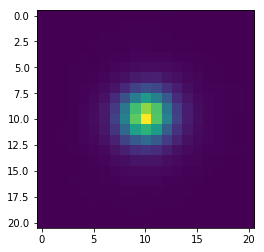

4.38303308569995 4.199999999999999


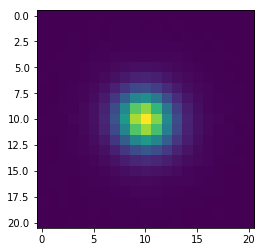

4.628595798323509 4.499999999999999


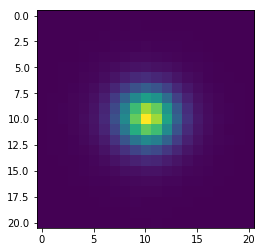

5.008337063658189 4.799999999999999


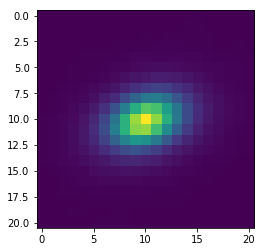

5.056619966538689 5.099999999999999


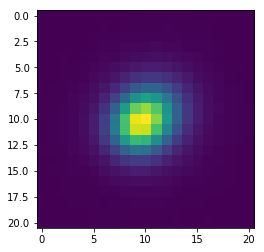

5.241734426510417 5.399999999999999


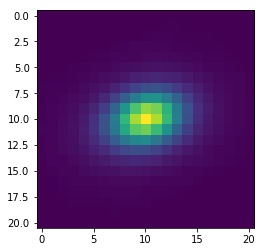

5.821726657455427 5.699999999999998


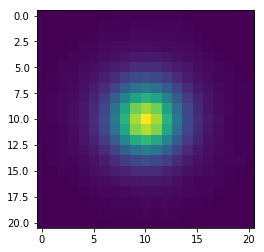

6.166413916954006 5.999999999999998


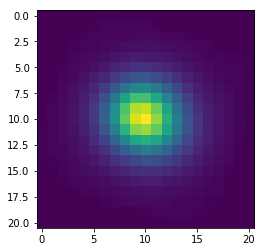

6.553253915225315 6.299999999999998


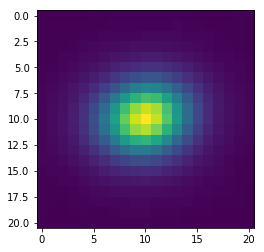

6.8048552027598905 6.599999999999998


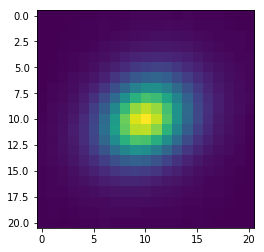

6.900921932116829 6.899999999999998


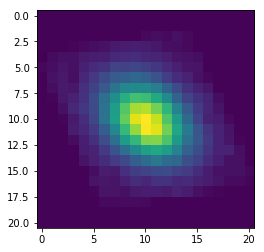

7.17608339617162 7.1999999999999975


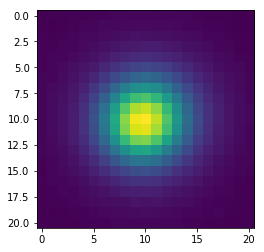

7.428419447876586 7.499999999999997


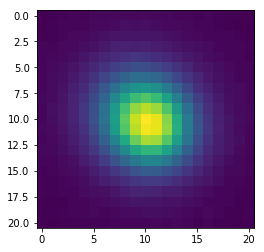

8.095818625268167 7.799999999999997


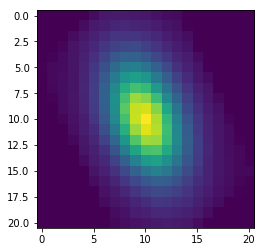

8.11681093553386 8.099999999999998


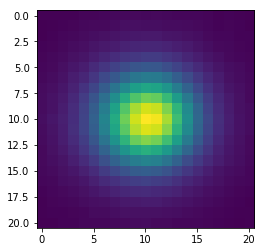

8.265496644750023 8.399999999999997


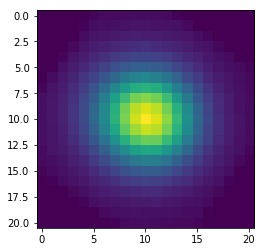

8.745334985182982 8.699999999999996


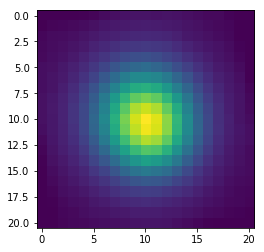

9.227037484999785 8.999999999999996


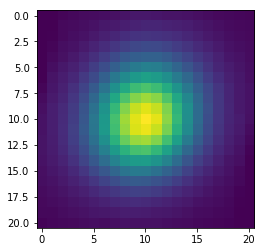

9.282050506765215 9.299999999999997


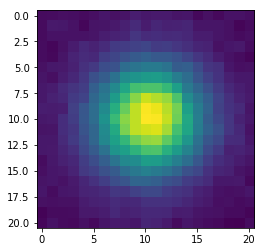

9.677169180136264 9.599999999999996


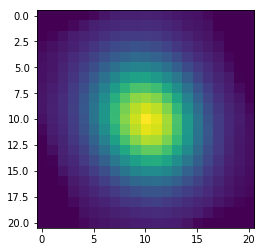

9.642927577846503 9.899999999999995


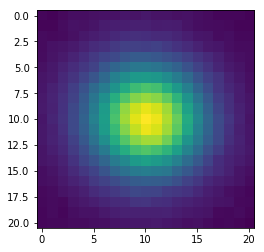

In [9]:
seeing_to_plot = np.arange(start=3, stop=10, step=0.3)
for s in seeing_to_plot:
    #f, [ax0, ax1] = plt.subplots(1, 2, figsize=(12,7))
    psf, real_s = sampler.sample_psf(s)
    print(real_s, s)
    #aug_psf = augment_psf(psf, angle=np.pi/2, shrink=0.8, reduce=-0.3)
    plt.imshow(psf)
    #ax1.imshow(aug_psf)
    #print(aug_psf)
    plt.show()

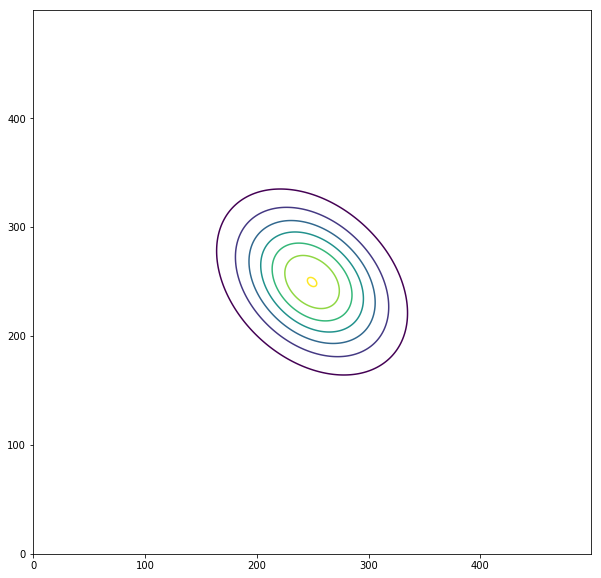

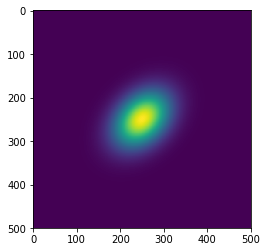

In [42]:
import matplotlib.pyplot as plt
from matplotlib import style
import numpy as np
from scipy.stats import multivariate_normal




#Parameters to set
mu_x = 0
variance_x = 3

mu_y = 0
variance_y = 15

x = np.linspace(-10,10,500)
y = np.linspace(-10,10,500)
X,Y = np.meshgrid(x,y)

pos = np.array([X.flatten(),Y.flatten()]).T

sigx = 3
sigy = 3
sigxy = -1
sigma = [[sigx, sigxy], [sigxy, sigy]]

rv = multivariate_normal([mu_x, mu_y], sigma)

psf_image =rv.pdf(pos).reshape(500,500) 

fig = plt.figure(figsize=(10,10))
ax0 = fig.add_subplot(111)
ax0.contour(psf_image)
plt.show()
plt.imshow(psf_image)
plt.show()

(2, 3)


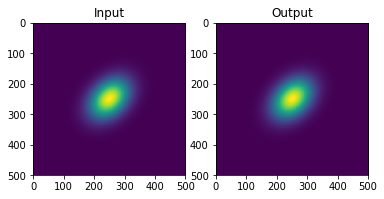

In [9]:


rows,cols = psf_image.shape

pts1 = np.float32([[0,1], [-1,-1], [1, -1]])+250
pts2 = np.float32([[0,1], [-1,-1], [1, -1]])+250

M = cv2.getAffineTransform(pts1,pts2)
print(M.shape)
dst = cv2.warpAffine(psf_image,M,(cols,rows))

plt.subplot(121),plt.imshow(psf_image),plt.title('Input')
plt.subplot(122),plt.imshow(dst),plt.title('Output')
plt.show()

In [10]:
def transform(image):
    for i in np.arange(start=0, stop=np.pi, step=0.01):
        rows,cols = image.shape
        #rm = cv2.getRotationMatrix2D((250, 250), i , 1.0)
        rm = np.array([[np.cos(i), -np.sin(i)], [np.sin(i), np.cos(i)]])
        center = np.zeros(shape=(1,2))
        p1 = np.array([3, 0])[..., np.newaxis]
        p2 = np.array([0, 3])[..., np.newaxis]
        print(p1.shape)
        print(rm.shape)
        p1_f = np.dot(rm, p1).T
        p2_f = np.dot(rm, p2).T
        print(p1_f.shape)
        pts1 = np.concatenate([center, p1.T, p2.T]).astype(np.float32) + 250
        pts2 = np.concatenate([center, p1_f, p2_f]).astype(np.float32) +250
        print(pts1)
        print(pts2)

        M = cv2.getAffineTransform(pts1, pts2)
        print(M.shape)
        dst = cv2.warpAffine(image,M,(cols,rows))

        plt.figure(figsize=(10,10))
        plt.subplot(121),plt.imshow(image),plt.title('Input')
        plt.subplot(122),plt.imshow(dst),plt.title('Output '+str(i))
        plt.axvline(250)
        plt.axhline(250)
        plt.show()

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250. 250.]
 [253. 250.]
 [250. 253.]]
(2, 3)


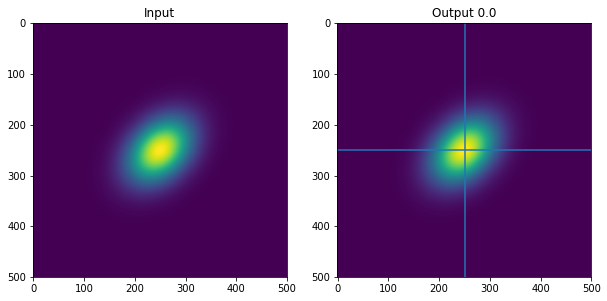

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.99985 250.03   ]
 [249.97    252.99985]]
(2, 3)


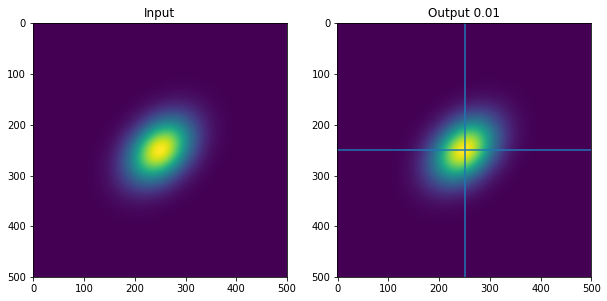

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.     250.    ]
 [252.9994 250.06  ]
 [249.94   252.9994]]
(2, 3)


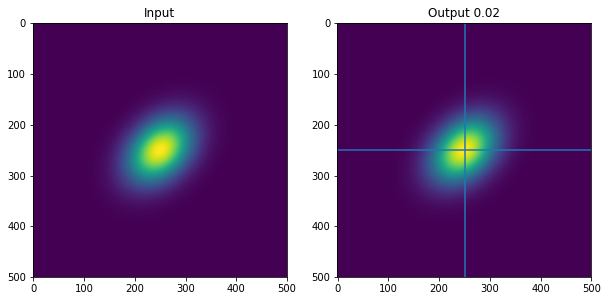

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.99866 250.08998]
 [249.91002 252.99866]]
(2, 3)


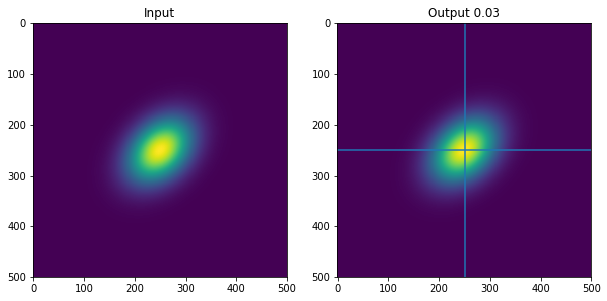

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.9976  250.11996]
 [249.88004 252.9976 ]]
(2, 3)


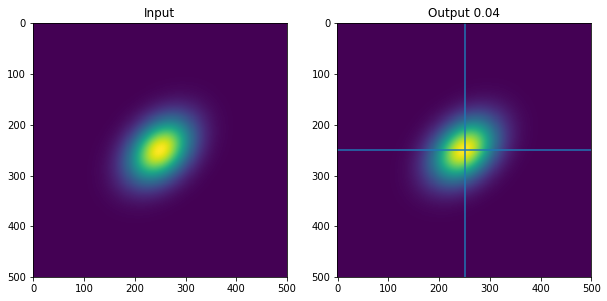

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.99625 250.14993]
 [249.85007 252.99625]]
(2, 3)


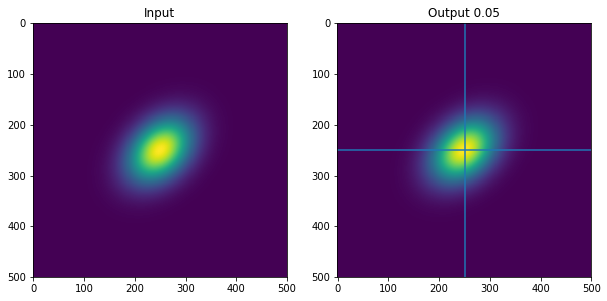

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.9946  250.17989]
 [249.82011 252.9946 ]]
(2, 3)


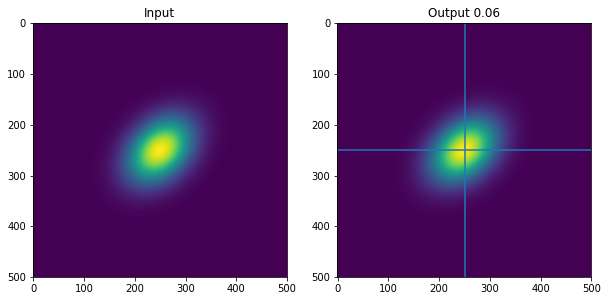

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.99265 250.20982]
 [249.79018 252.99265]]
(2, 3)


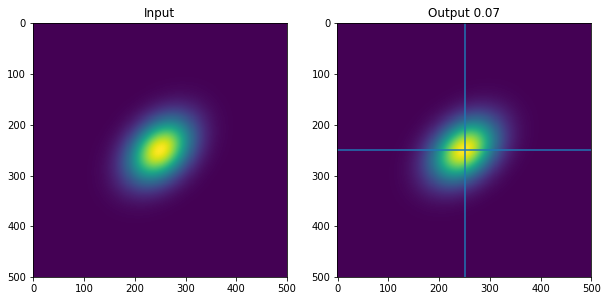

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.9904  250.23975]
 [249.76025 252.9904 ]]
(2, 3)


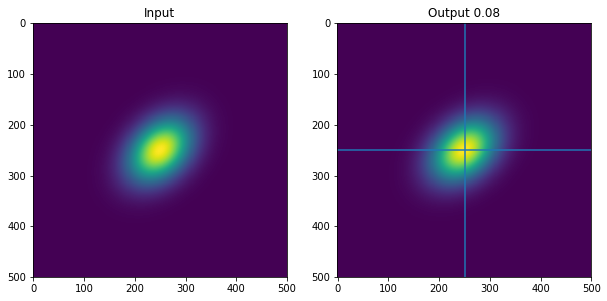

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.98785 250.26964]
 [249.73036 252.98785]]
(2, 3)


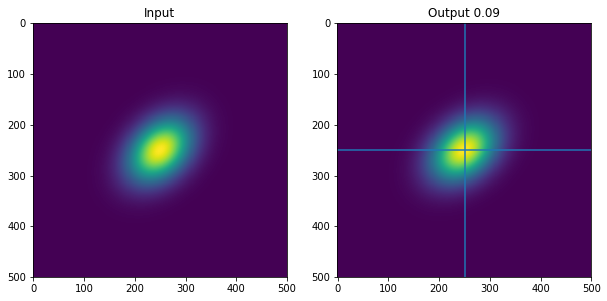

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.98502 250.2995 ]
 [249.7005  252.98502]]
(2, 3)


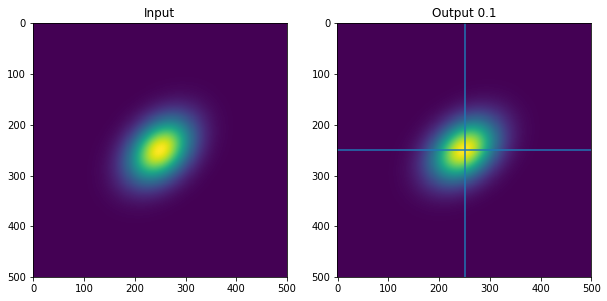

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.98187 250.32933]
 [249.67067 252.98187]]
(2, 3)


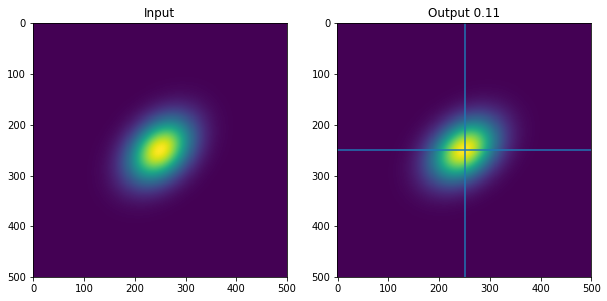

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.97842 250.35913]
 [249.64087 252.97842]]
(2, 3)


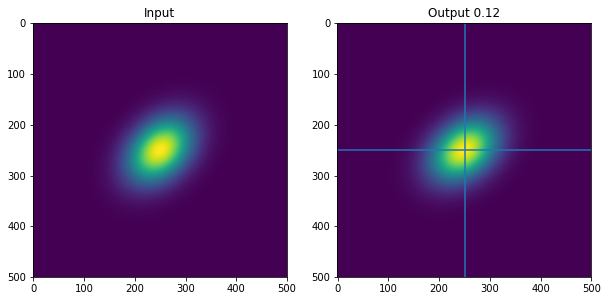

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.97469 250.3889 ]
 [249.6111  252.97469]]
(2, 3)


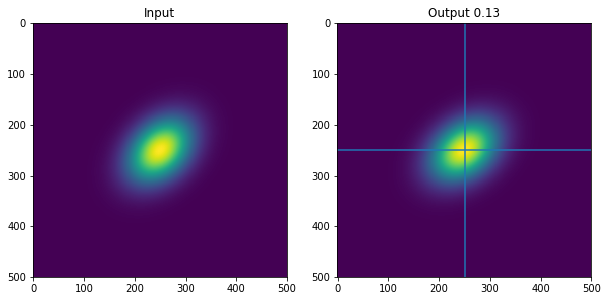

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.97064 250.41862]
 [249.58138 252.97064]]
(2, 3)


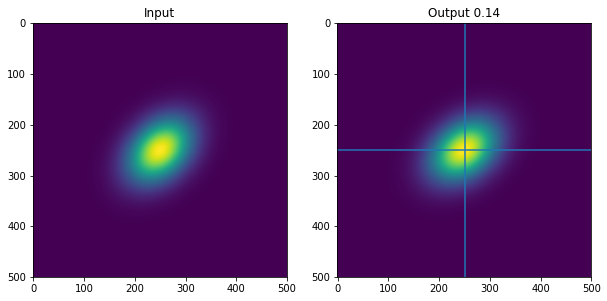

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.96631 250.44832]
 [249.55168 252.96631]]
(2, 3)


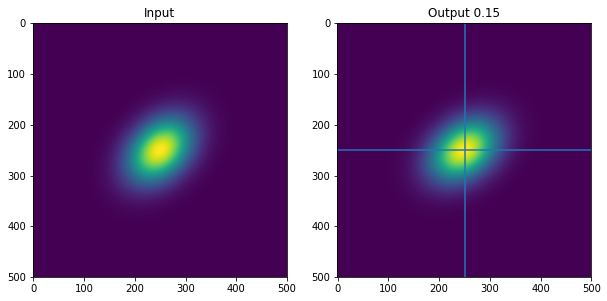

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.96169 250.47795]
 [249.52205 252.96169]]
(2, 3)


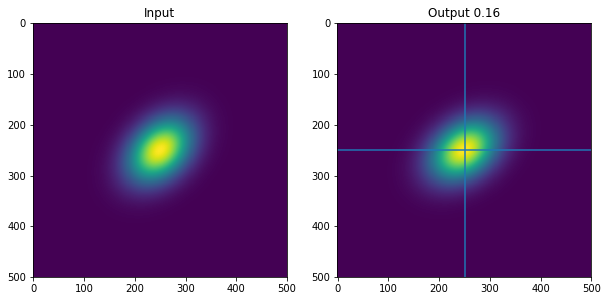

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.95676 250.50755]
 [249.49245 252.95676]]
(2, 3)


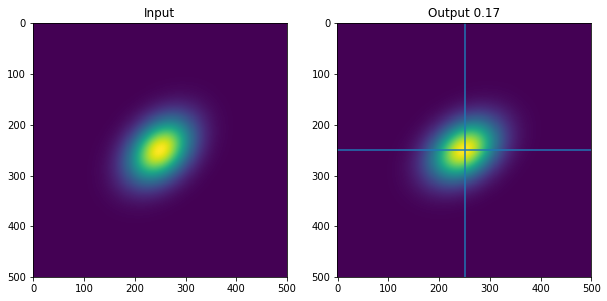

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.95154 250.5371 ]
 [249.4629  252.95154]]
(2, 3)


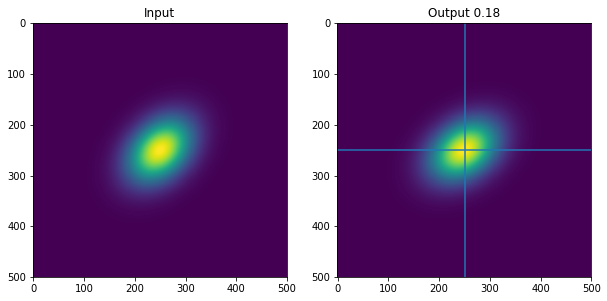

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.94601 250.56657]
 [249.43343 252.94601]]
(2, 3)


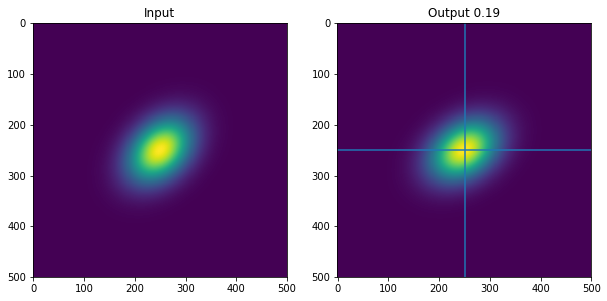

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.9402  250.59601]
 [249.40399 252.9402 ]]
(2, 3)


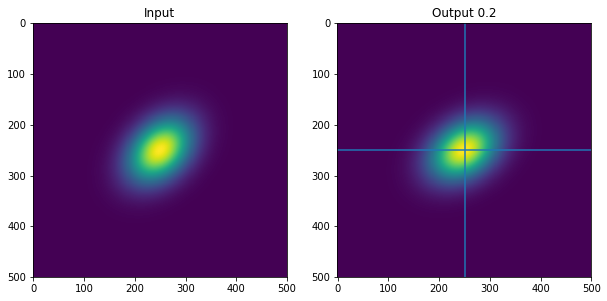

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.9341  250.62538]
 [249.37462 252.9341 ]]
(2, 3)


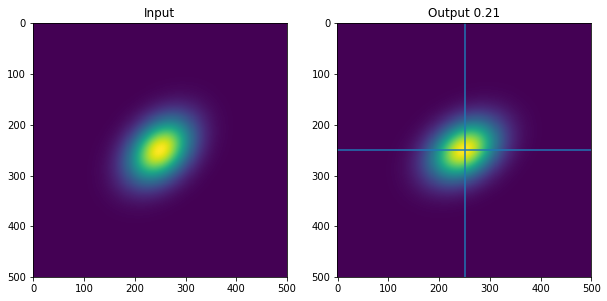

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.92769 250.6547 ]
 [249.3453  252.92769]]
(2, 3)


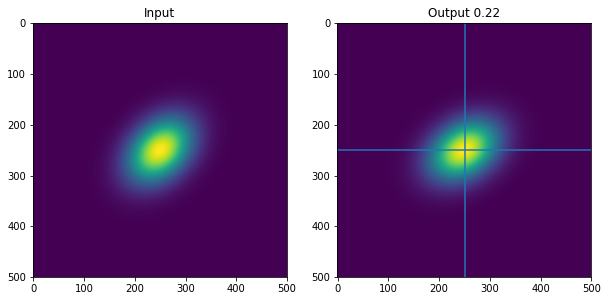

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.921   250.68393]
 [249.31607 252.921  ]]
(2, 3)


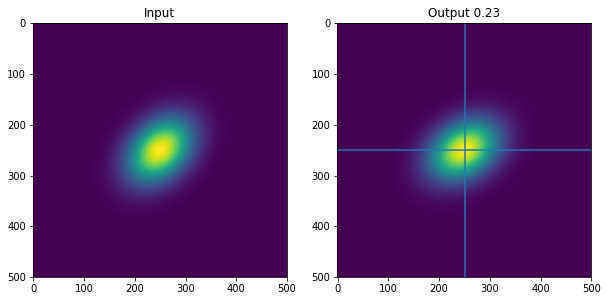

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.91402 250.7131 ]
 [249.2869  252.91402]]
(2, 3)


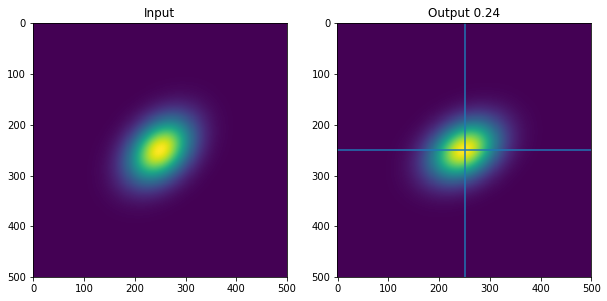

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.90674 250.74222]
 [249.25778 252.90674]]
(2, 3)


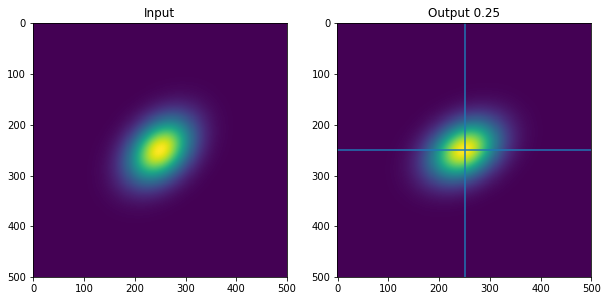

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.89917 250.77124]
 [249.22876 252.89917]]
(2, 3)


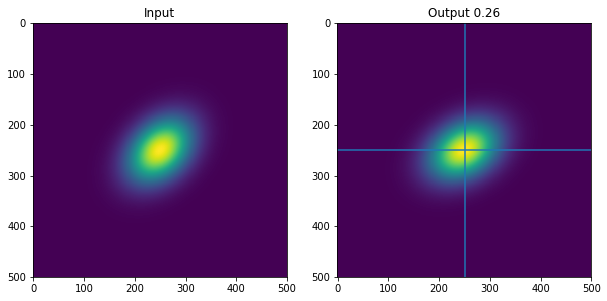

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.89131 250.8002 ]
 [249.1998  252.89131]]
(2, 3)


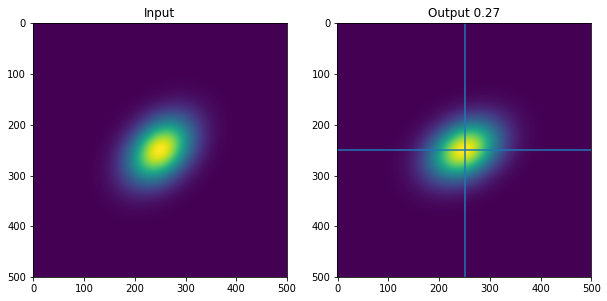

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.88316 250.82907]
 [249.17093 252.88316]]
(2, 3)


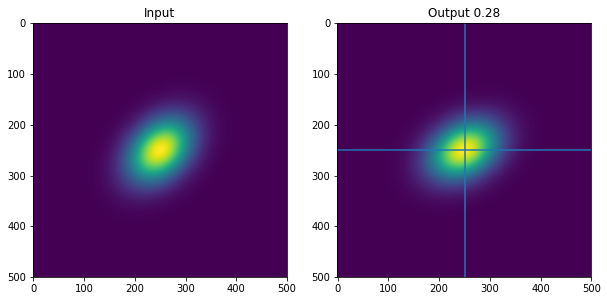

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.87473 250.85785]
 [249.14215 252.87473]]
(2, 3)


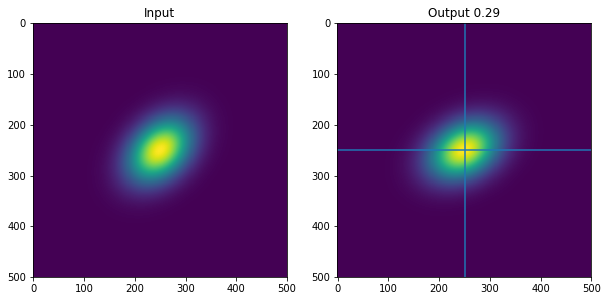

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.86601 250.88657]
 [249.11343 252.86601]]
(2, 3)


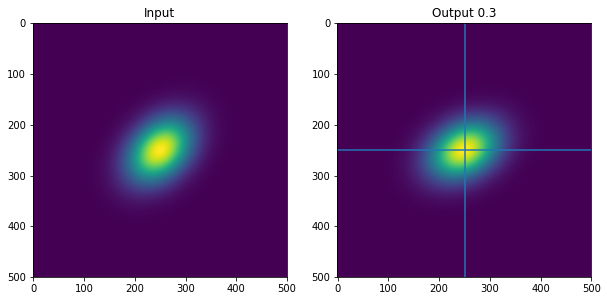

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.857   250.91518]
 [249.08482 252.857  ]]
(2, 3)


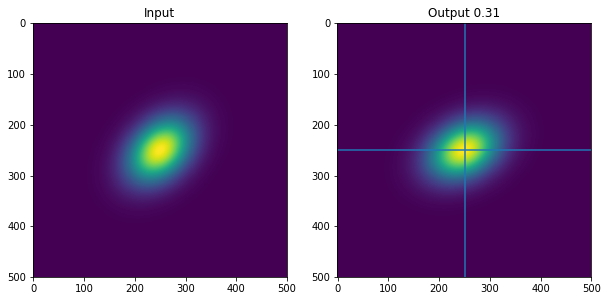

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.     250.    ]
 [252.8477 250.9437]
 [249.0563 252.8477]]
(2, 3)


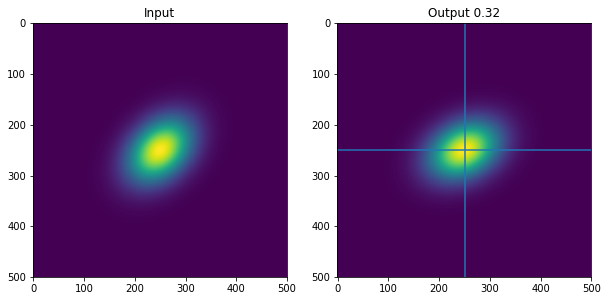

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.83813 250.97212]
 [249.02788 252.83813]]
(2, 3)


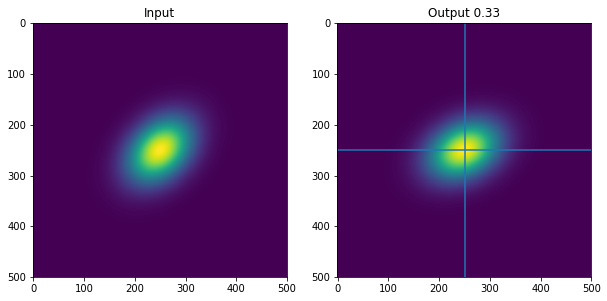

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.82826 251.00046]
 [248.99954 252.82826]]
(2, 3)


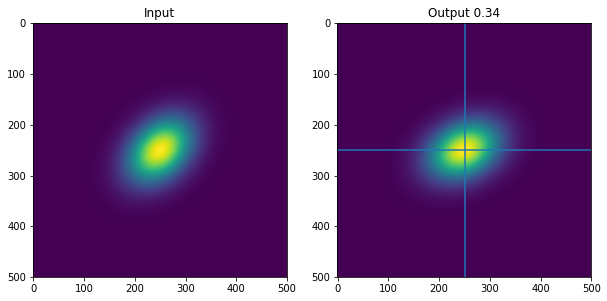

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.81812 251.02869]
 [248.97131 252.81812]]
(2, 3)


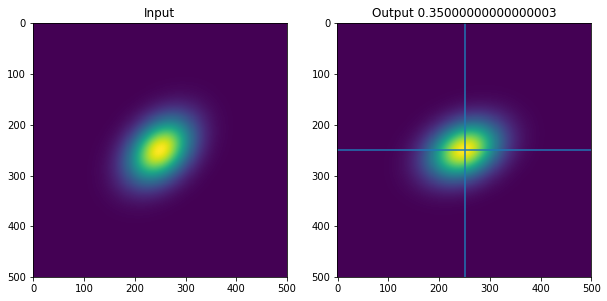

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.8077  251.05682]
 [248.94318 252.8077 ]]
(2, 3)


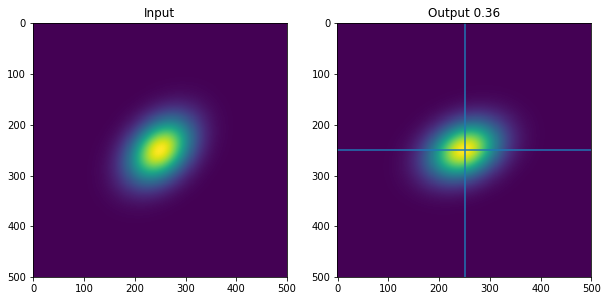

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.79698 251.08484]
 [248.91516 252.79698]]
(2, 3)


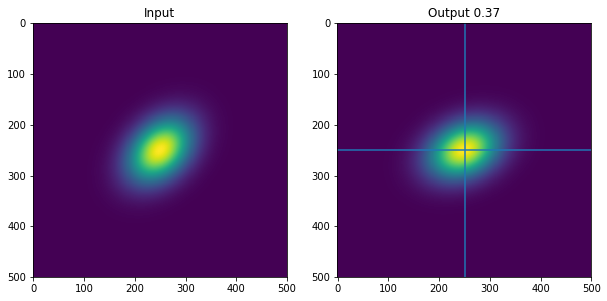

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.786   251.11276]
 [248.88724 252.786  ]]
(2, 3)


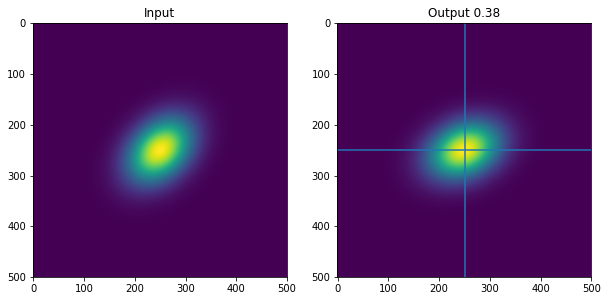

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.77473 251.14056]
 [248.85944 252.77473]]
(2, 3)


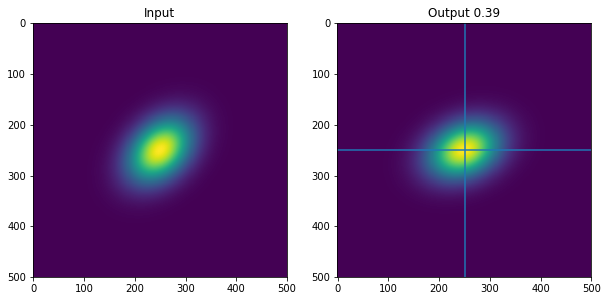

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.76318 251.16826]
 [248.83174 252.76318]]
(2, 3)


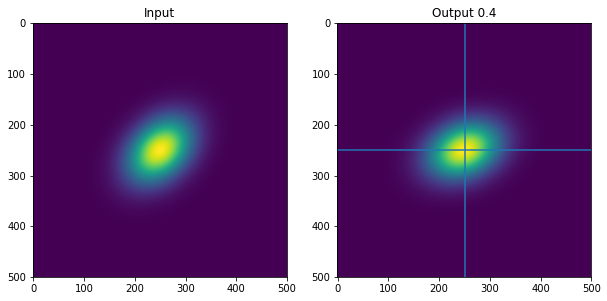

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.75136 251.19583]
 [248.80417 252.75136]]
(2, 3)


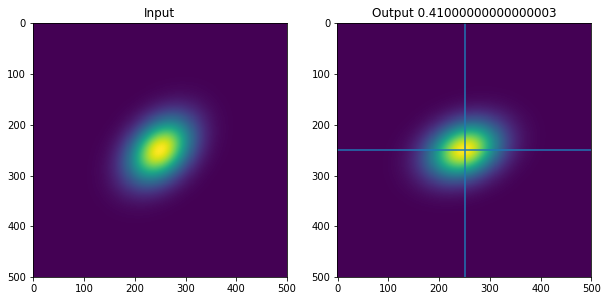

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.73927 251.22328]
 [248.77672 252.73927]]
(2, 3)


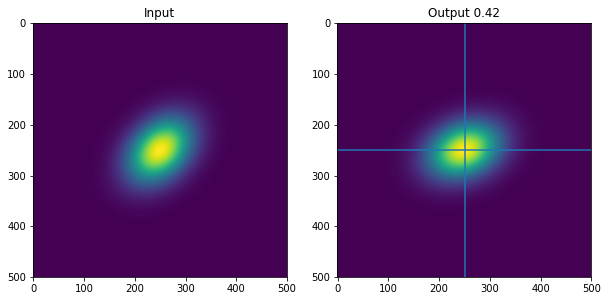

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.7269  251.25061]
 [248.74939 252.7269 ]]
(2, 3)


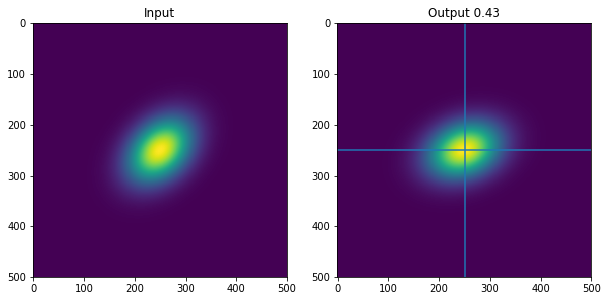

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.71425 251.27782]
 [248.72218 252.71425]]
(2, 3)


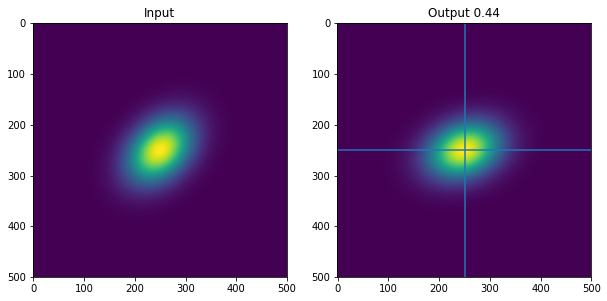

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.70134 251.3049 ]
 [248.6951  252.70134]]
(2, 3)


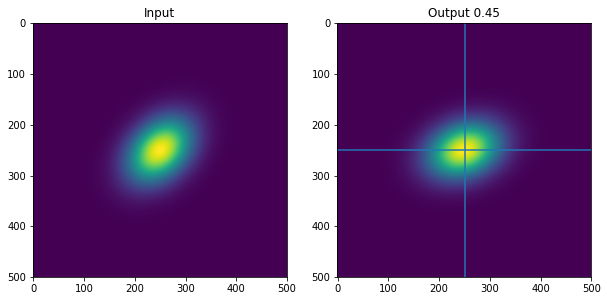

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.68816 251.33185]
 [248.66815 252.68816]]
(2, 3)


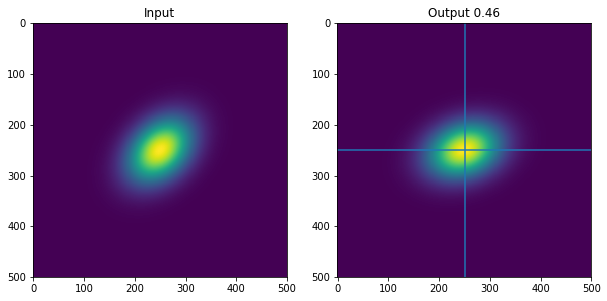

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.6747  251.35866]
 [248.64134 252.6747 ]]
(2, 3)


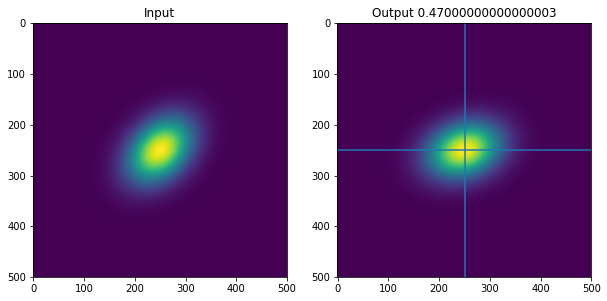

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.66098 251.38533]
 [248.61467 252.66098]]
(2, 3)


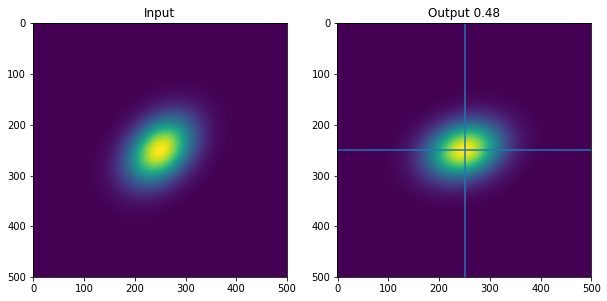

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.647   251.41188]
 [248.58812 252.647  ]]
(2, 3)


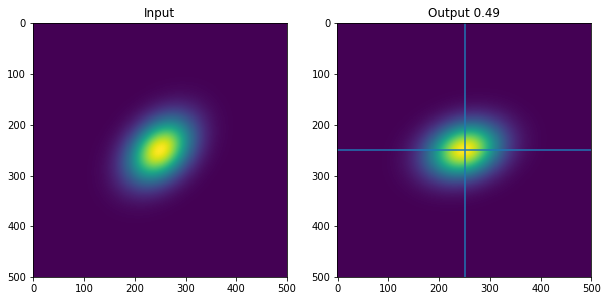

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.63275 251.43828]
 [248.56172 252.63275]]
(2, 3)


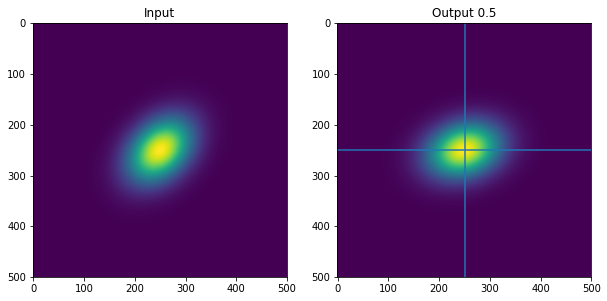

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.61824 251.46454]
 [248.53546 252.61824]]
(2, 3)


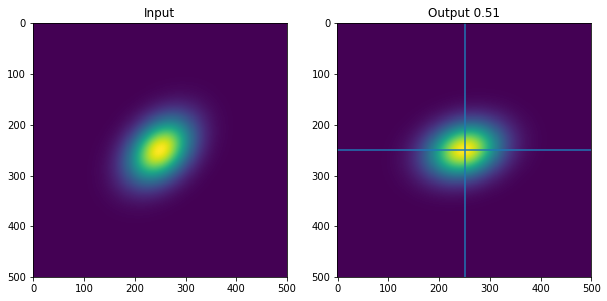

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.60345 251.49065]
 [248.50935 252.60345]]
(2, 3)


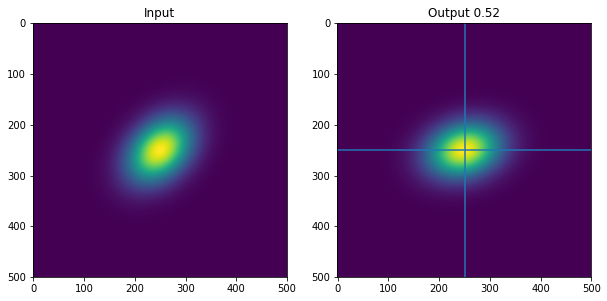

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.58842 251.5166 ]
 [248.4834  252.58842]]
(2, 3)


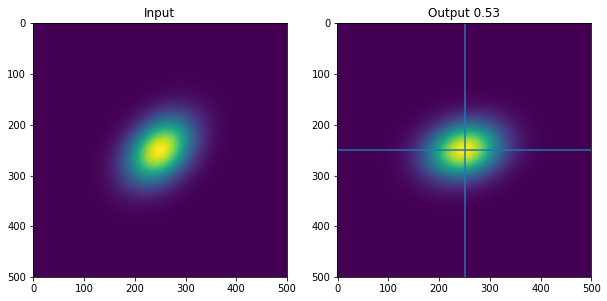

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.57312 251.5424 ]
 [248.4576  252.57312]]
(2, 3)


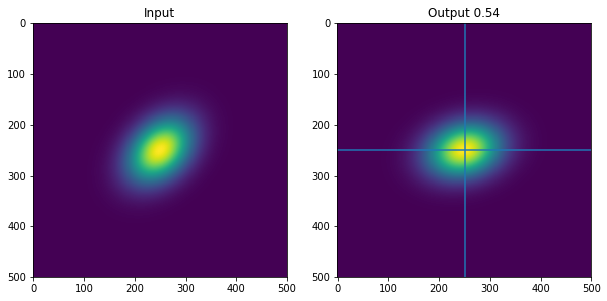

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.55757 251.56805]
 [248.43195 252.55757]]
(2, 3)


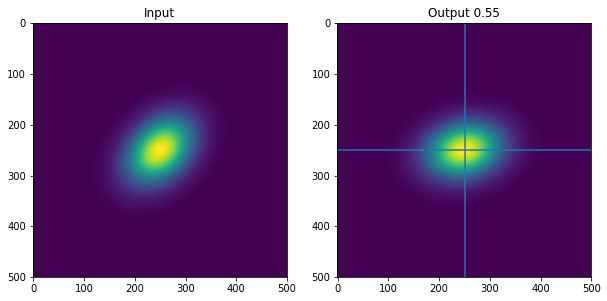

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.54176 251.59355]
 [248.40645 252.54176]]
(2, 3)


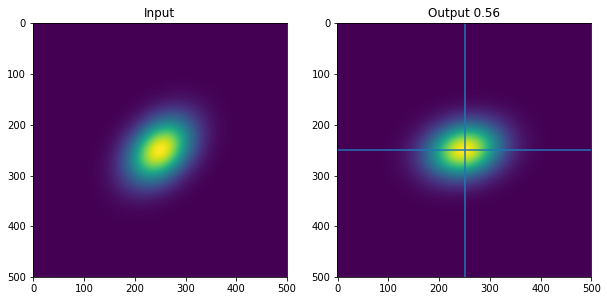

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.     250.    ]
 [252.5257 251.6189]
 [248.3811 252.5257]]
(2, 3)


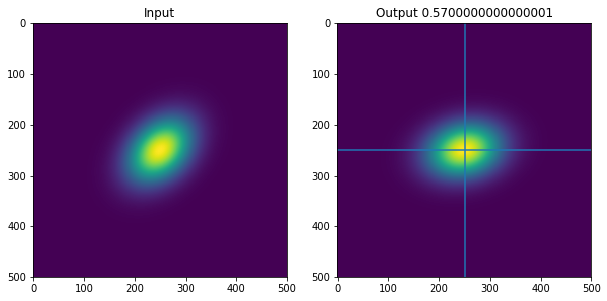

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.50938 251.64407]
 [248.35593 252.50938]]
(2, 3)


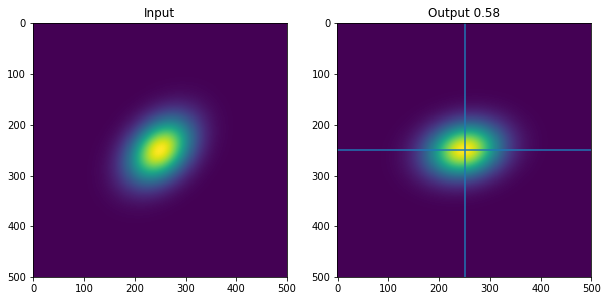

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.49283 251.66908]
 [248.33092 252.49283]]
(2, 3)


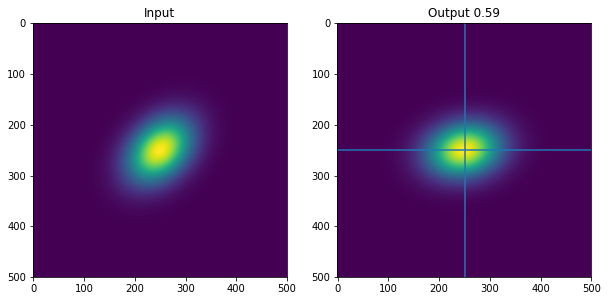

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.47601 251.69392]
 [248.30608 252.47601]]
(2, 3)


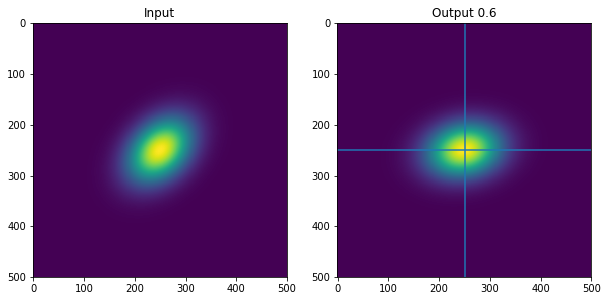

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.45894 251.7186 ]
 [248.2814  252.45894]]
(2, 3)


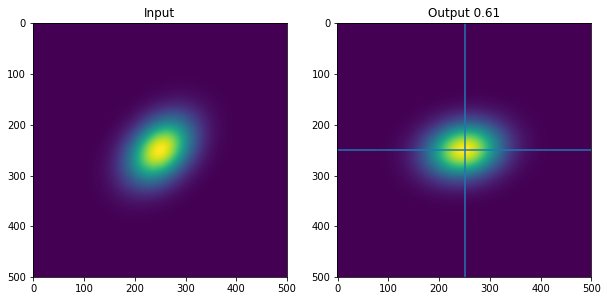

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.44164 251.7431 ]
 [248.2569  252.44164]]
(2, 3)


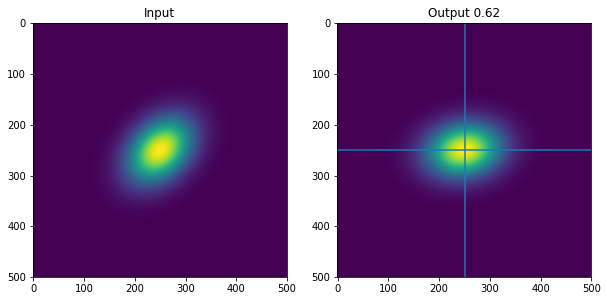

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.42409 251.76744]
 [248.23256 252.42409]]
(2, 3)


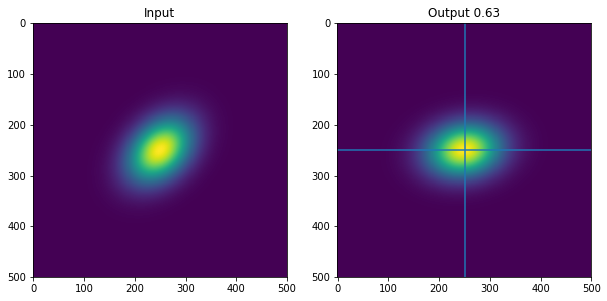

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.40628 251.79158]
 [248.20842 252.40628]]
(2, 3)


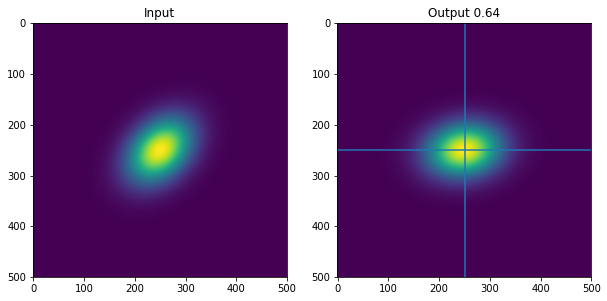

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.38824 251.81555]
 [248.18445 252.38824]]
(2, 3)


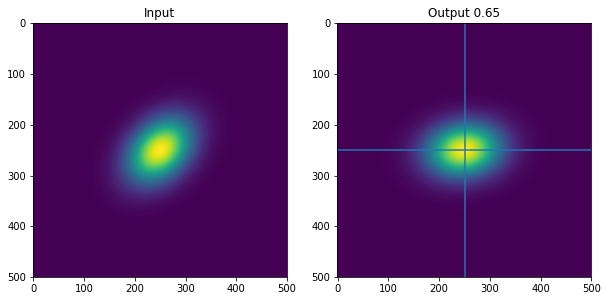

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.36998 251.83936]
 [248.16064 252.36998]]
(2, 3)


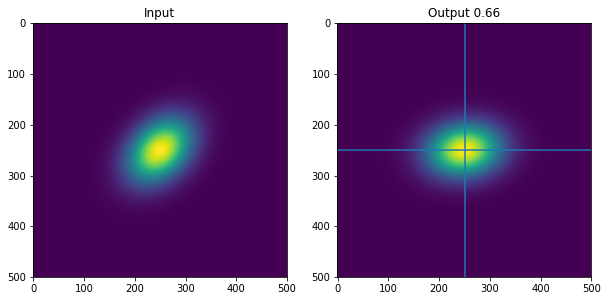

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.35147 251.86296]
 [248.13704 252.35147]]
(2, 3)


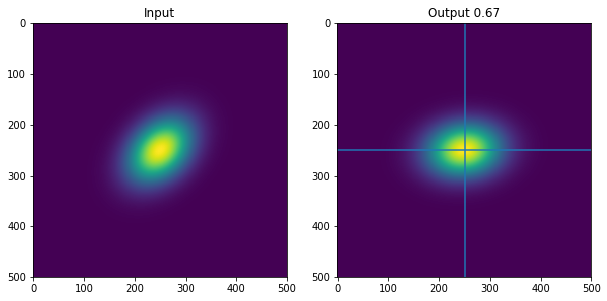

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.33272 251.88638]
 [248.11362 252.33272]]
(2, 3)


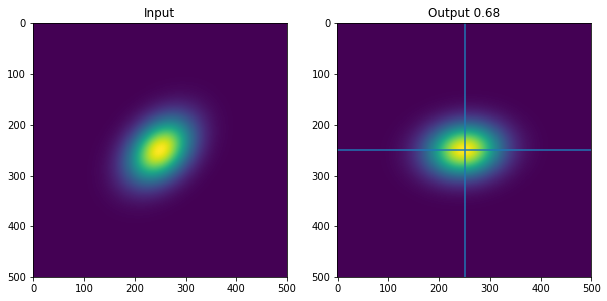

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.31374 251.9096 ]
 [248.0904  252.31374]]
(2, 3)


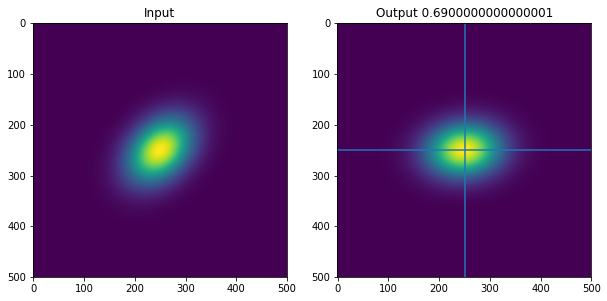

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.29453 251.93265]
 [248.06735 252.29453]]
(2, 3)


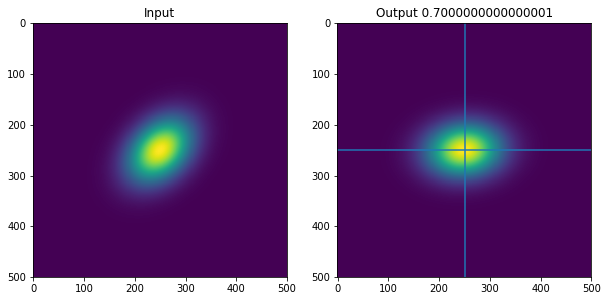

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.27509 251.9555 ]
 [248.0445  252.27509]]
(2, 3)


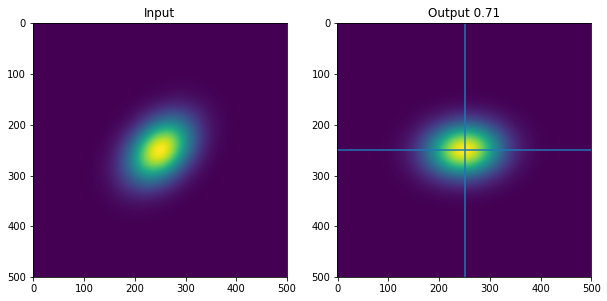

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.25542 251.97815]
 [248.02185 252.25542]]
(2, 3)


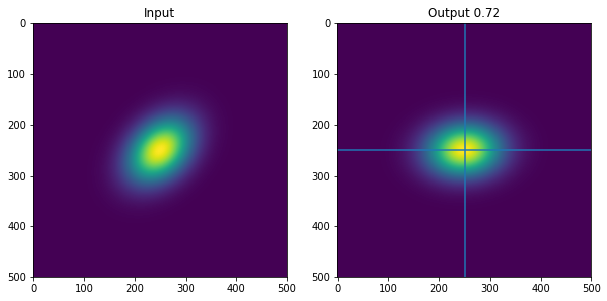

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.23552 252.00061]
 [247.99939 252.23552]]
(2, 3)


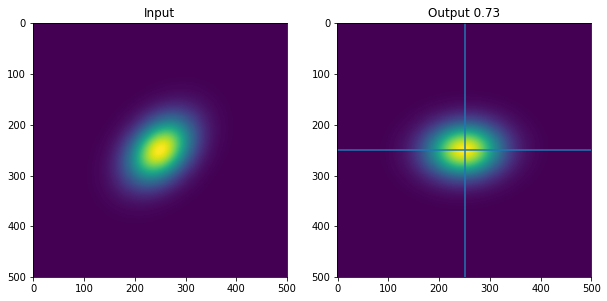

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.21541 252.02286]
 [247.97714 252.21541]]
(2, 3)


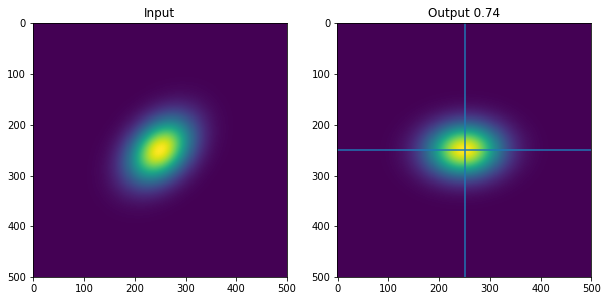

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.19507 252.04492]
 [247.95508 252.19507]]
(2, 3)


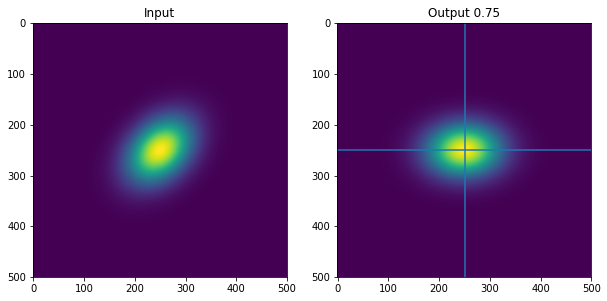

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.17451 252.06676]
 [247.93324 252.17451]]
(2, 3)


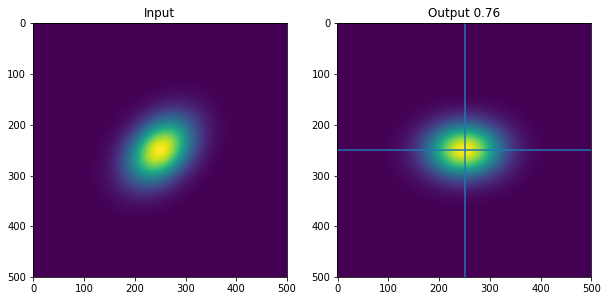

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.15373 252.08841]
 [247.91159 252.15373]]
(2, 3)


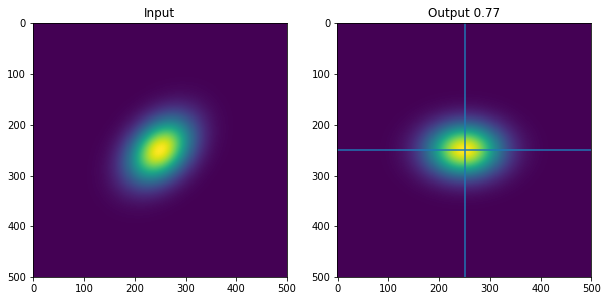

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.13274 252.10983]
 [247.89017 252.13274]]
(2, 3)


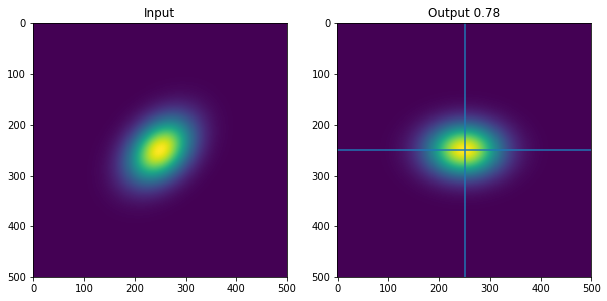

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.11154 252.13106]
 [247.86894 252.11154]]
(2, 3)


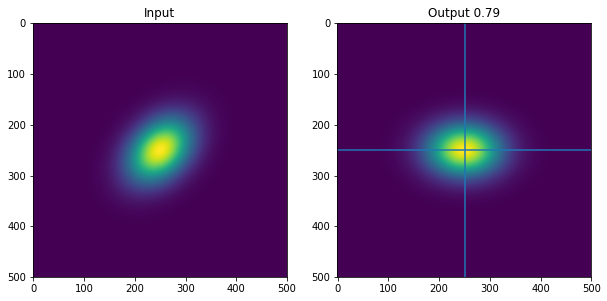

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.09012 252.15207]
 [247.84793 252.09012]]
(2, 3)


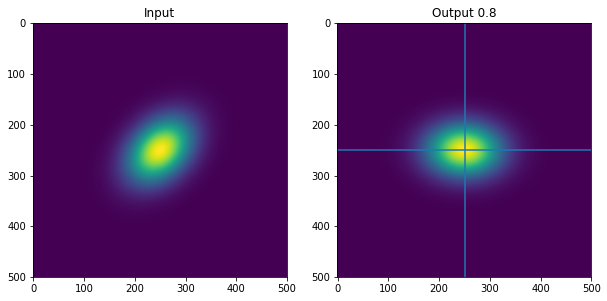

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.0685  252.17287]
 [247.82713 252.0685 ]]
(2, 3)


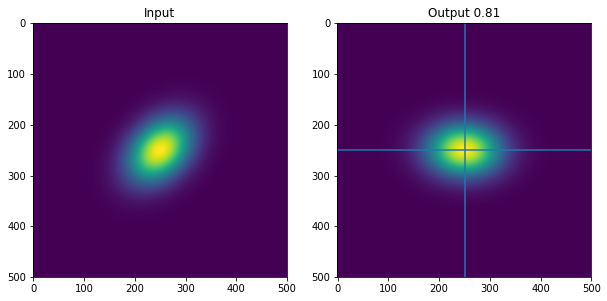

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.04666 252.19344]
 [247.80656 252.04666]]
(2, 3)


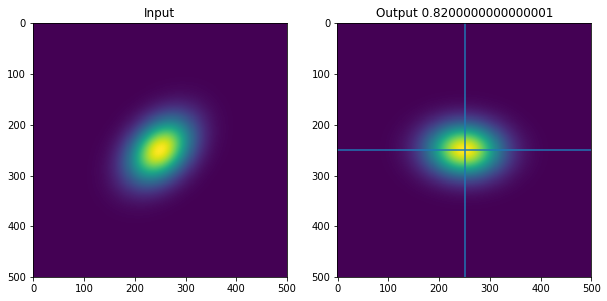

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.02463 252.21379]
 [247.78621 252.02463]]
(2, 3)


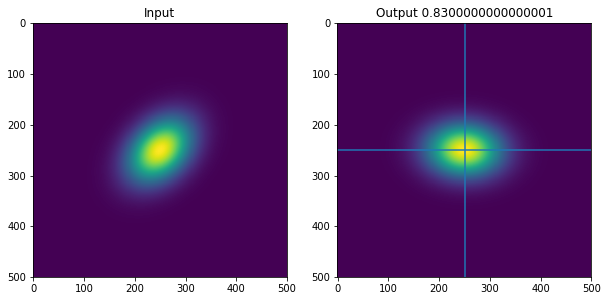

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [252.0024  252.23393]
 [247.76607 252.0024 ]]
(2, 3)


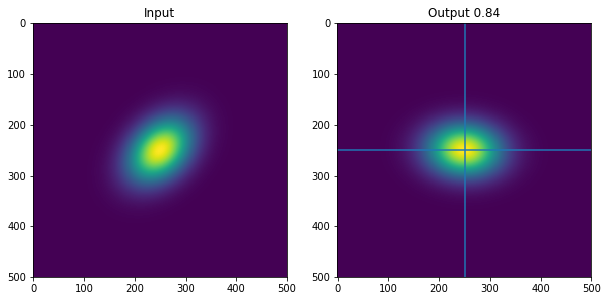

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.97995 252.25385]
 [247.74615 251.97995]]
(2, 3)


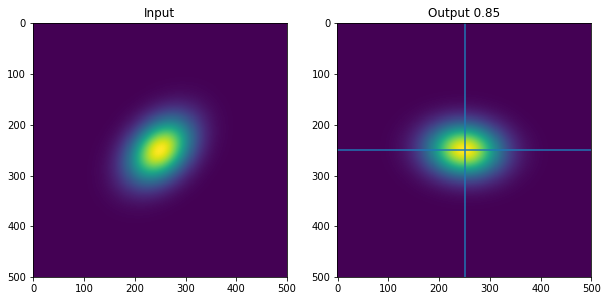

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.9573  252.27353]
 [247.72647 251.9573 ]]
(2, 3)


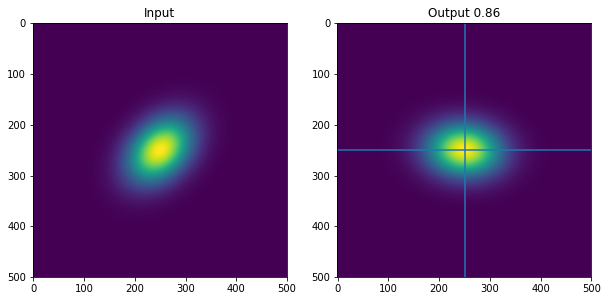

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.93448 252.29298]
 [247.70702 251.93448]]
(2, 3)


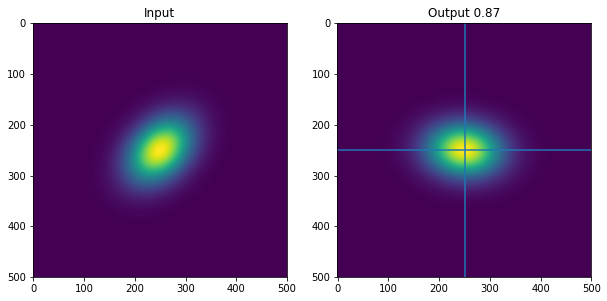

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.91145 252.31221]
 [247.68779 251.91145]]
(2, 3)


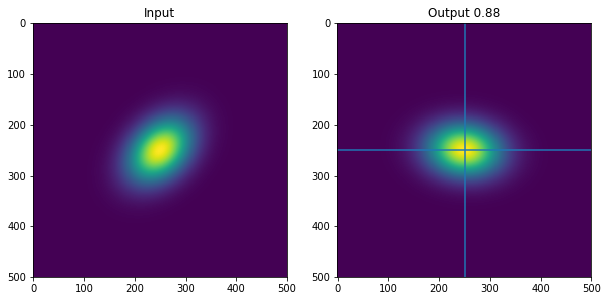

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.88823 252.33122]
 [247.66878 251.88823]]
(2, 3)


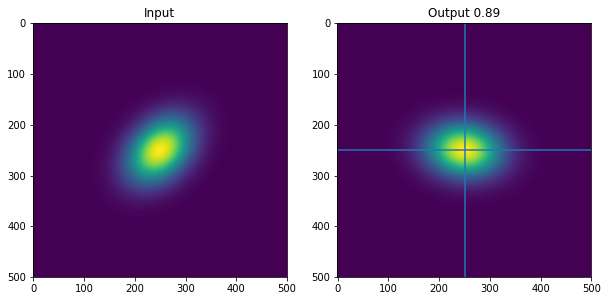

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.86482 252.34998]
 [247.65002 251.86482]]
(2, 3)


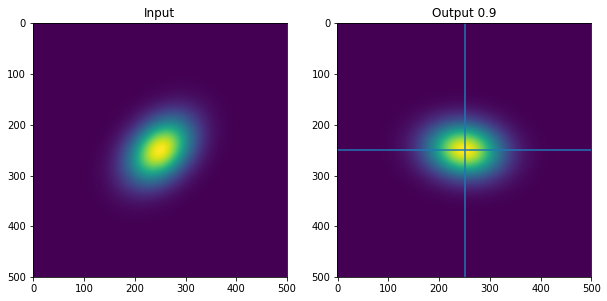

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.84123 252.36852]
 [247.63148 251.84123]]
(2, 3)


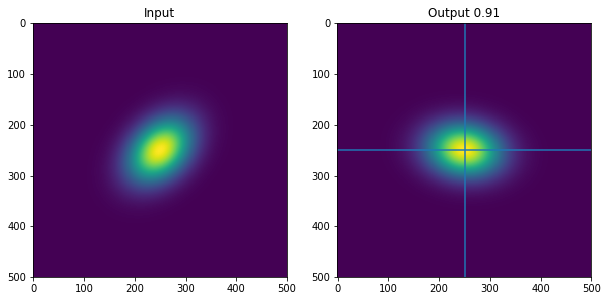

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.81746 252.38681]
 [247.61319 251.81746]]
(2, 3)


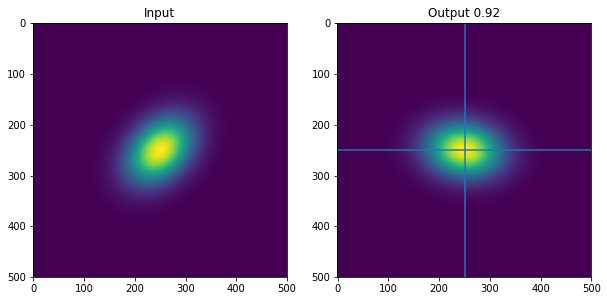

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.7935  252.40486]
 [247.59514 251.7935 ]]
(2, 3)


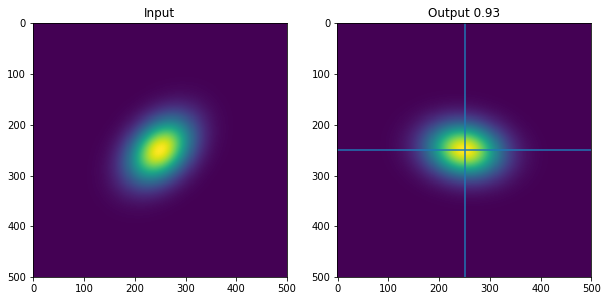

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.76936 252.42267]
 [247.57733 251.76936]]
(2, 3)


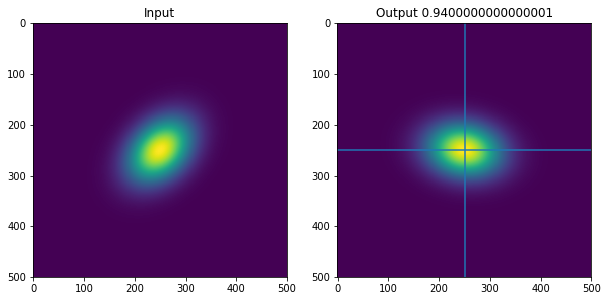

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.74506 252.44025]
 [247.55975 251.74506]]
(2, 3)


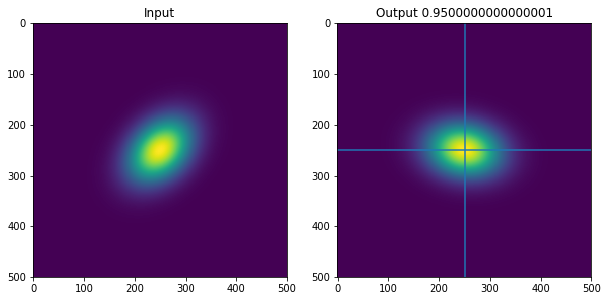

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.72057 252.45758]
 [247.54242 251.72057]]
(2, 3)


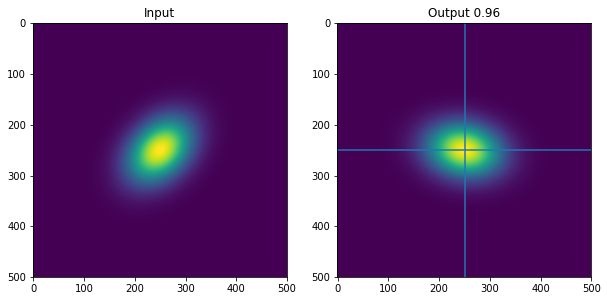

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.69589 252.47466]
 [247.52534 251.69589]]
(2, 3)


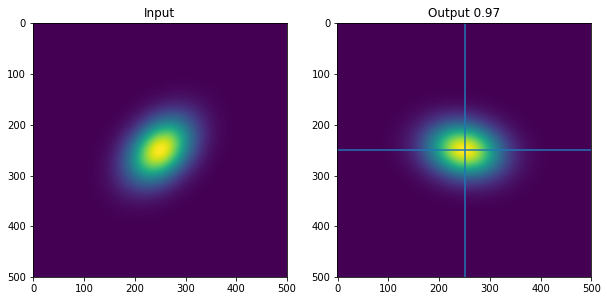

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.67107 252.49149]
 [247.50851 251.67107]]
(2, 3)


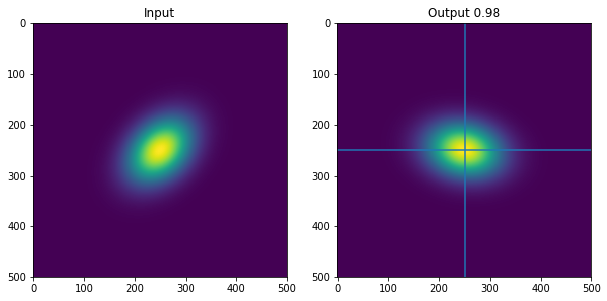

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.64607 252.50807]
 [247.49193 251.64607]]
(2, 3)


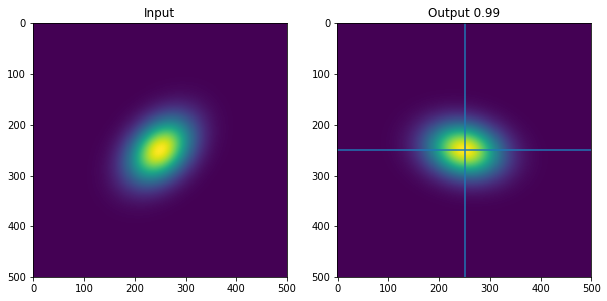

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.62091 252.52441]
 [247.47559 251.62091]]
(2, 3)


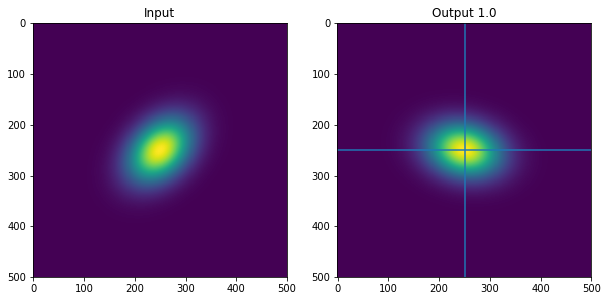

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.59558 252.5405 ]
 [247.4595  251.59558]]
(2, 3)


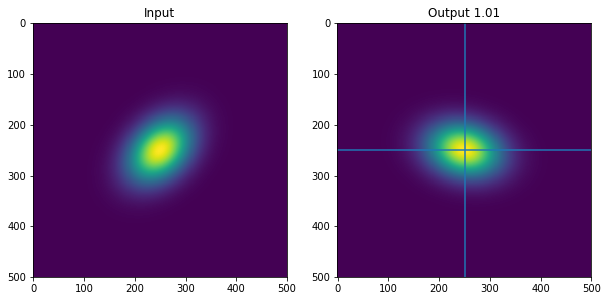

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.5701  252.55632]
 [247.44368 251.5701 ]]
(2, 3)


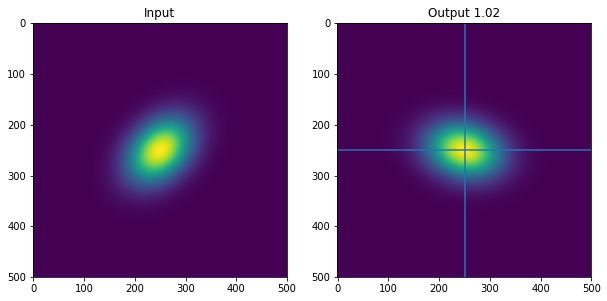

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.54446 252.5719 ]
 [247.4281  251.54446]]
(2, 3)


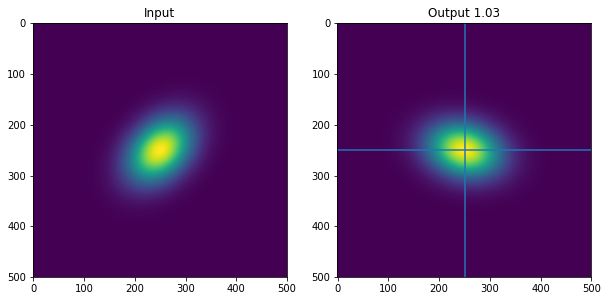

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.51866 252.58722]
 [247.41278 251.51866]]
(2, 3)


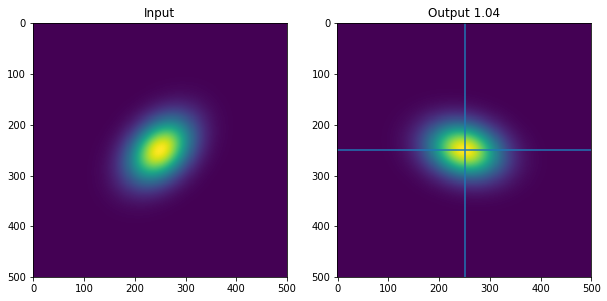

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.4927  252.60226]
 [247.39774 251.4927 ]]
(2, 3)


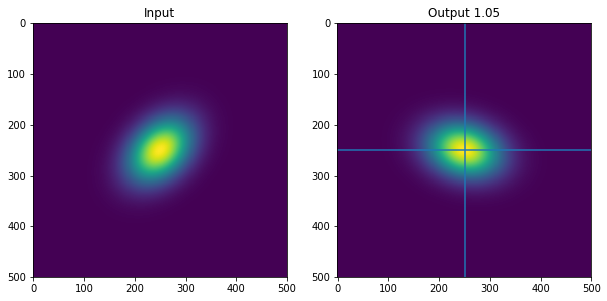

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.46661 252.61707]
 [247.38293 251.46661]]
(2, 3)


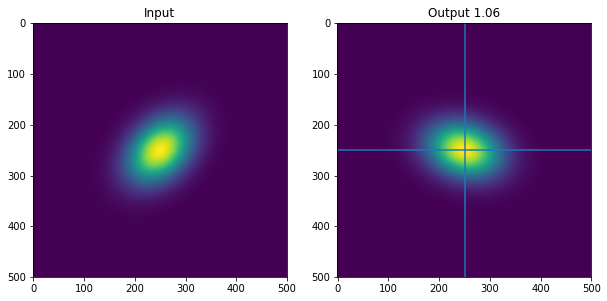

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.44037 252.6316 ]
 [247.3684  251.44037]]
(2, 3)


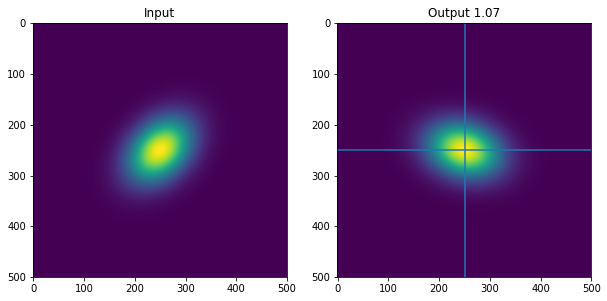

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.41399 252.64587]
 [247.35413 251.41399]]
(2, 3)


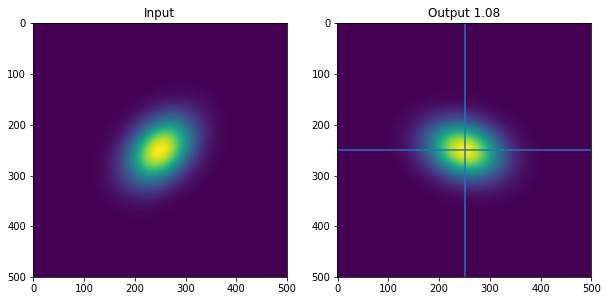

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.38745 252.65988]
 [247.34012 251.38745]]
(2, 3)


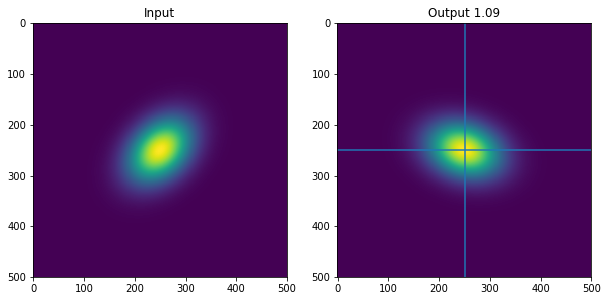

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.3608  252.67361]
 [247.32639 251.3608 ]]
(2, 3)


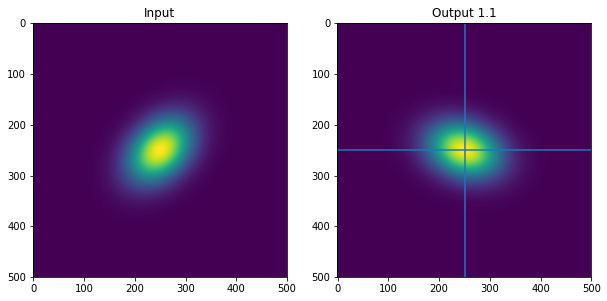

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.33398 252.6871 ]
 [247.3129  251.33398]]
(2, 3)


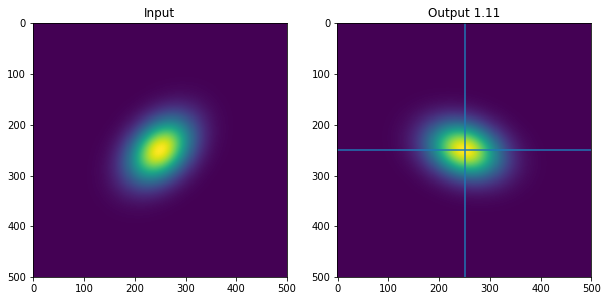

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.30705 252.7003 ]
 [247.2997  251.30705]]
(2, 3)


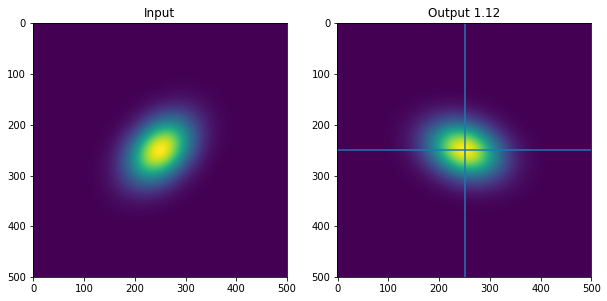

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.27998 252.71324]
 [247.28676 251.27998]]
(2, 3)


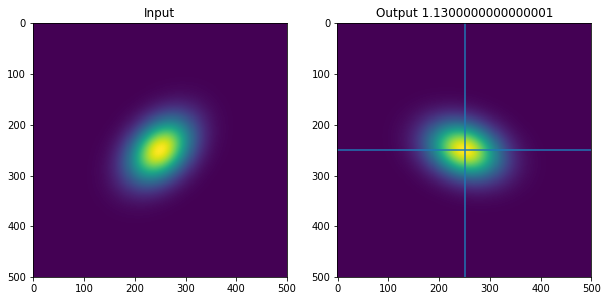

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.25278 252.7259 ]
 [247.2741  251.25278]]
(2, 3)


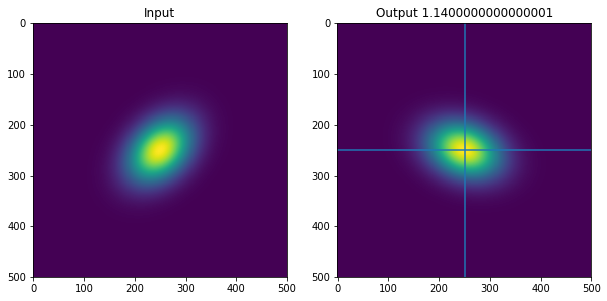

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.22546 252.7383 ]
 [247.2617  251.22546]]
(2, 3)


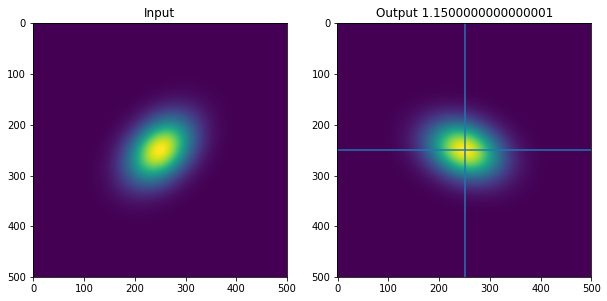

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.19801 252.75041]
 [247.24959 251.19801]]
(2, 3)


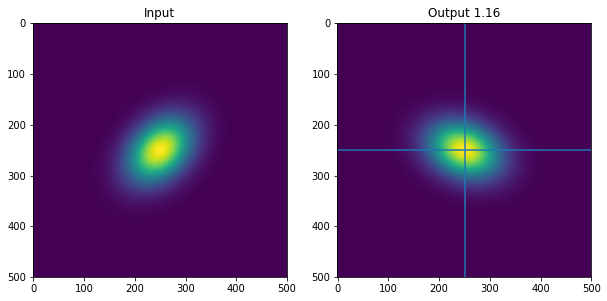

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.17046 252.76225]
 [247.23775 251.17046]]
(2, 3)


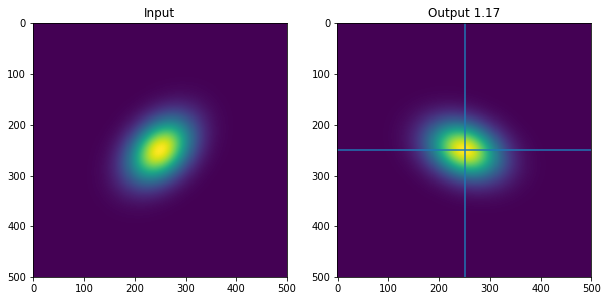

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.14278 252.77382]
 [247.22618 251.14278]]
(2, 3)


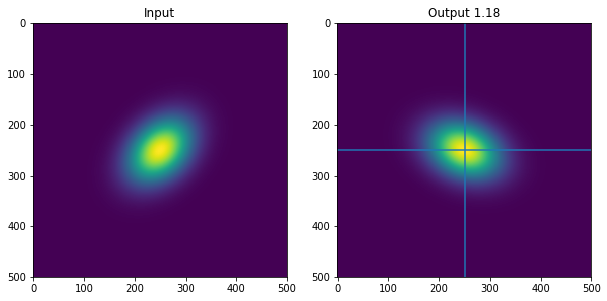

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.11497 252.78511]
 [247.21489 251.11497]]
(2, 3)


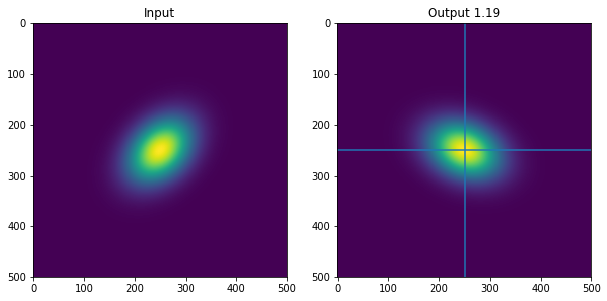

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.08707 252.79611]
 [247.20389 251.08707]]
(2, 3)


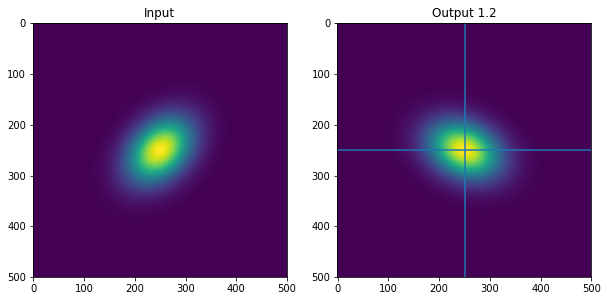

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.05905 252.80685]
 [247.19315 251.05905]]
(2, 3)


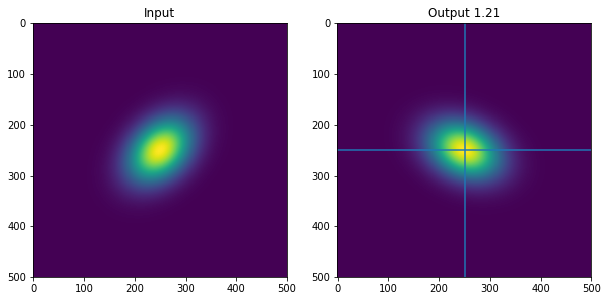

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.03094 252.81729]
 [247.18271 251.03094]]
(2, 3)


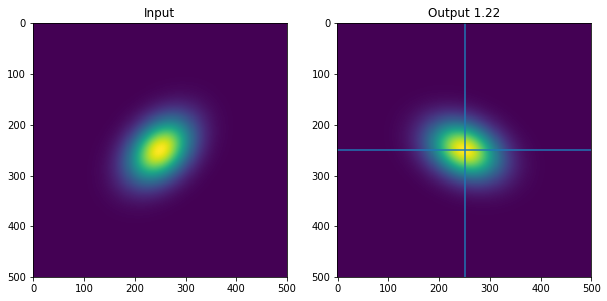

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [251.00272 252.82747]
 [247.17253 251.00272]]
(2, 3)


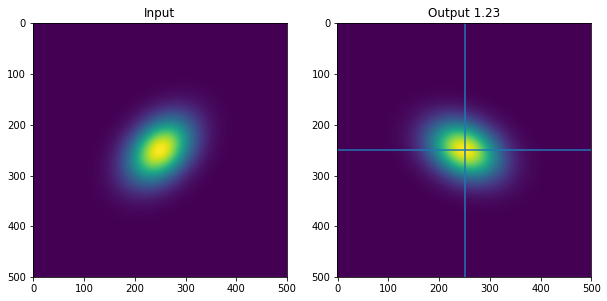

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.9744  252.83736]
 [247.16264 250.9744 ]]
(2, 3)


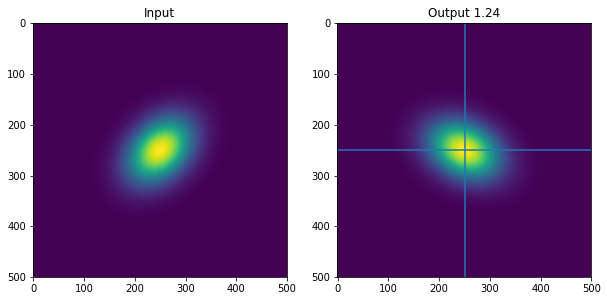

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.94597 252.84695]
 [247.15305 250.94597]]
(2, 3)


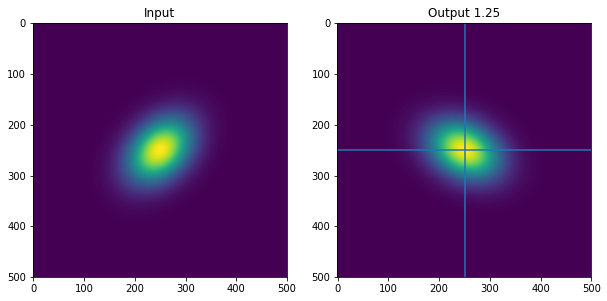

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.91745 252.85628]
 [247.14372 250.91745]]
(2, 3)


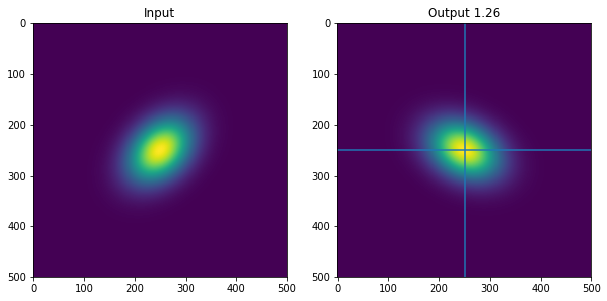

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.88884 252.8653 ]
 [247.1347  250.88884]]
(2, 3)


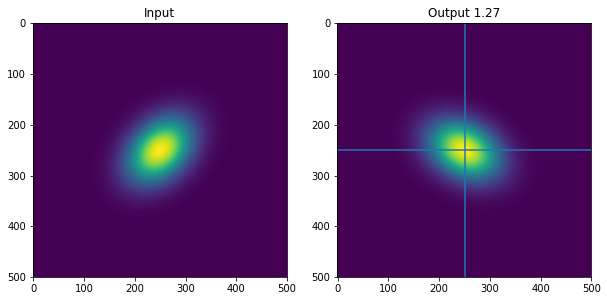

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.86015 252.87405]
 [247.12595 250.86015]]
(2, 3)


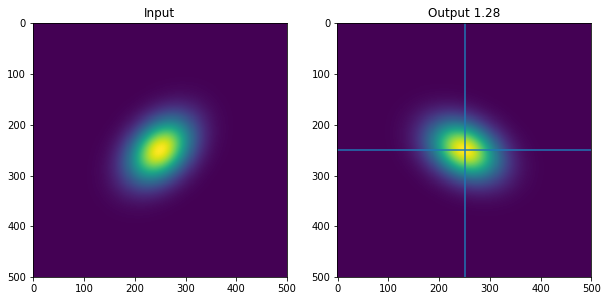

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.83136 252.8825 ]
 [247.1175  250.83136]]
(2, 3)


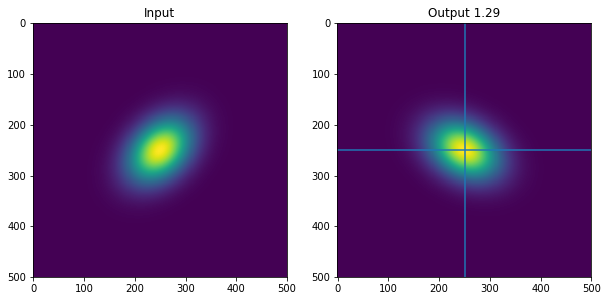

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.80249 252.89067]
 [247.10933 250.80249]]
(2, 3)


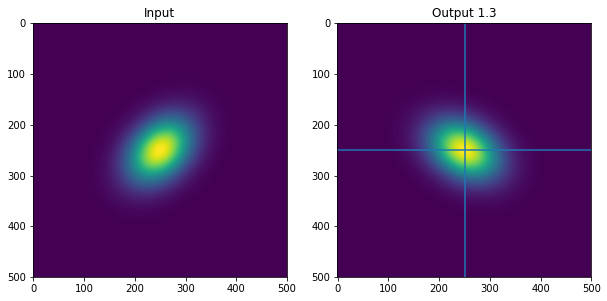

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.77354 252.89856]
 [247.10144 250.77354]]
(2, 3)


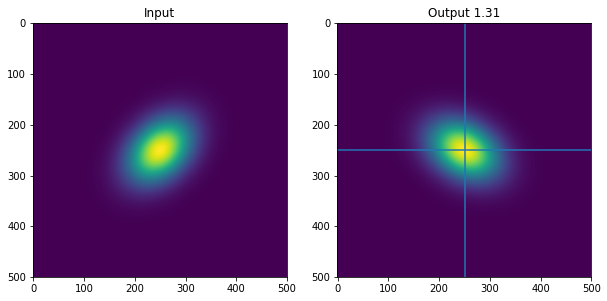

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.74452 252.90614]
 [247.09386 250.74452]]
(2, 3)


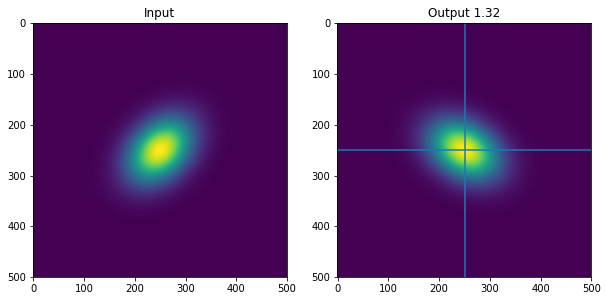

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.71542 252.91345]
 [247.08655 250.71542]]
(2, 3)


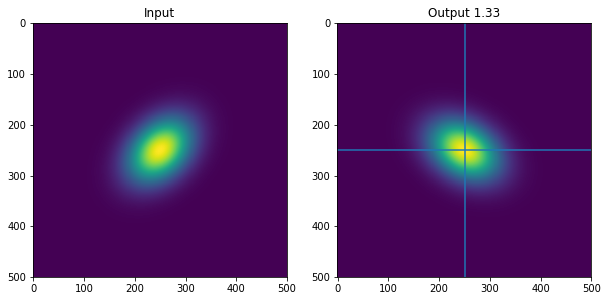

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.68626 252.92046]
 [247.07954 250.68626]]
(2, 3)


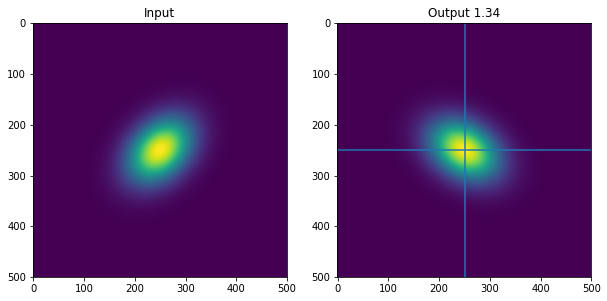

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.65701 252.92717]
 [247.07283 250.65701]]
(2, 3)


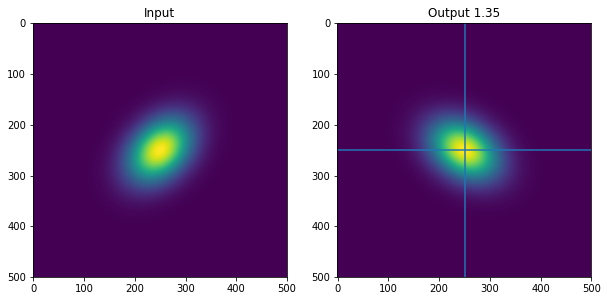

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.62772 252.9336 ]
 [247.0664  250.62772]]
(2, 3)


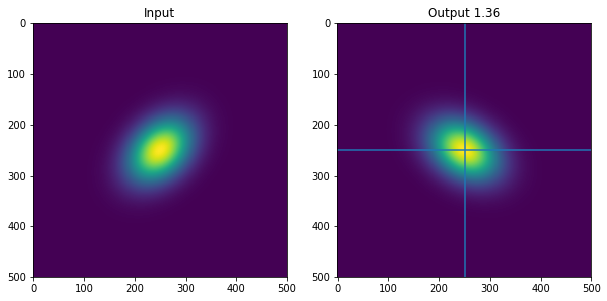

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.59834 252.93973]
 [247.06027 250.59834]]
(2, 3)


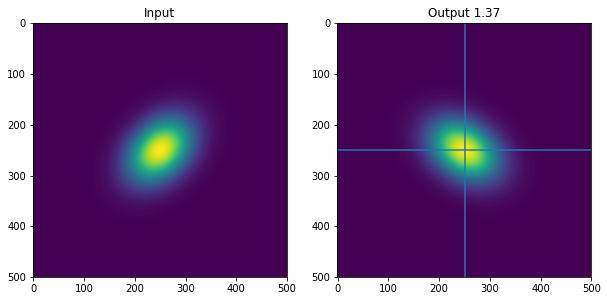

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.56892 252.94556]
 [247.05444 250.56892]]
(2, 3)


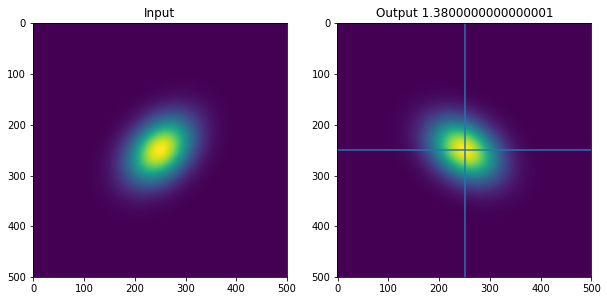

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.53944 252.9511 ]
 [247.0489  250.53944]]
(2, 3)


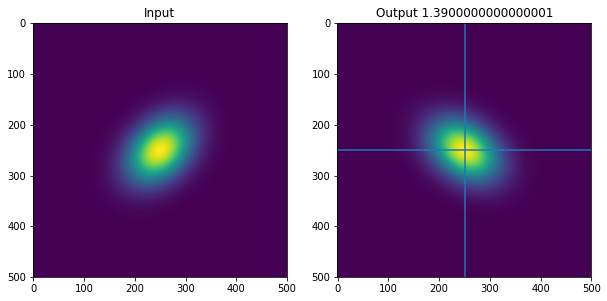

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.5099  252.95634]
 [247.04366 250.5099 ]]
(2, 3)


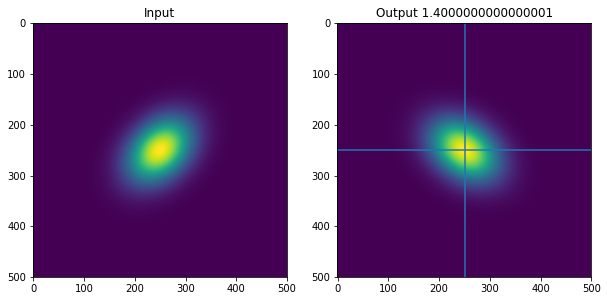

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.48032 252.9613 ]
 [247.0387  250.48032]]
(2, 3)


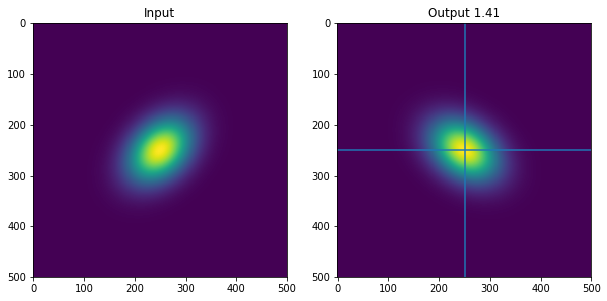

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.45068 252.96596]
 [247.03404 250.45068]]
(2, 3)


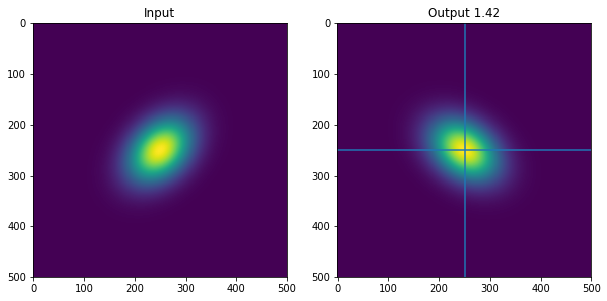

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.42099 252.9703 ]
 [247.0297  250.42099]]
(2, 3)


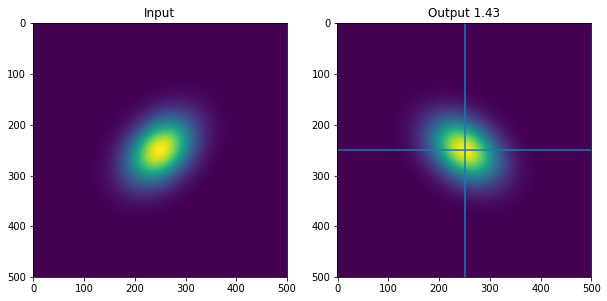

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.39127 252.97438]
 [247.02562 250.39127]]
(2, 3)


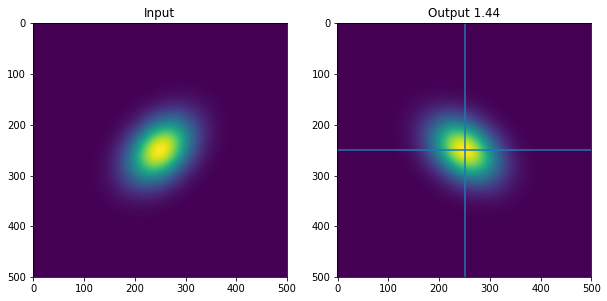

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.36151 252.97813]
 [247.02187 250.36151]]
(2, 3)


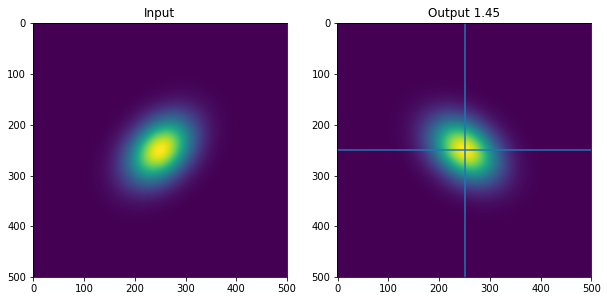

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.33171 252.9816 ]
 [247.0184  250.33171]]
(2, 3)


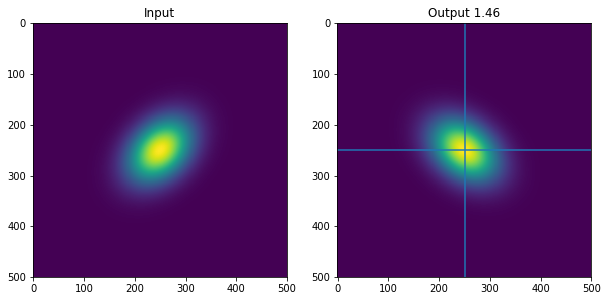

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.30188 252.98477]
 [247.01523 250.30188]]
(2, 3)


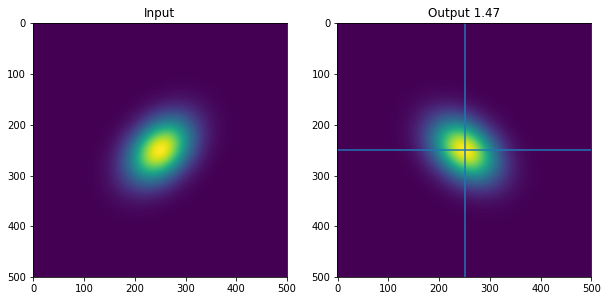

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.27202 252.98764]
 [247.01236 250.27202]]
(2, 3)


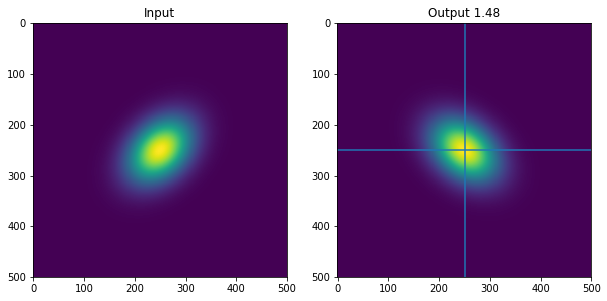

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.24213 252.99022]
 [247.00978 250.24213]]
(2, 3)


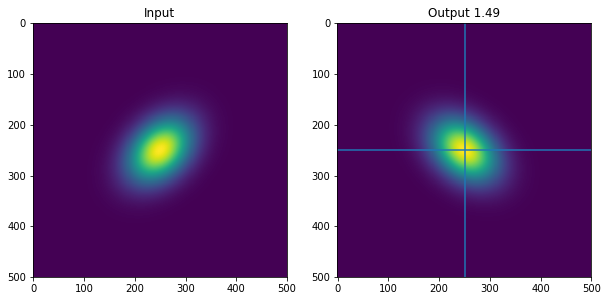

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.21222 252.9925 ]
 [247.0075  250.21222]]
(2, 3)


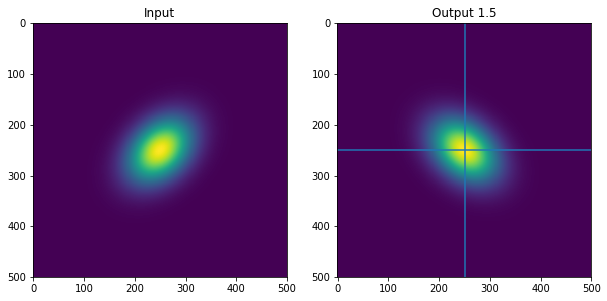

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.18228 252.99446]
 [247.00554 250.18228]]
(2, 3)


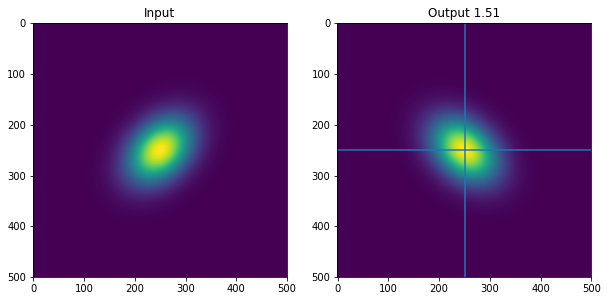

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.15233 252.99612]
 [247.00388 250.15233]]
(2, 3)


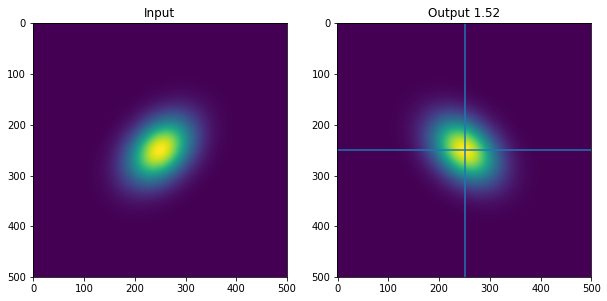

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.12236 252.9975 ]
 [247.0025  250.12236]]
(2, 3)


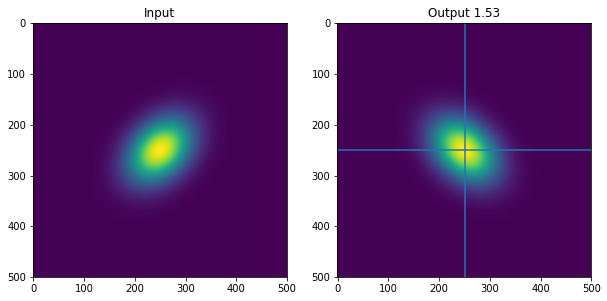

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.09238 252.99858]
 [247.00142 250.09238]]
(2, 3)


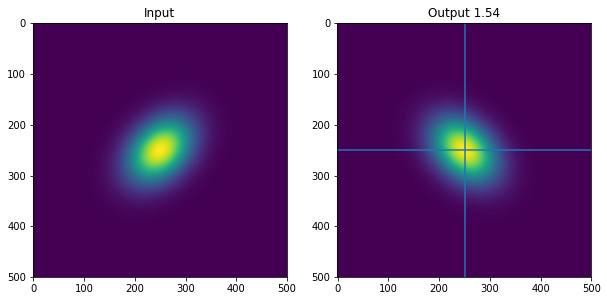

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.06238 252.99934]
 [247.00066 250.06238]]
(2, 3)


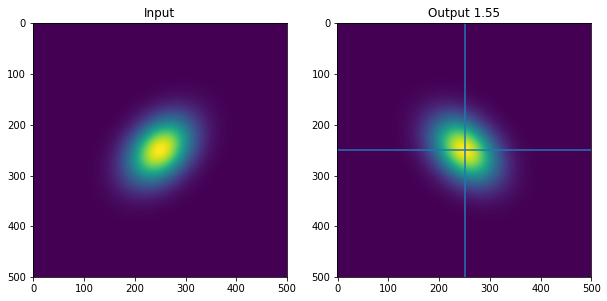

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [250.0324  252.99983]
 [247.00017 250.0324 ]]
(2, 3)


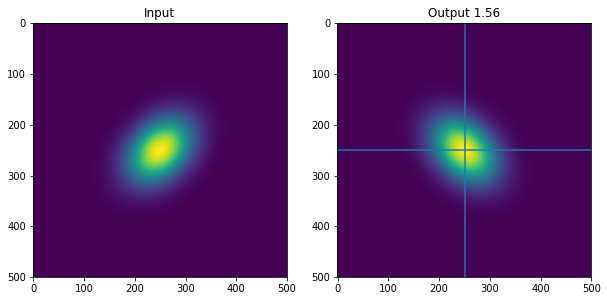

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.     250.    ]
 [250.0024 253.    ]
 [247.     250.0024]]
(2, 3)


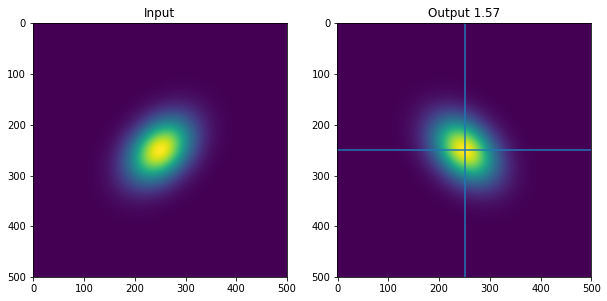

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.9724  252.99988]
 [247.00012 249.9724 ]]
(2, 3)


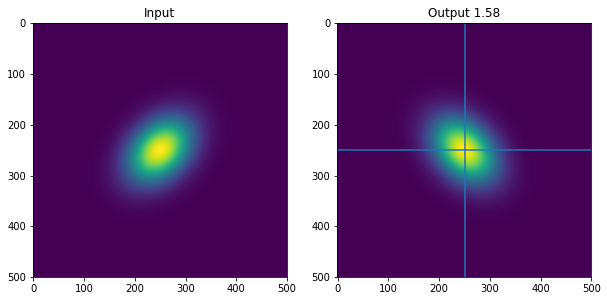

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.9424  252.99945]
 [247.00055 249.9424 ]]
(2, 3)


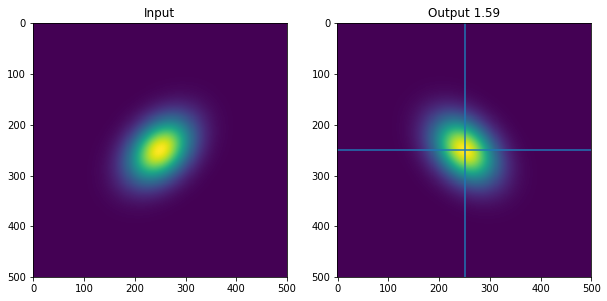

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.9124  252.99872]
 [247.00128 249.9124 ]]
(2, 3)


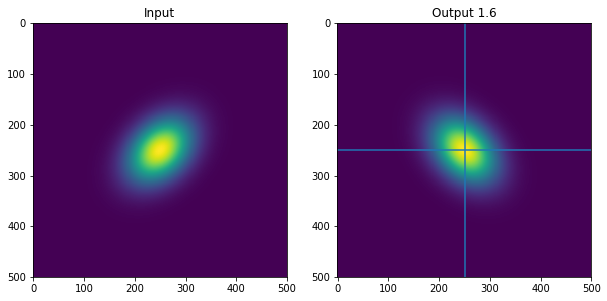

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.88242 252.9977 ]
 [247.0023  249.88242]]
(2, 3)


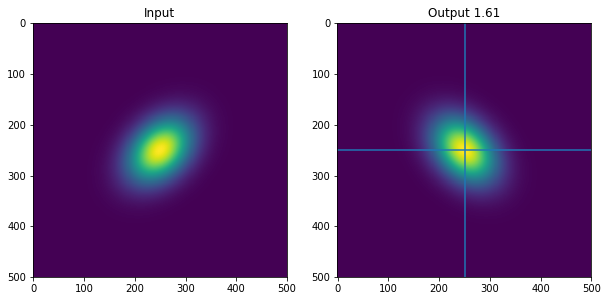

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.85245 252.99637]
 [247.00363 249.85245]]
(2, 3)


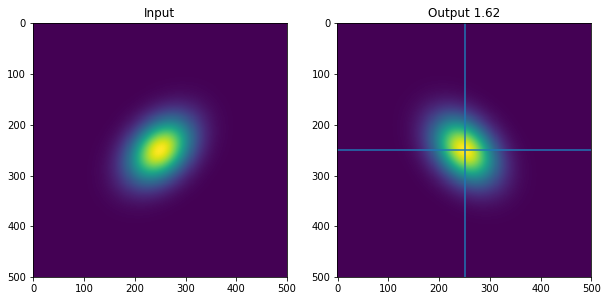

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.8225  252.99475]
 [247.00525 249.8225 ]]
(2, 3)


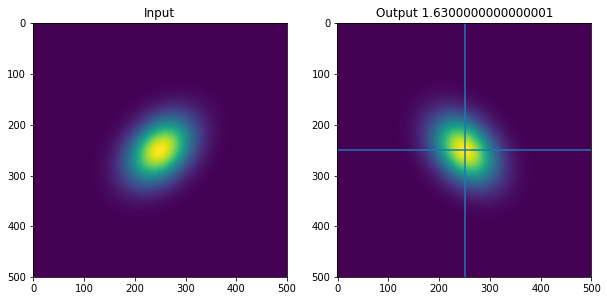

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.79256 252.99281]
 [247.00719 249.79256]]
(2, 3)


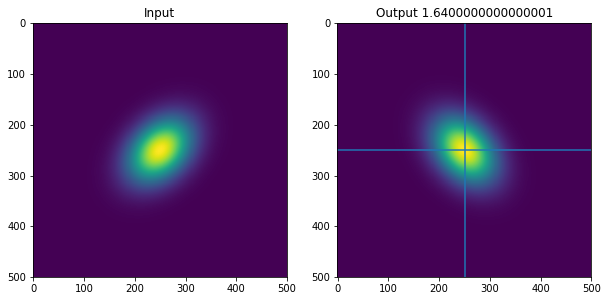

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.76263 252.9906 ]
 [247.0094  249.76263]]
(2, 3)


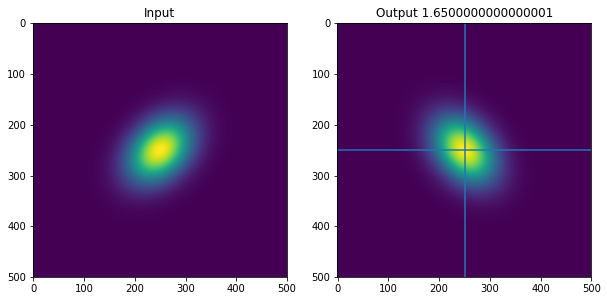

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.73274 252.98807]
 [247.01193 249.73274]]
(2, 3)


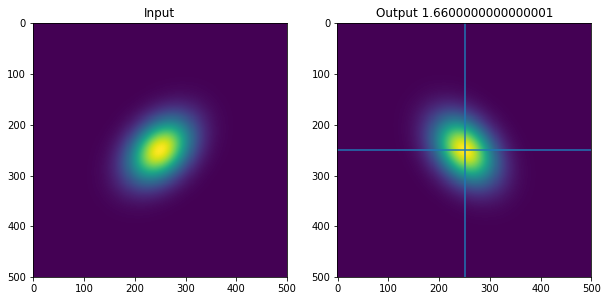

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.70288 252.98524]
 [247.01476 249.70288]]
(2, 3)


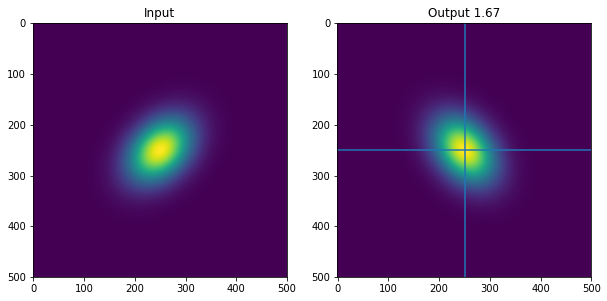

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.67303 252.98213]
 [247.01787 249.67303]]
(2, 3)


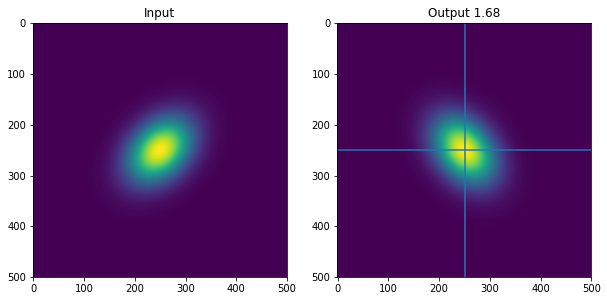

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.64323 252.97871]
 [247.02129 249.64323]]
(2, 3)


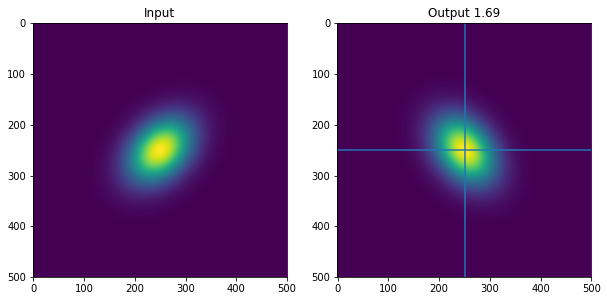

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.61346 252.97499]
 [247.02501 249.61346]]
(2, 3)


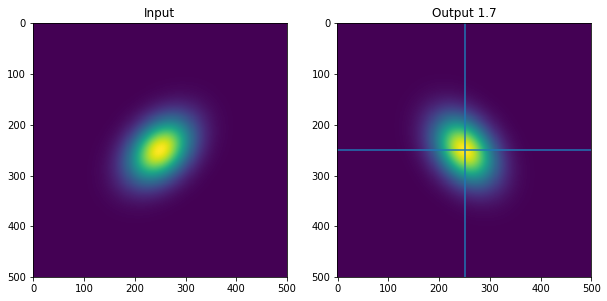

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.58374 252.97098]
 [247.02902 249.58374]]
(2, 3)


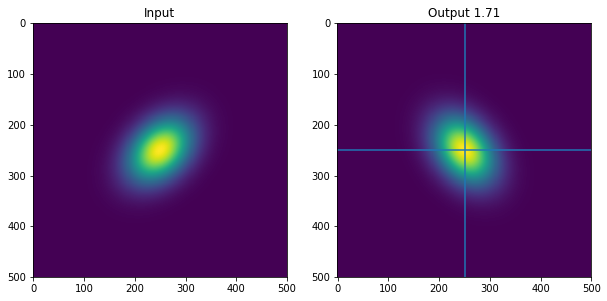

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.55405 252.96667]
 [247.03333 249.55405]]
(2, 3)


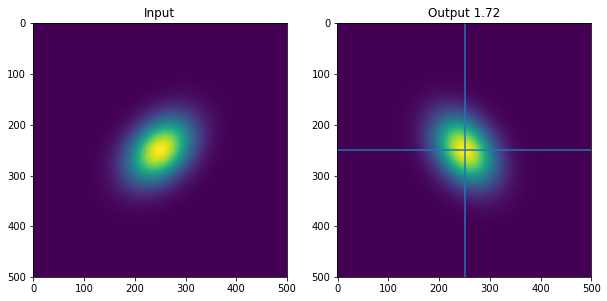

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.5244  252.96207]
 [247.03793 249.5244 ]]
(2, 3)


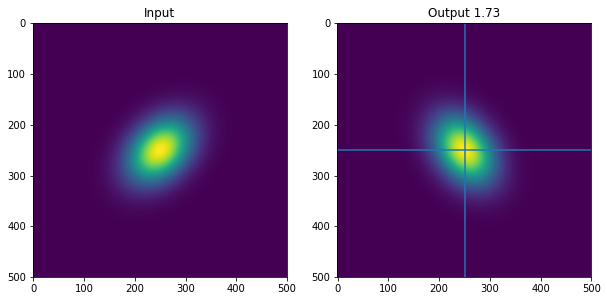

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.49481 252.95715]
 [247.04285 249.49481]]
(2, 3)


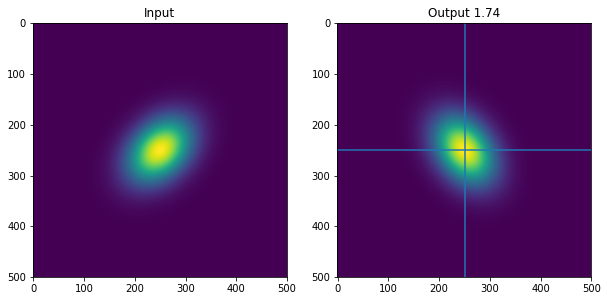

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.46526 252.95197]
 [247.04803 249.46526]]
(2, 3)


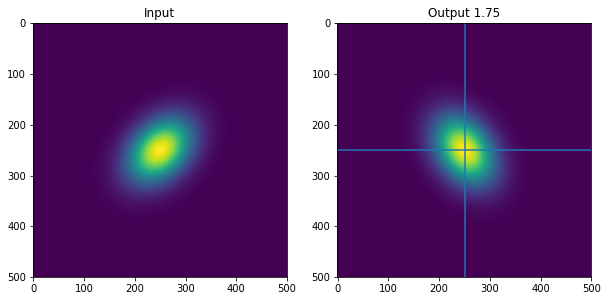

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.43578 252.94646]
 [247.05354 249.43578]]
(2, 3)


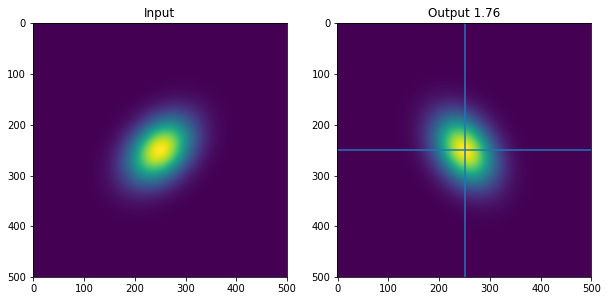

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.40633 252.94067]
 [247.05933 249.40633]]
(2, 3)


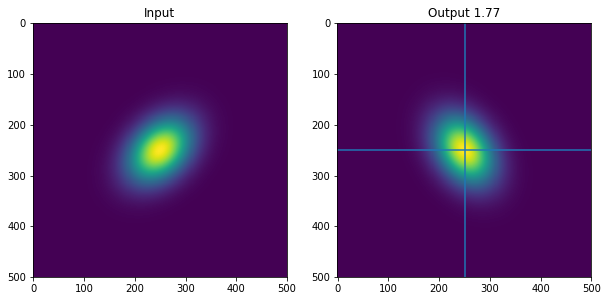

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.37695 252.93459]
 [247.06541 249.37695]]
(2, 3)


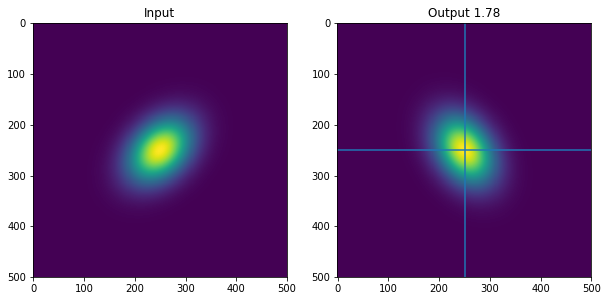

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.34764 252.9282 ]
 [247.0718  249.34764]]
(2, 3)


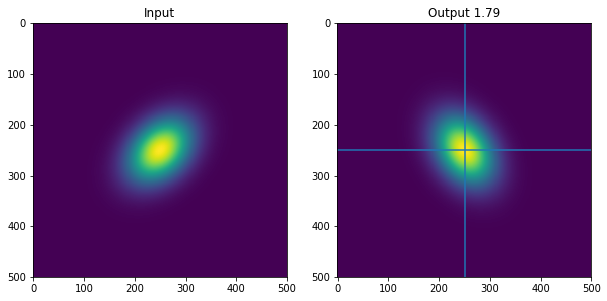

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.31839 252.92154]
 [247.07846 249.31839]]
(2, 3)


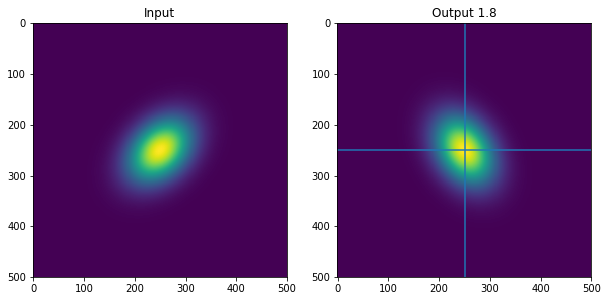

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.28922 252.91458]
 [247.08542 249.28922]]
(2, 3)


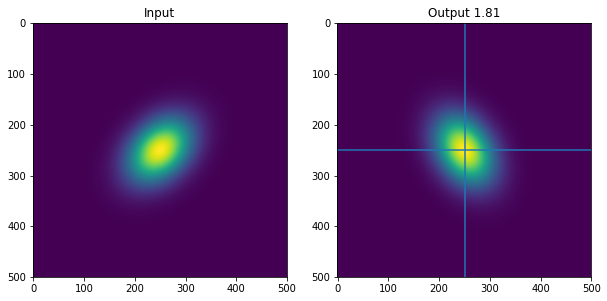

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.2601  252.90733]
 [247.09267 249.2601 ]]
(2, 3)


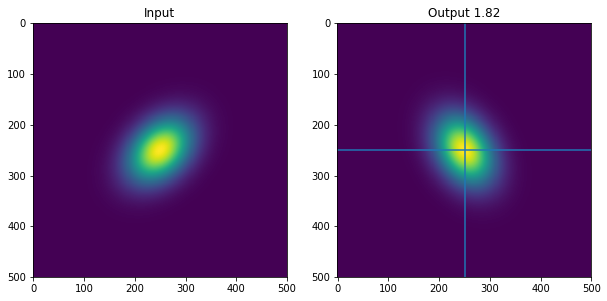

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.23106 252.89978]
 [247.10022 249.23106]]
(2, 3)


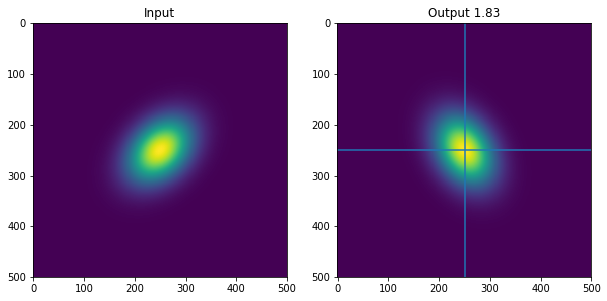

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.2021  252.89195]
 [247.10805 249.2021 ]]
(2, 3)


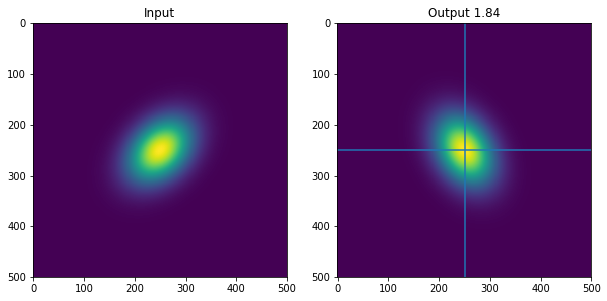

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.17323 252.88382]
 [247.11618 249.17323]]
(2, 3)


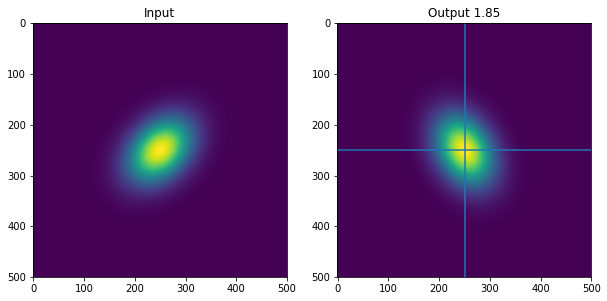

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.14444 252.87541]
 [247.12459 249.14444]]
(2, 3)


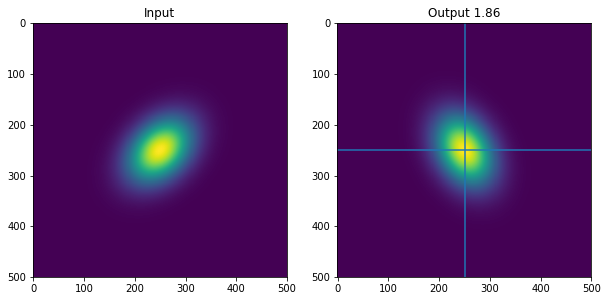

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.11572 252.86671]
 [247.13329 249.11572]]
(2, 3)


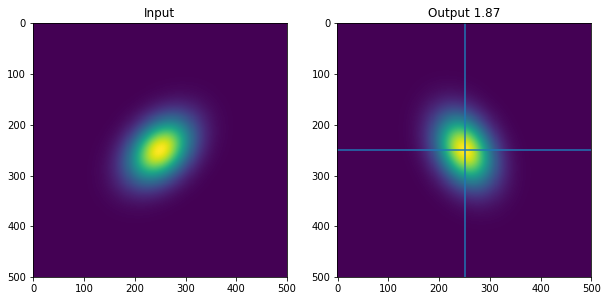

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.0871  252.85773]
 [247.14227 249.0871 ]]
(2, 3)


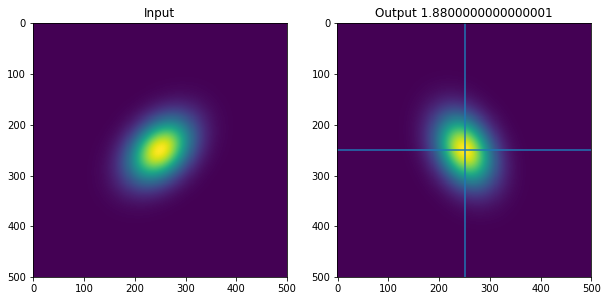

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.05856 252.84845]
 [247.15155 249.05856]]
(2, 3)


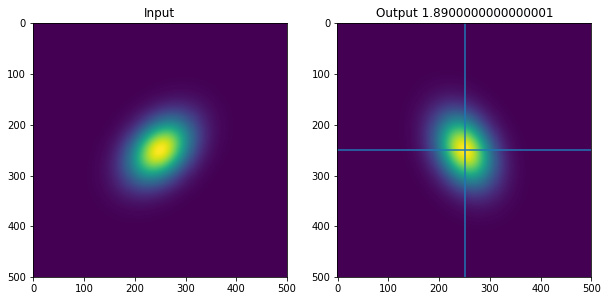

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.03014 252.8389 ]
 [247.1611  249.03014]]
(2, 3)


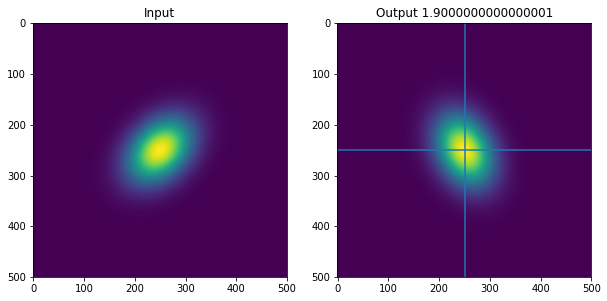

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [249.00179 252.82906]
 [247.17094 249.00179]]
(2, 3)


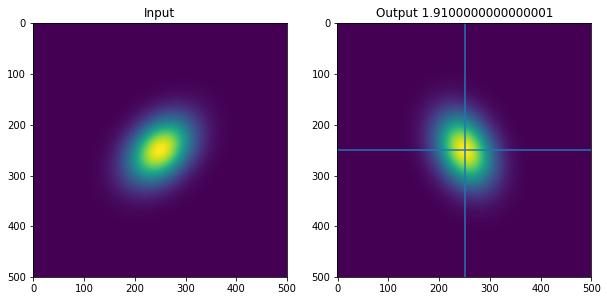

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.97356 252.81894]
 [247.18106 248.97356]]
(2, 3)


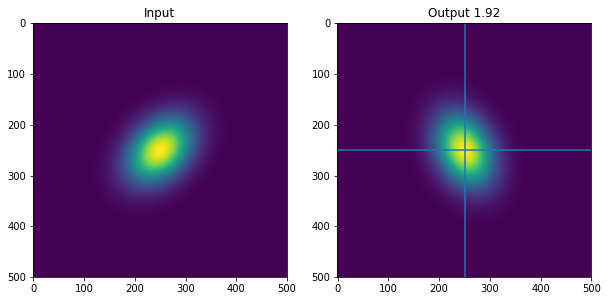

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.94542 252.80853]
 [247.19147 248.94542]]
(2, 3)


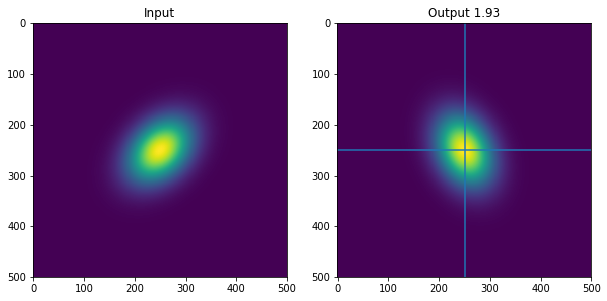

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.91739 252.79785]
 [247.20215 248.91739]]
(2, 3)


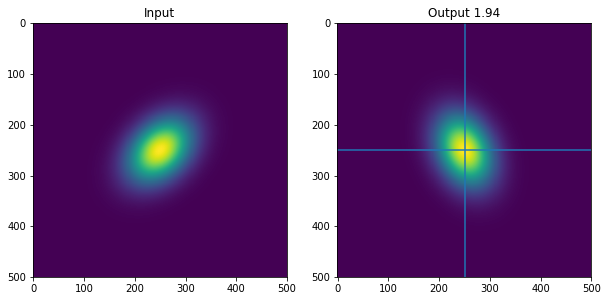

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.88945 252.78688]
 [247.21312 248.88945]]
(2, 3)


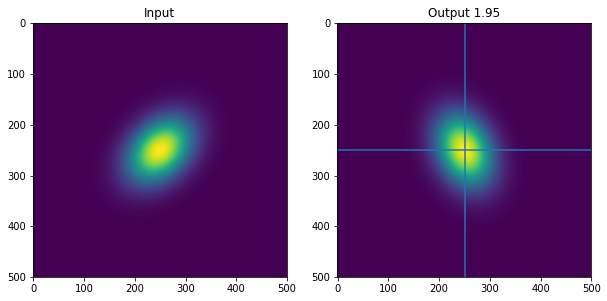

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.86165 252.77563]
 [247.22437 248.86165]]
(2, 3)


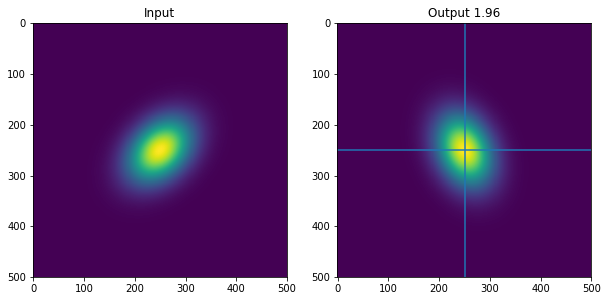

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.83394 252.76411]
 [247.23589 248.83394]]
(2, 3)


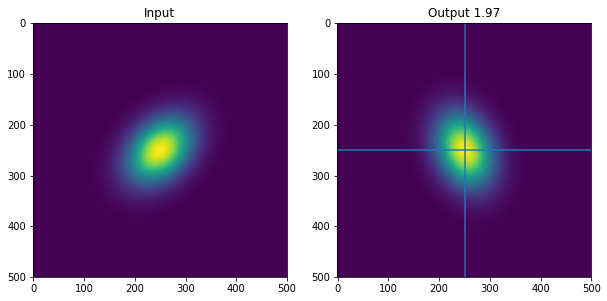

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.80637 252.75232]
 [247.24768 248.80637]]
(2, 3)


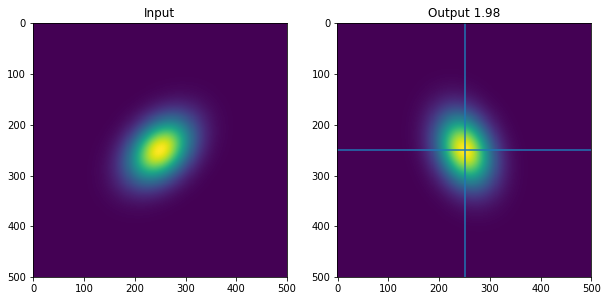

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.7789  252.74023]
 [247.25977 248.7789 ]]
(2, 3)


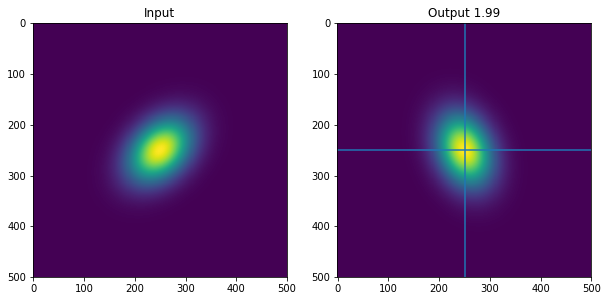

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.75156 252.72789]
 [247.27211 248.75156]]
(2, 3)


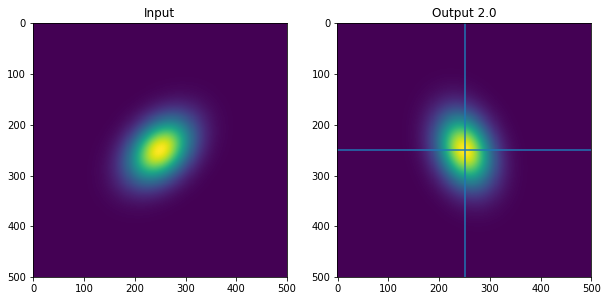

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.72435 252.71527]
 [247.28473 248.72435]]
(2, 3)


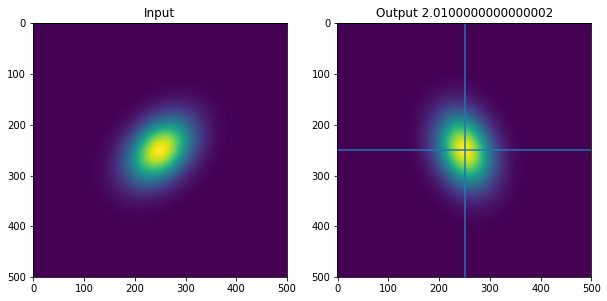

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.69725 252.70238]
 [247.29762 248.69725]]
(2, 3)


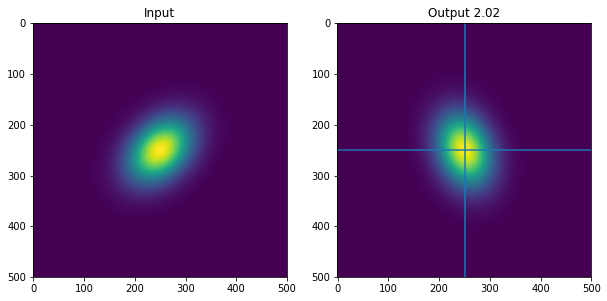

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.6703  252.68922]
 [247.31078 248.6703 ]]
(2, 3)


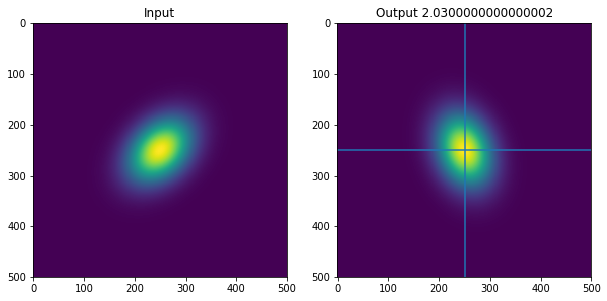

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.64348 252.67578]
 [247.32422 248.64348]]
(2, 3)


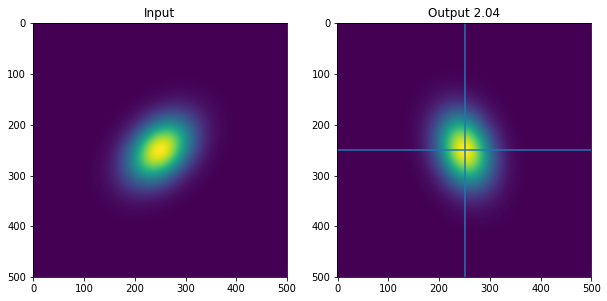

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.61678 252.6621 ]
 [247.3379  248.61678]]
(2, 3)


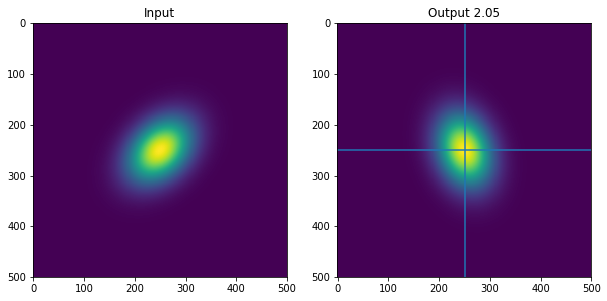

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.59023 252.64812]
 [247.35188 248.59023]]
(2, 3)


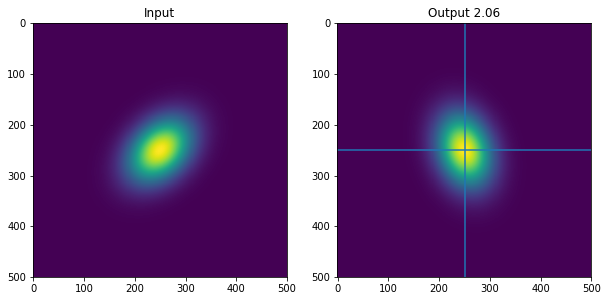

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.56383 252.6339 ]
 [247.3661  248.56383]]
(2, 3)


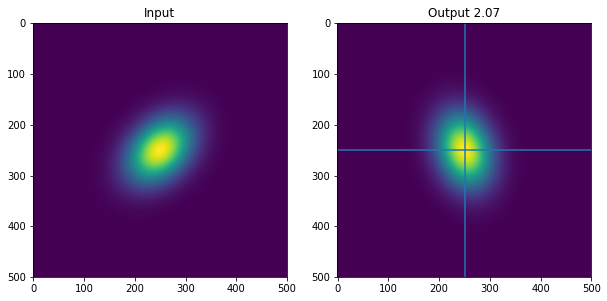

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.53755 252.6194 ]
 [247.3806  248.53755]]
(2, 3)


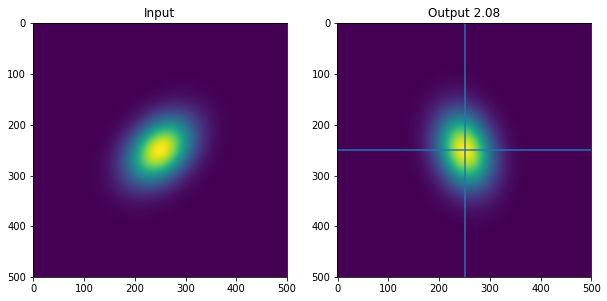

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.51143 252.60464]
 [247.39536 248.51143]]
(2, 3)


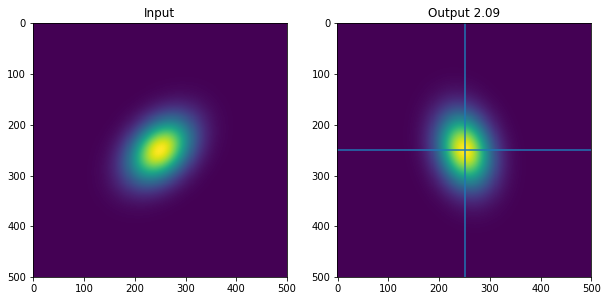

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.48546 252.58963]
 [247.41037 248.48546]]
(2, 3)


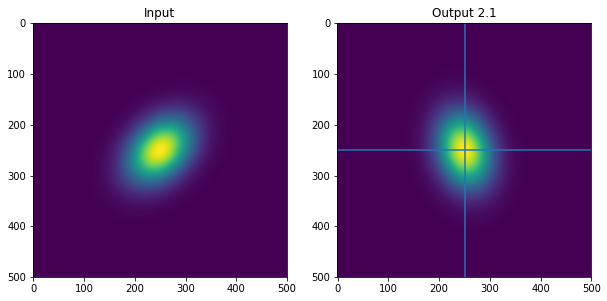

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.45964 252.57436]
 [247.42564 248.45964]]
(2, 3)


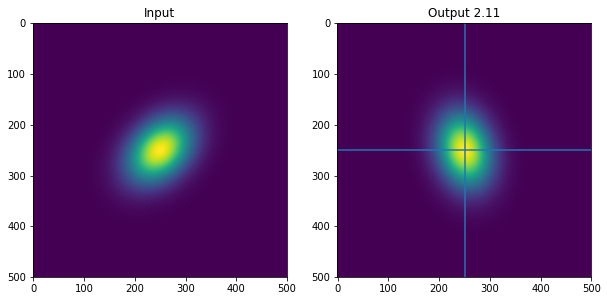

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.43398 252.55882]
 [247.44118 248.43398]]
(2, 3)


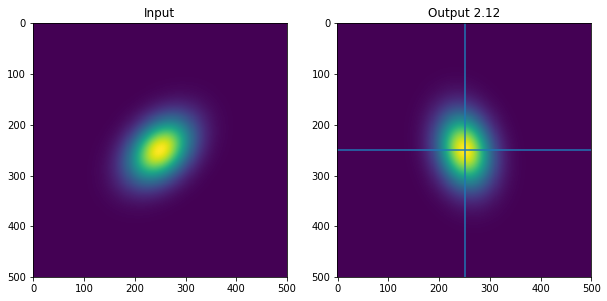

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.40846 252.54303]
 [247.45697 248.40846]]
(2, 3)


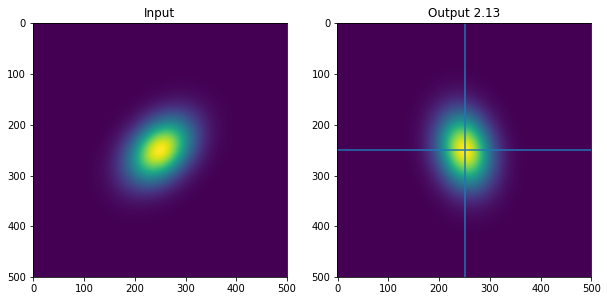

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.38312 252.527  ]
 [247.473   248.38312]]
(2, 3)


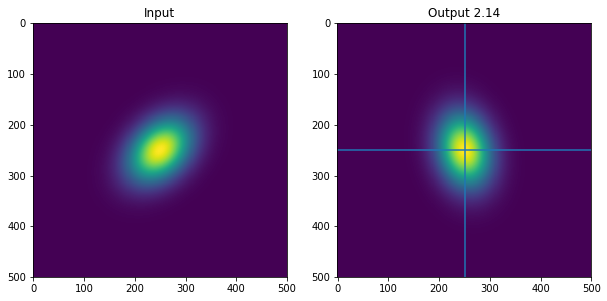

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.35793 252.5107 ]
 [247.4893  248.35793]]
(2, 3)


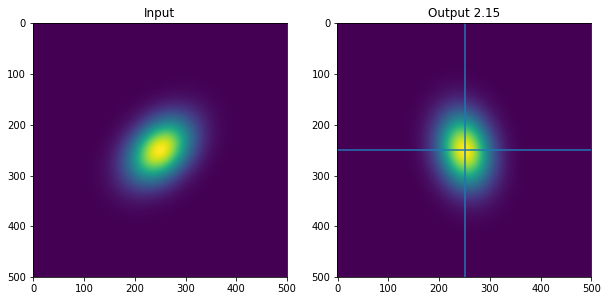

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.3329  252.49416]
 [247.50584 248.3329 ]]
(2, 3)


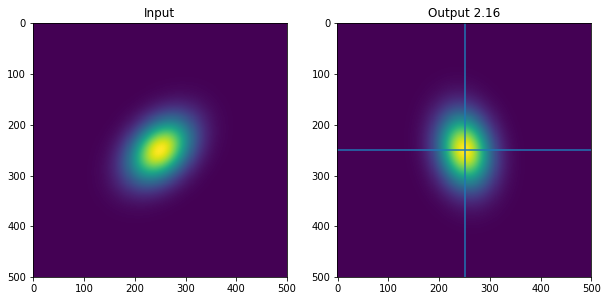

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.30804 252.47736]
 [247.52264 248.30804]]
(2, 3)


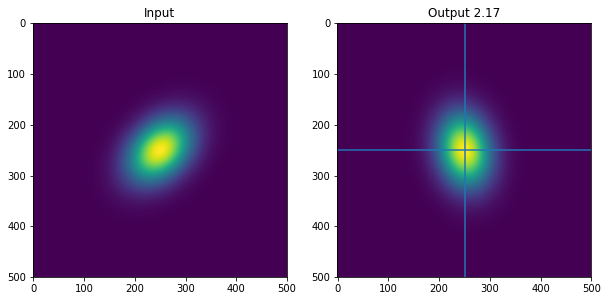

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.28336 252.46031]
 [247.53969 248.28336]]
(2, 3)


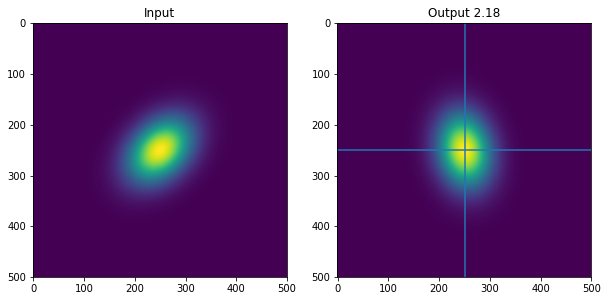

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.25883 252.44302]
 [247.55698 248.25883]]
(2, 3)


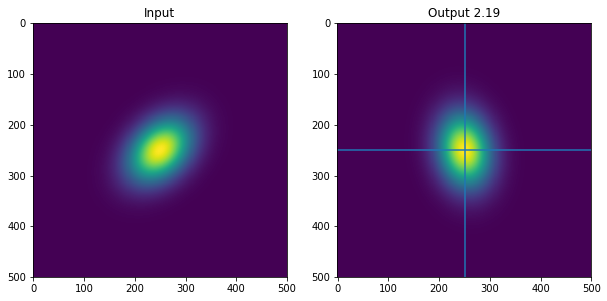

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.2345  252.42549]
 [247.57451 248.2345 ]]
(2, 3)


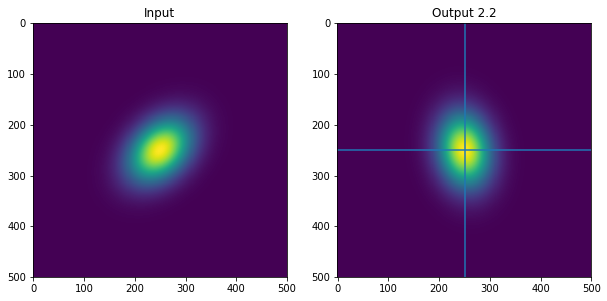

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.21033 252.40771]
 [247.59229 248.21033]]
(2, 3)


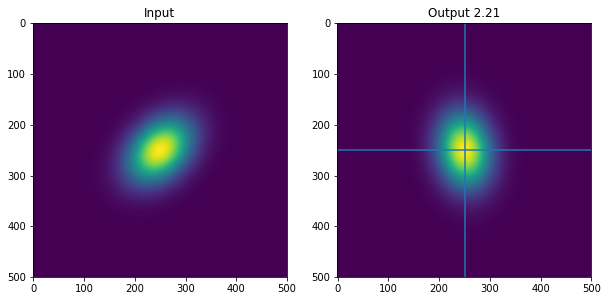

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.18634 252.3897 ]
 [247.6103  248.18634]]
(2, 3)


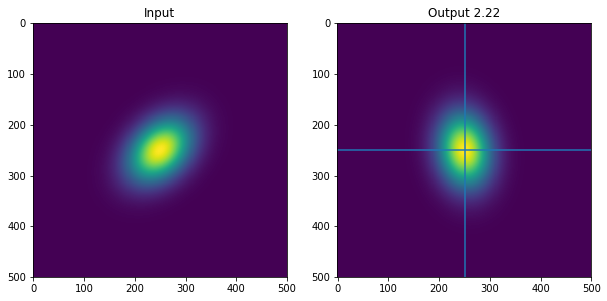

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.16254 252.37144]
 [247.62856 248.16254]]
(2, 3)


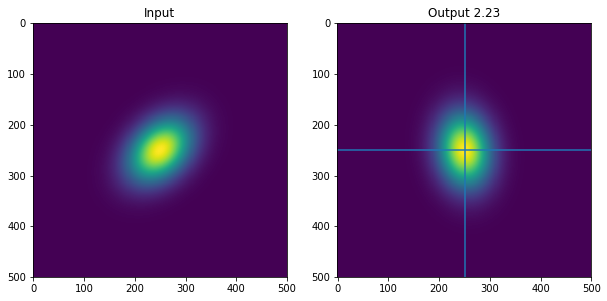

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.13892 252.35295]
 [247.64705 248.13892]]
(2, 3)


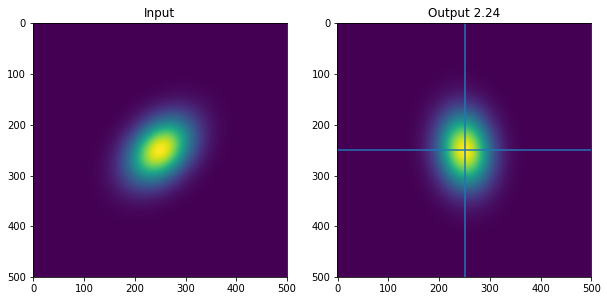

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.11548 252.33421]
 [247.66579 248.11548]]
(2, 3)


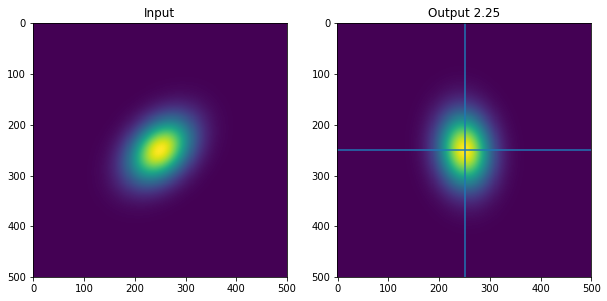

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.09222 252.31526]
 [247.68474 248.09222]]
(2, 3)


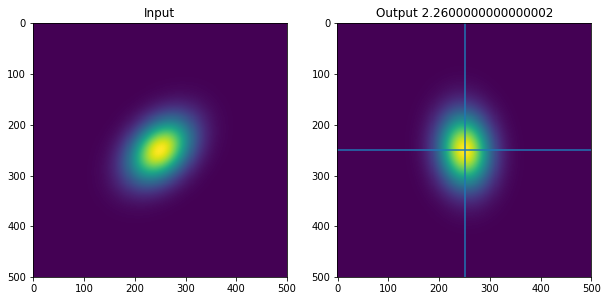

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.06917 252.29607]
 [247.70393 248.06917]]
(2, 3)


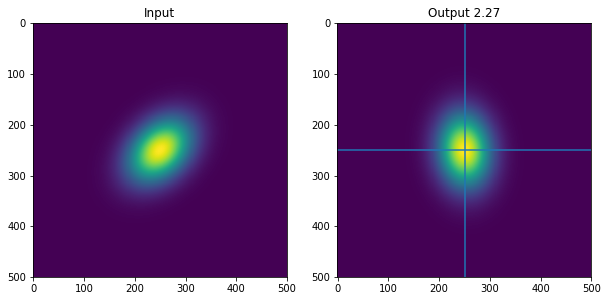

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.04631 252.27664]
 [247.72336 248.04631]]
(2, 3)


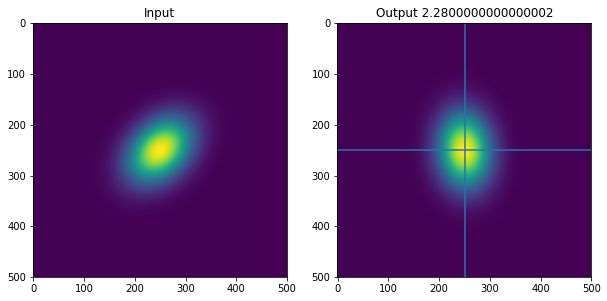

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.02364 252.25699]
 [247.74301 248.02364]]
(2, 3)


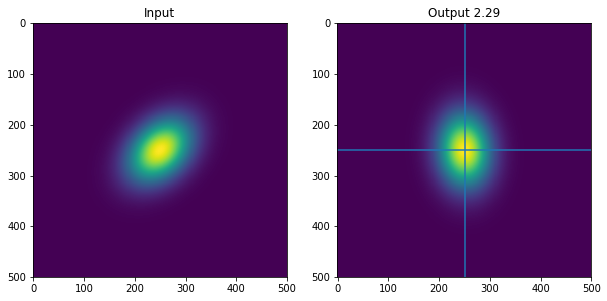

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [248.00117 252.23712]
 [247.76288 248.00117]]
(2, 3)


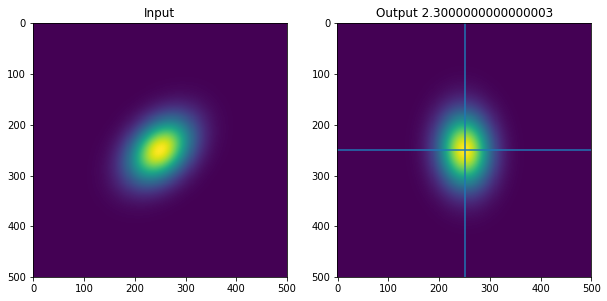

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.9789  252.21701]
 [247.78299 247.9789 ]]
(2, 3)


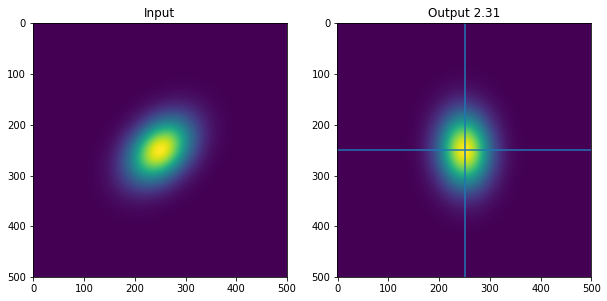

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.95683 252.1967 ]
 [247.8033  247.95683]]
(2, 3)


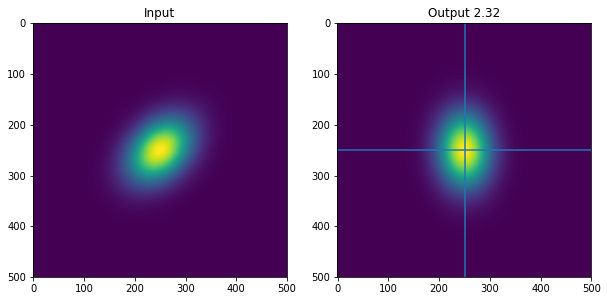

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.93497 252.17615]
 [247.82385 247.93497]]
(2, 3)


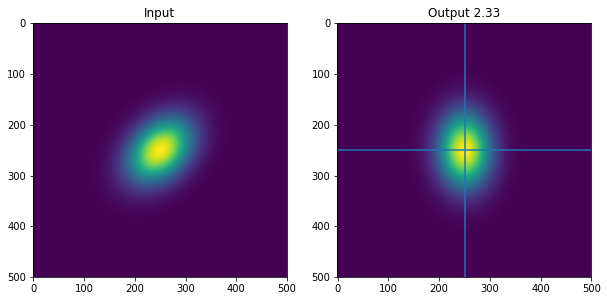

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.91331 252.1554 ]
 [247.8446  247.91331]]
(2, 3)


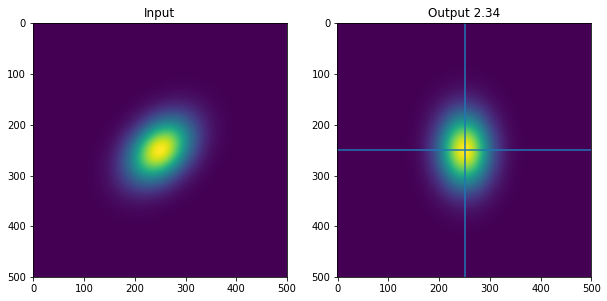

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.89186 252.13441]
 [247.86559 247.89186]]
(2, 3)


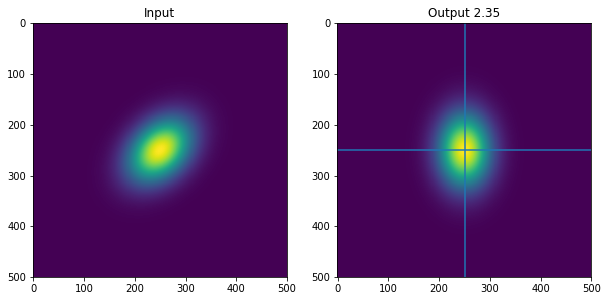

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.87062 252.11324]
 [247.88676 247.87062]]
(2, 3)


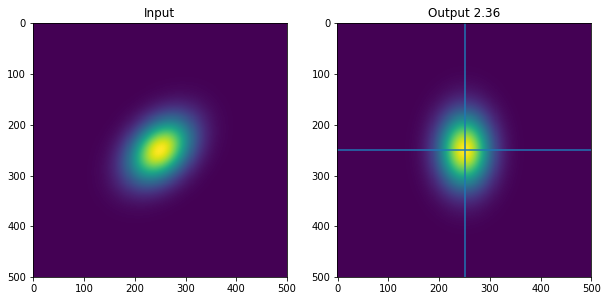

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.8496  252.09183]
 [247.90817 247.8496 ]]
(2, 3)


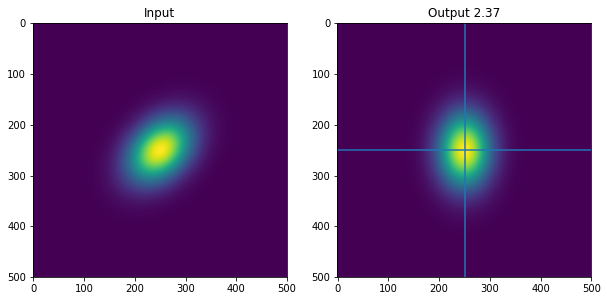

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.82878 252.07022]
 [247.92978 247.82878]]
(2, 3)


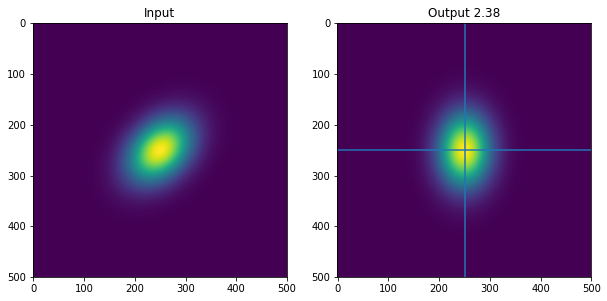

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.8082  252.04842]
 [247.95158 247.8082 ]]
(2, 3)


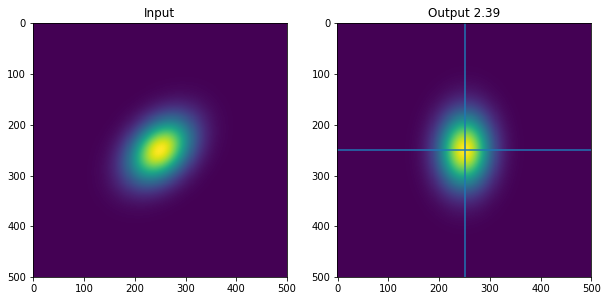

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.78781 252.02638]
 [247.97362 247.78781]]
(2, 3)


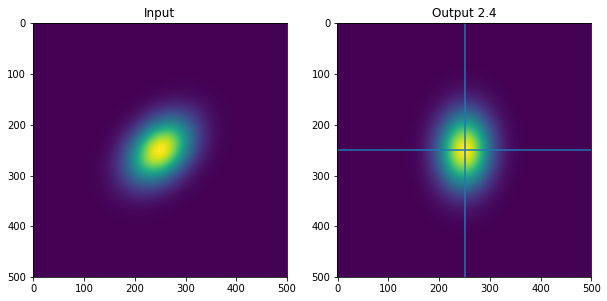

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.76767 252.00417]
 [247.99583 247.76767]]
(2, 3)


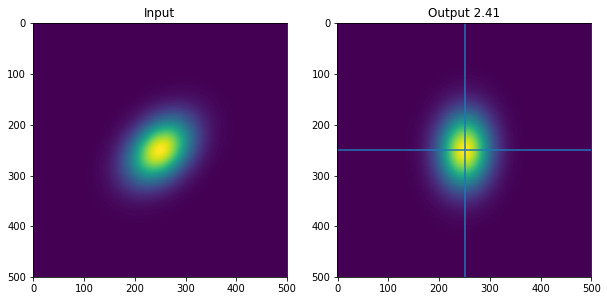

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.74774 251.98175]
 [248.01825 247.74774]]
(2, 3)


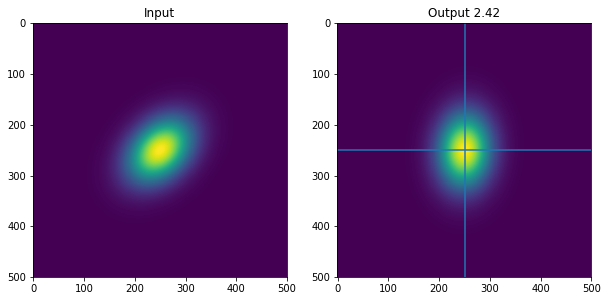

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.72803 251.95912]
 [248.04088 247.72803]]
(2, 3)


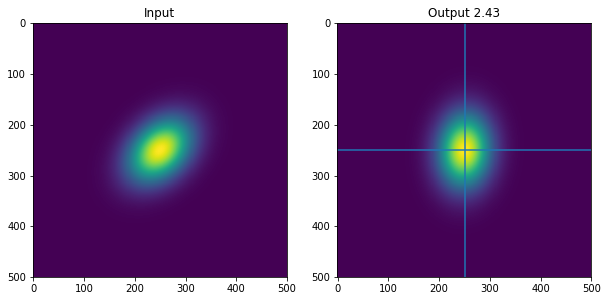

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.70856 251.93631]
 [248.06369 247.70856]]
(2, 3)


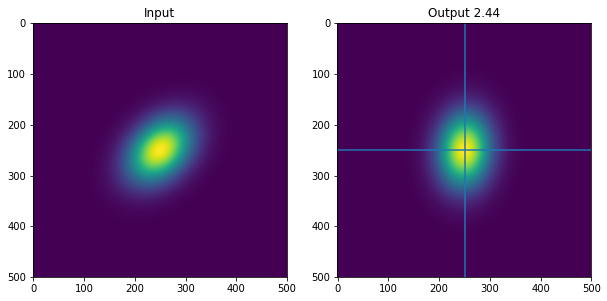

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.     250.    ]
 [247.6893 251.9133]
 [248.0867 247.6893]]
(2, 3)


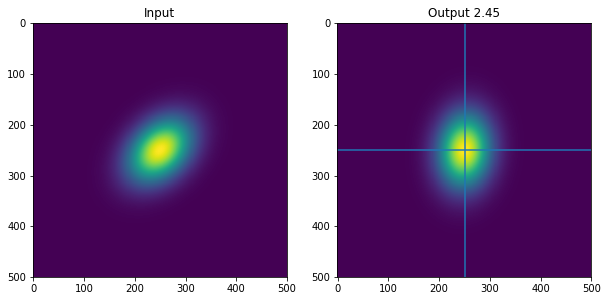

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.67029 251.89009]
 [248.10991 247.67029]]
(2, 3)


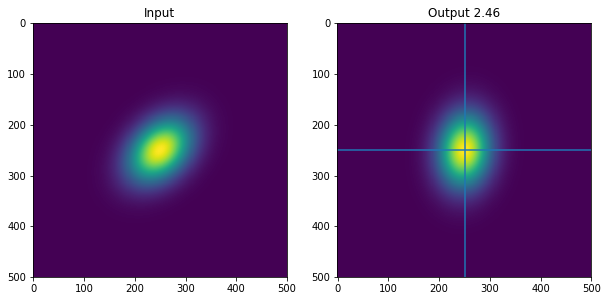

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.     250.    ]
 [247.6515 251.8667]
 [248.1333 247.6515]]
(2, 3)


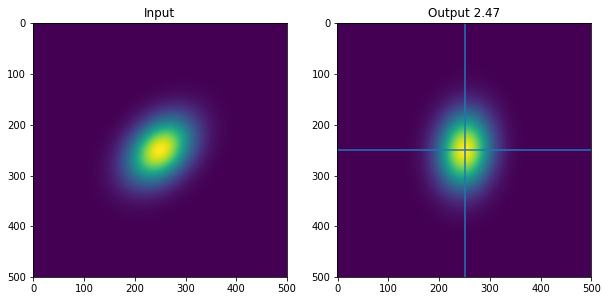

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.63295 251.84312]
 [248.15688 247.63295]]
(2, 3)


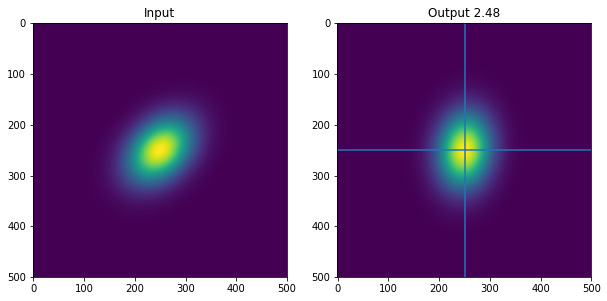

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.61464 251.81937]
 [248.18063 247.61464]]
(2, 3)


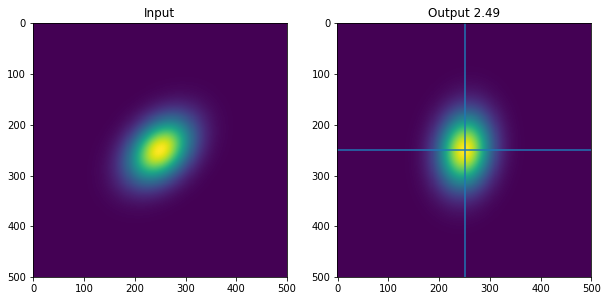

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.59657 251.79541]
 [248.20459 247.59657]]
(2, 3)


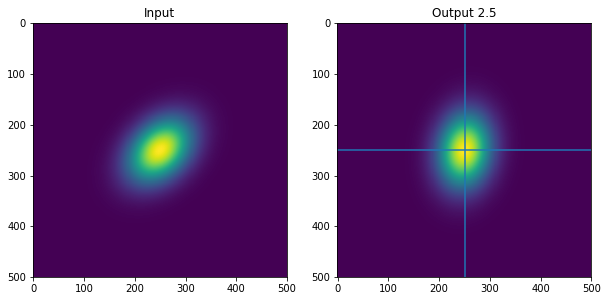

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.57874 251.77129]
 [248.22871 247.57874]]
(2, 3)


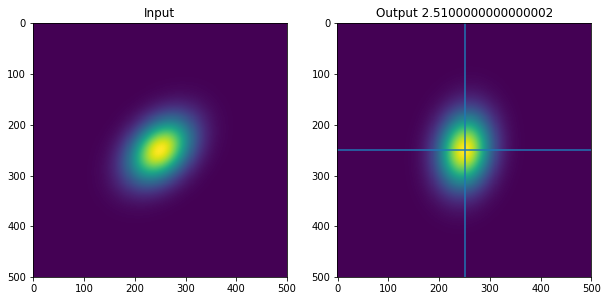

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.56114 251.747  ]
 [248.253   247.56114]]
(2, 3)


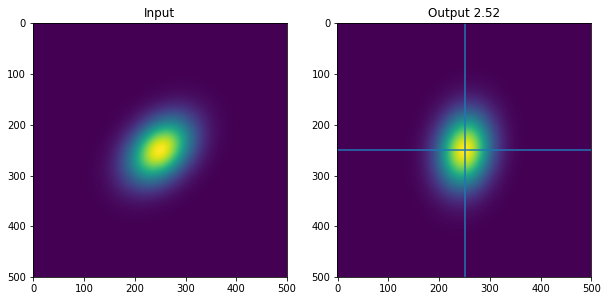

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.5438  251.72252]
 [248.27748 247.5438 ]]
(2, 3)


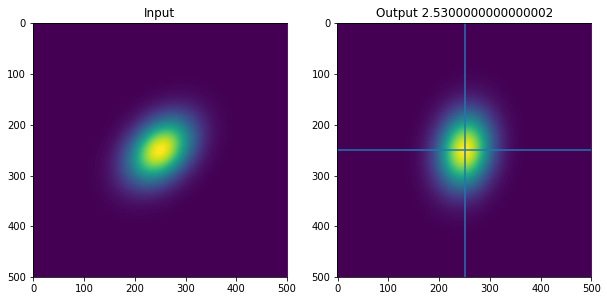

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.52669 251.69788]
 [248.30212 247.52669]]
(2, 3)


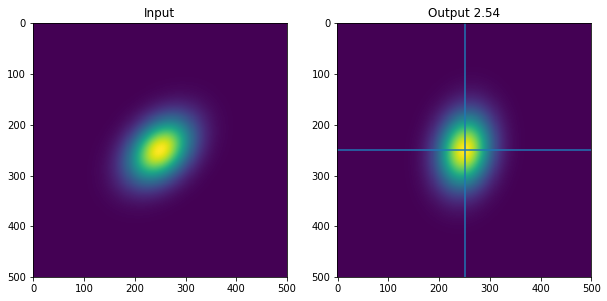

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.50984 251.67305]
 [248.32695 247.50984]]
(2, 3)


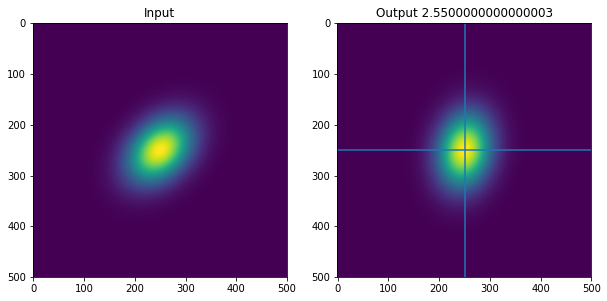

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.49324 251.64807]
 [248.35193 247.49324]]
(2, 3)


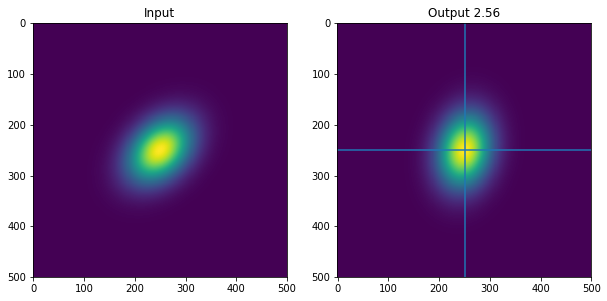

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.47688 251.62291]
 [248.37709 247.47688]]
(2, 3)


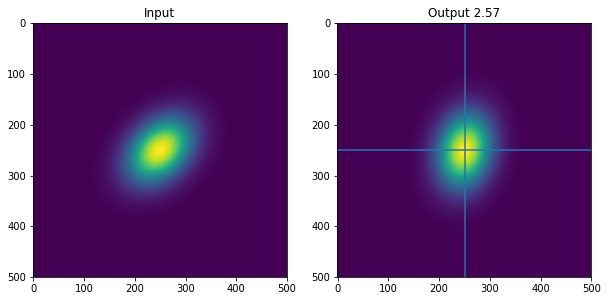

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.46077 251.59761]
 [248.40239 247.46077]]
(2, 3)


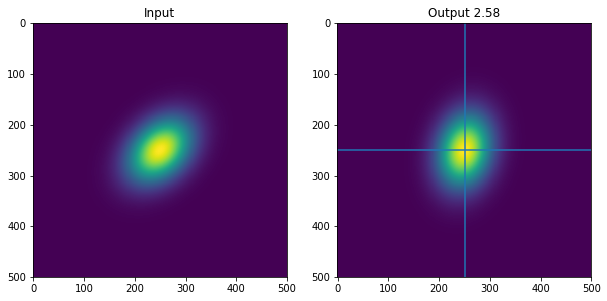

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.44493 251.57213]
 [248.42787 247.44493]]
(2, 3)


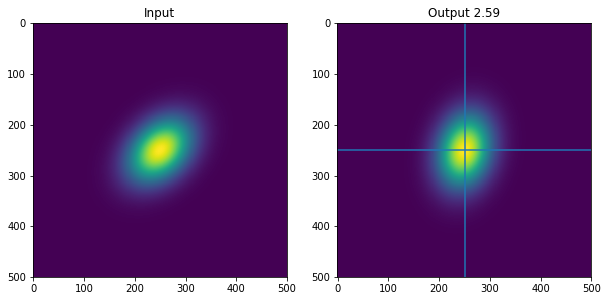

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.42934 251.54651]
 [248.45349 247.42934]]
(2, 3)


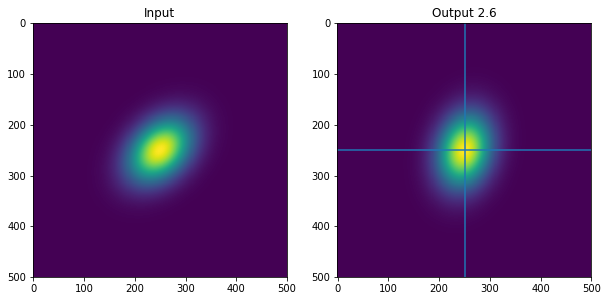

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.414   251.52072]
 [248.47928 247.414  ]]
(2, 3)


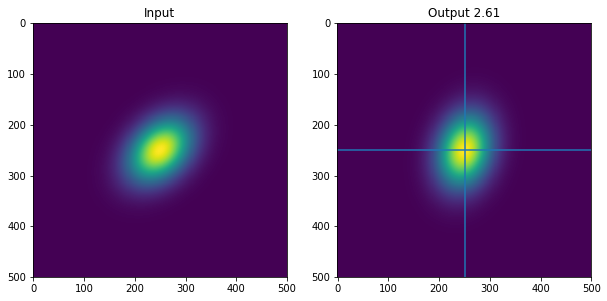

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.39893 251.49478]
 [248.50522 247.39893]]
(2, 3)


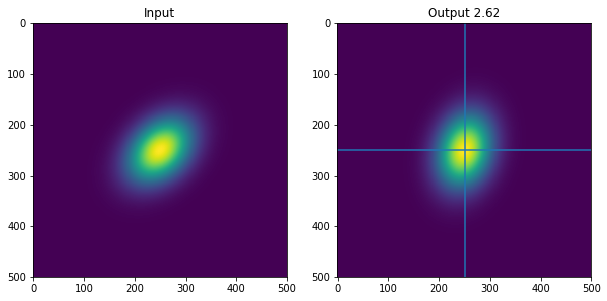

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.38411 251.4687 ]
 [248.5313  247.38411]]
(2, 3)


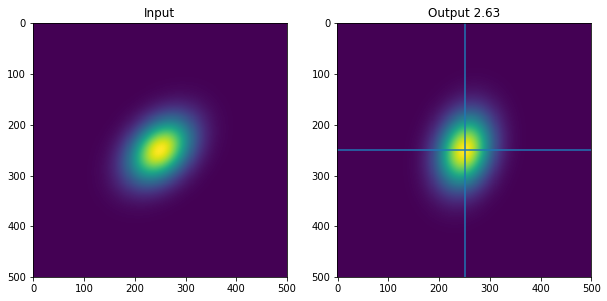

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.36955 251.44247]
 [248.55753 247.36955]]
(2, 3)


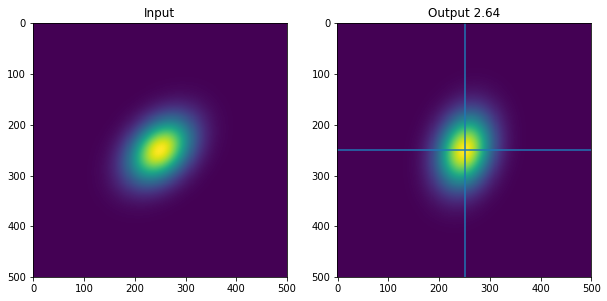

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.35526 251.41609]
 [248.58391 247.35526]]
(2, 3)


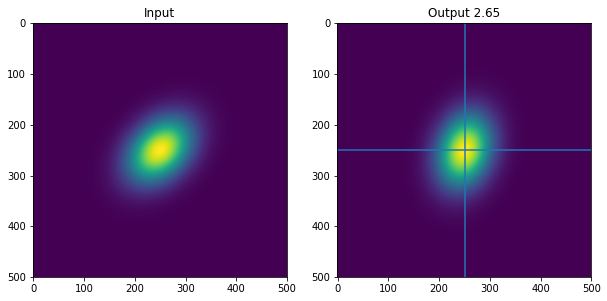

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.34123 251.38957]
 [248.61043 247.34123]]
(2, 3)


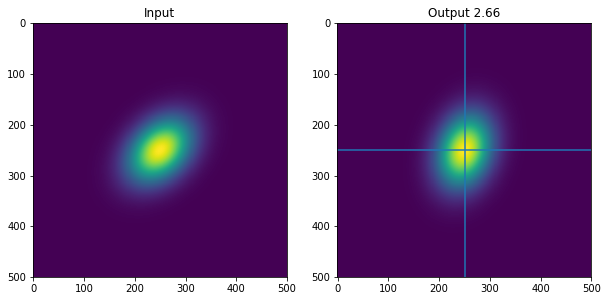

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.32747 251.36292]
 [248.63708 247.32747]]
(2, 3)


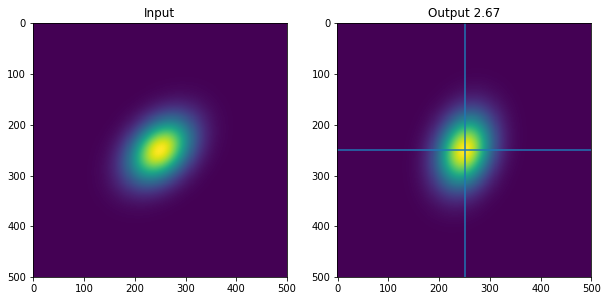

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.31396 251.33612]
 [248.66388 247.31396]]
(2, 3)


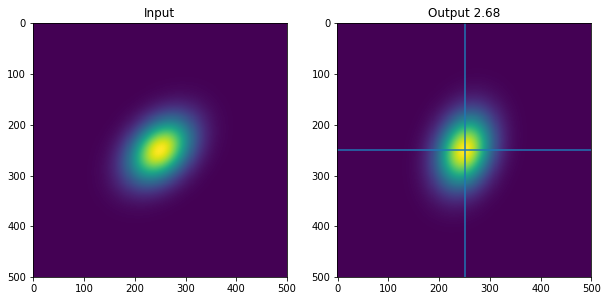

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.30074 251.3092 ]
 [248.6908  247.30074]]
(2, 3)


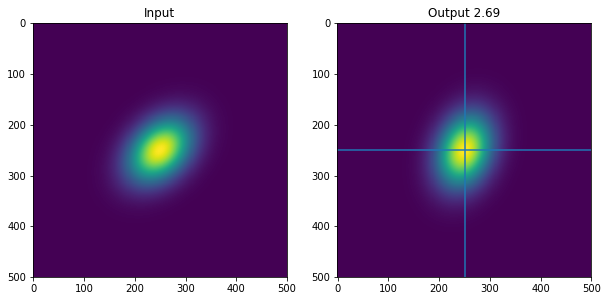

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.28778 251.28214]
 [248.71786 247.28778]]
(2, 3)


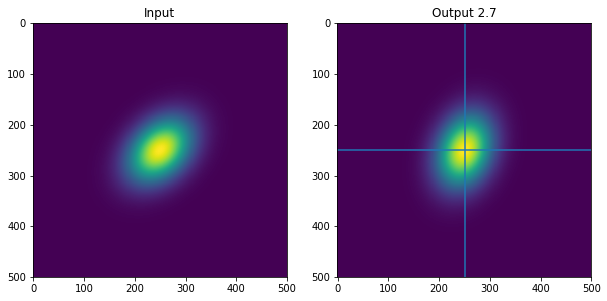

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.2751  251.25496]
 [248.74504 247.2751 ]]
(2, 3)


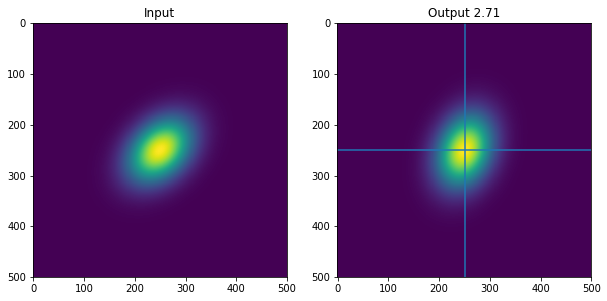

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.26268 251.22765]
 [248.77235 247.26268]]
(2, 3)


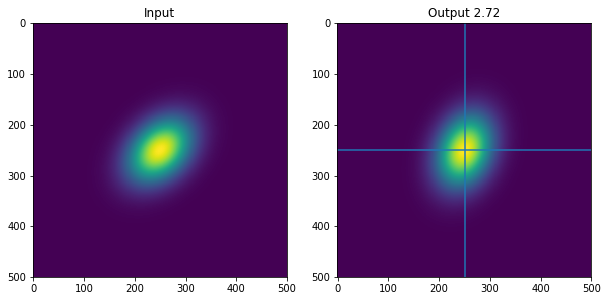

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.25055 251.20021]
 [248.79979 247.25055]]
(2, 3)


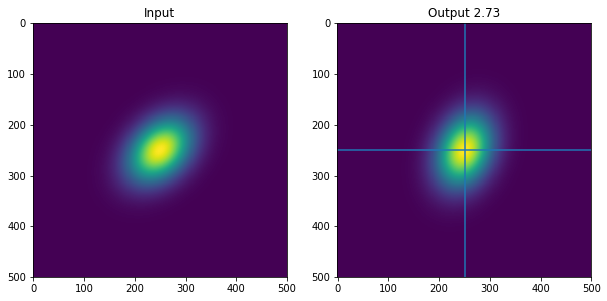

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.23868 251.17265]
 [248.82735 247.23868]]
(2, 3)


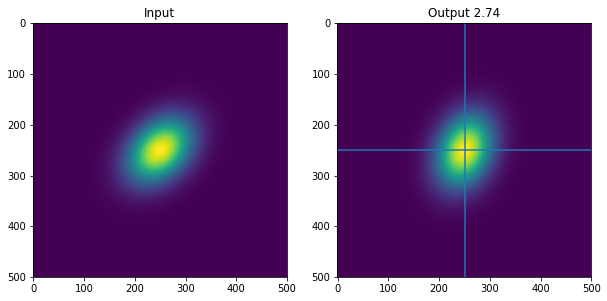

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.2271  251.14499]
 [248.85501 247.2271 ]]
(2, 3)


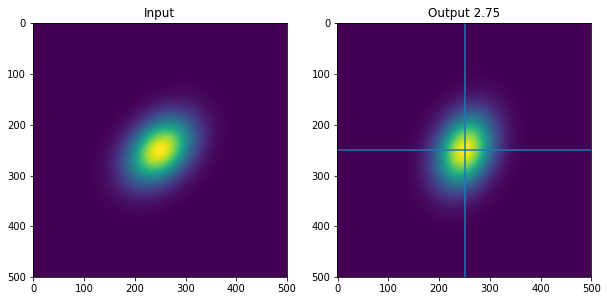

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.21577 251.1172 ]
 [248.8828  247.21577]]
(2, 3)


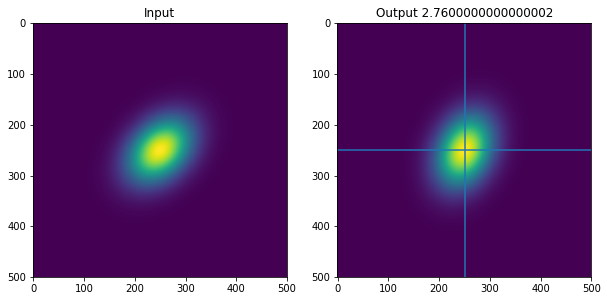

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.20474 251.0893 ]
 [248.9107  247.20474]]
(2, 3)


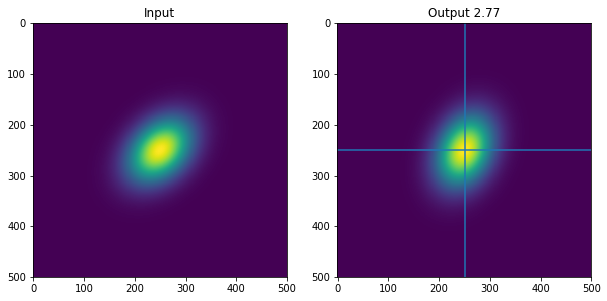

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.     250.    ]
 [247.194  251.0613]
 [248.9387 247.194 ]]
(2, 3)


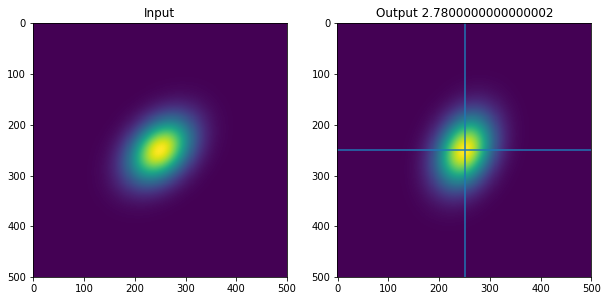

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.18352 251.03319]
 [248.96681 247.18352]]
(2, 3)


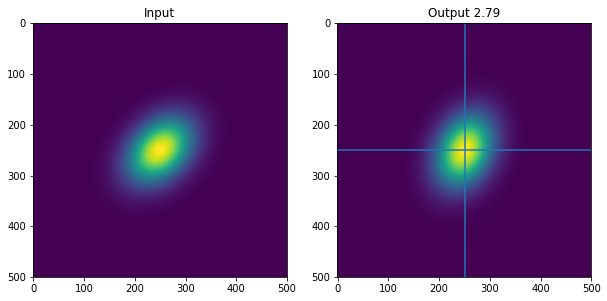

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.17334 251.00496]
 [248.99504 247.17334]]
(2, 3)


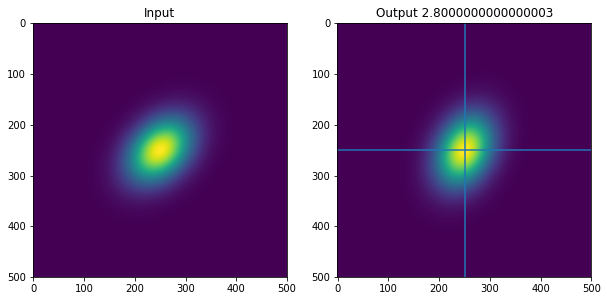

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.16342 250.97665]
 [249.02335 247.16342]]
(2, 3)


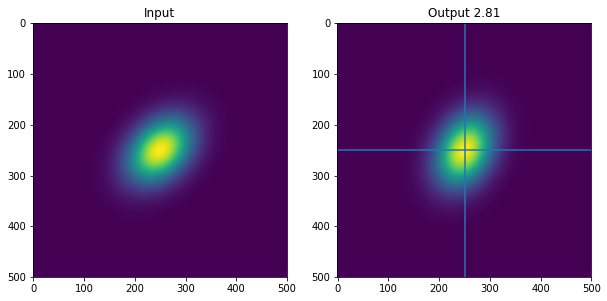

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.1538  250.94823]
 [249.05177 247.1538 ]]
(2, 3)


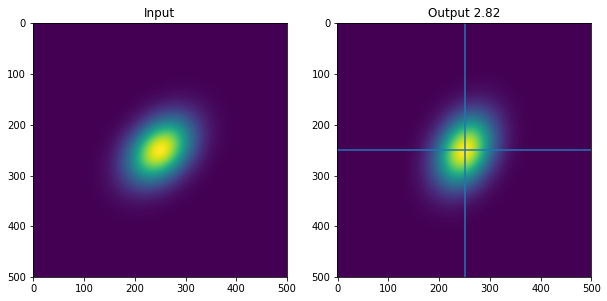

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.14445 250.91972]
 [249.08028 247.14445]]
(2, 3)


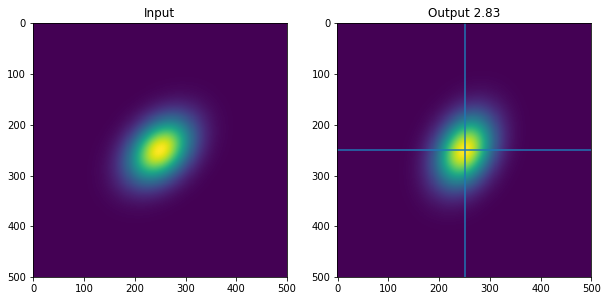

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.1354  250.89113]
 [249.10887 247.1354 ]]
(2, 3)


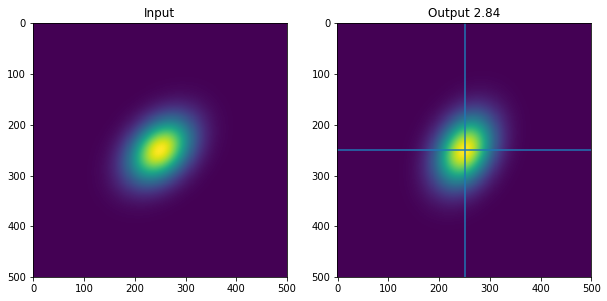

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.12663 250.86243]
 [249.13757 247.12663]]
(2, 3)


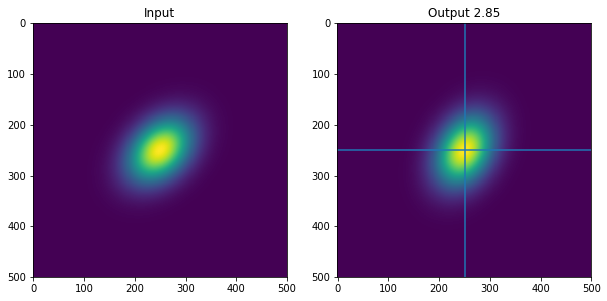

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.11816 250.83366]
 [249.16634 247.11816]]
(2, 3)


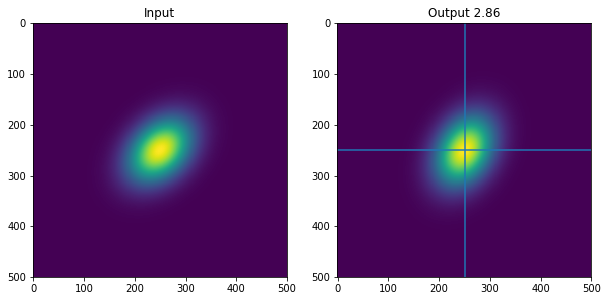

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.10997 250.8048 ]
 [249.1952  247.10997]]
(2, 3)


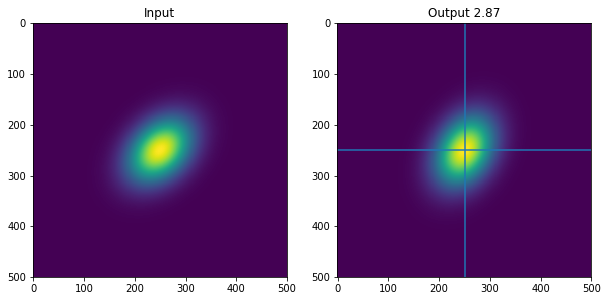

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.10207 250.77586]
 [249.22414 247.10207]]
(2, 3)


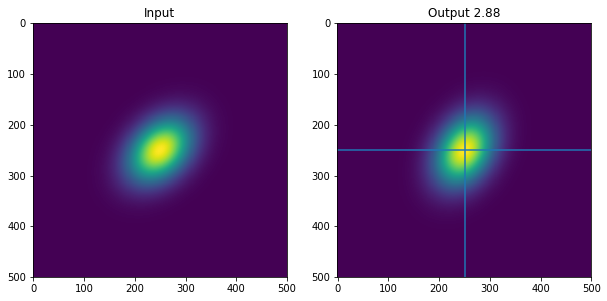

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.09445 250.74684]
 [249.25316 247.09445]]
(2, 3)


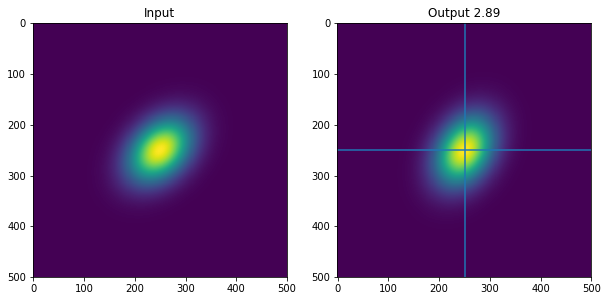

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.08713 250.71774]
 [249.28226 247.08713]]
(2, 3)


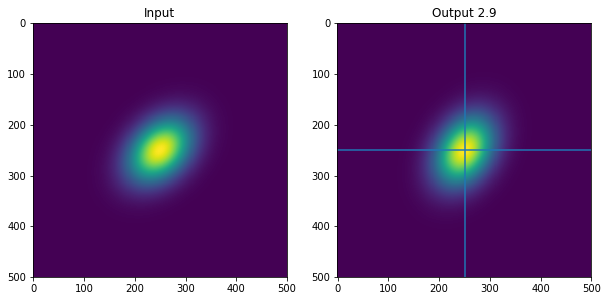

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.0801  250.68858]
 [249.31142 247.0801 ]]
(2, 3)


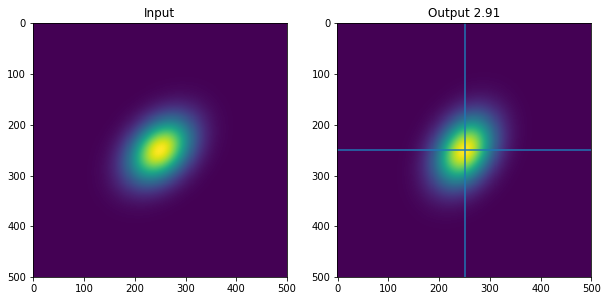

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.07335 250.65935]
 [249.34065 247.07335]]
(2, 3)


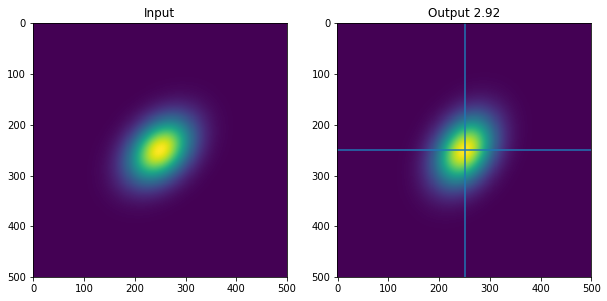

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.06691 250.63005]
 [249.36995 247.06691]]
(2, 3)


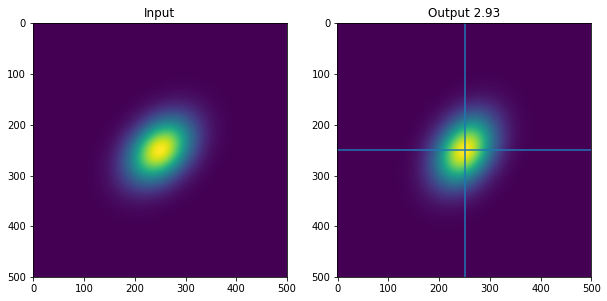

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.06076 250.6007 ]
 [249.3993  247.06076]]
(2, 3)


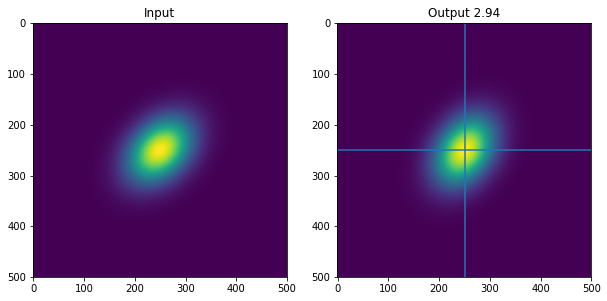

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.0549  250.57127]
 [249.42873 247.0549 ]]
(2, 3)


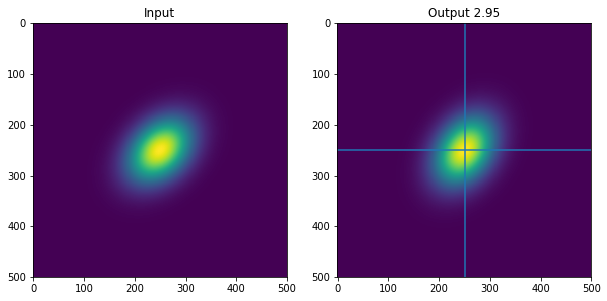

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.04933 250.5418 ]
 [249.4582  247.04933]]
(2, 3)


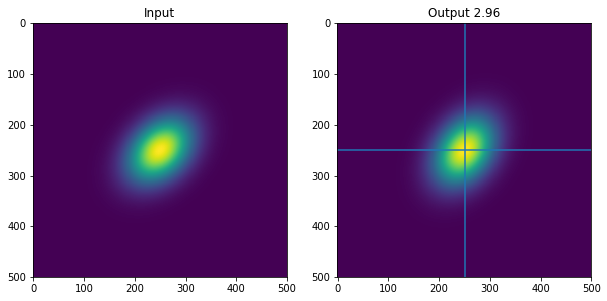

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.04405 250.51225]
 [249.48775 247.04405]]
(2, 3)


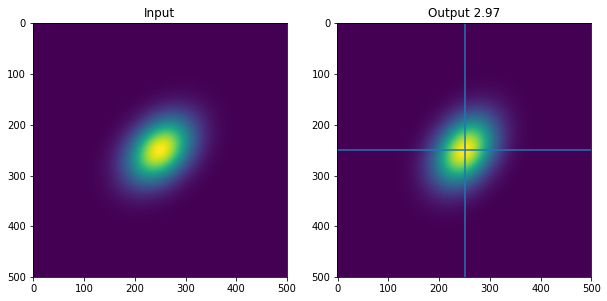

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.03908 250.48267]
 [249.51733 247.03908]]
(2, 3)


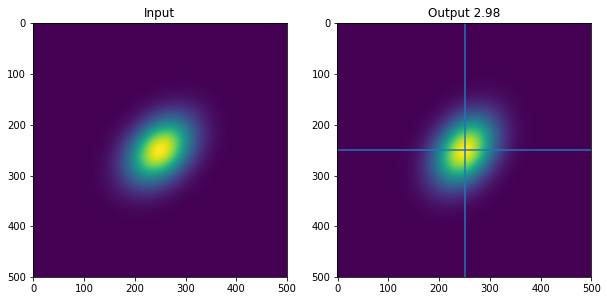

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.03441 250.45303]
 [249.54697 247.03441]]
(2, 3)


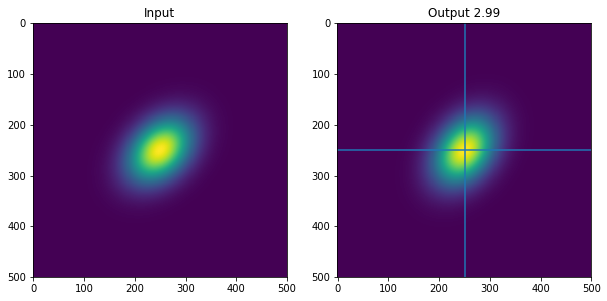

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.03003 250.42336]
 [249.57664 247.03003]]
(2, 3)


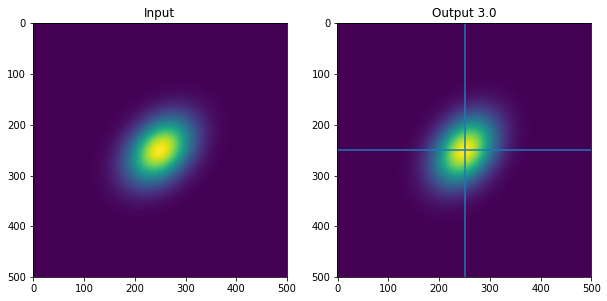

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.02594 250.39365]
 [249.60635 247.02594]]
(2, 3)


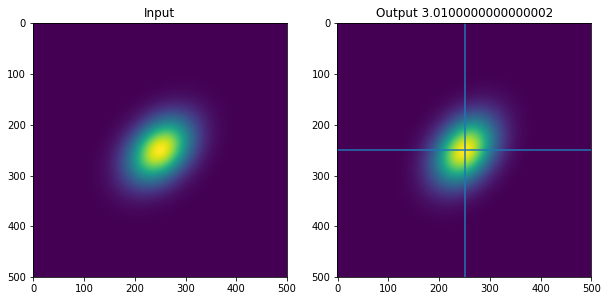

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.02216 250.36388]
 [249.63612 247.02216]]
(2, 3)


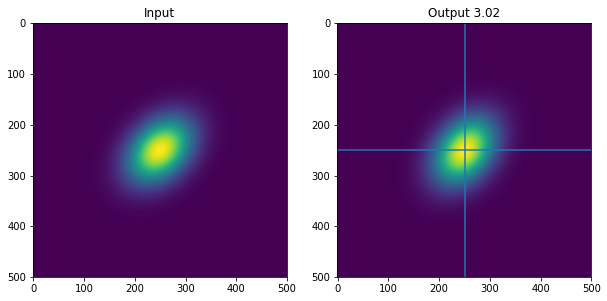

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.01866 250.33408]
 [249.66592 247.01866]]
(2, 3)


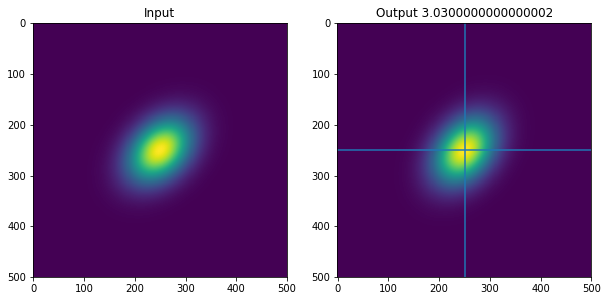

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.01547 250.30426]
 [249.69574 247.01547]]
(2, 3)


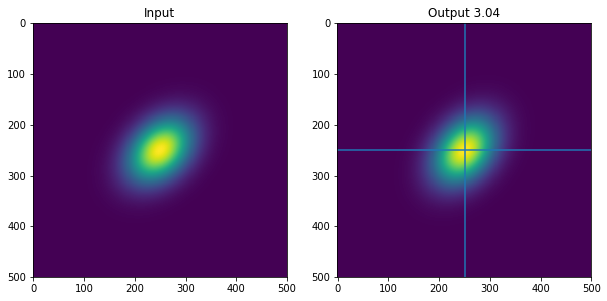

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.01257 250.2744 ]
 [249.7256  247.01257]]
(2, 3)


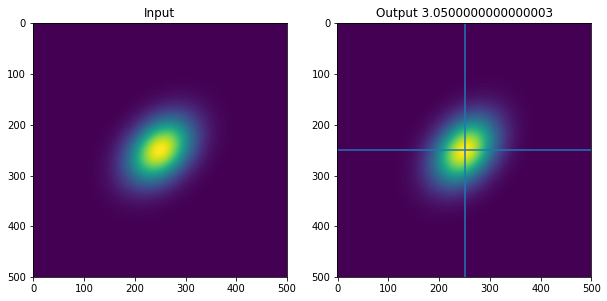

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.00998 250.2445 ]
 [249.7555  247.00998]]
(2, 3)


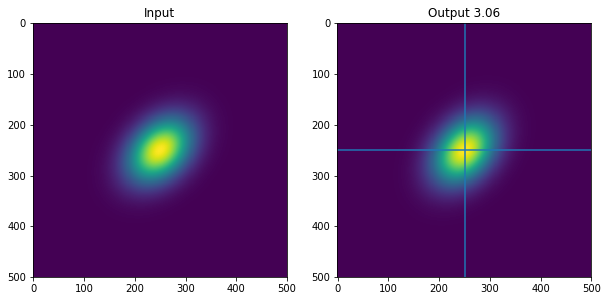

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.00769 250.2146 ]
 [249.7854  247.00769]]
(2, 3)


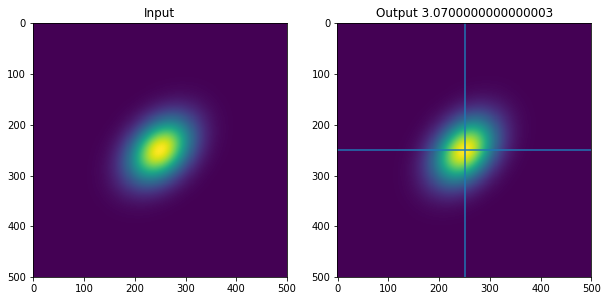

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.00569 250.18466]
 [249.81534 247.00569]]
(2, 3)


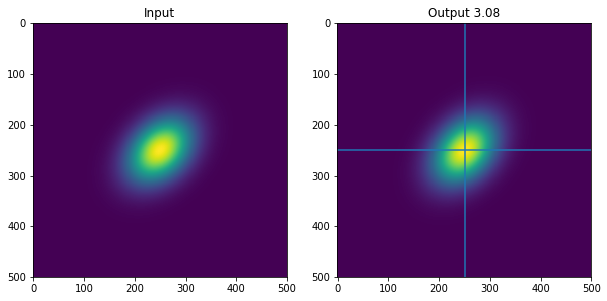

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.004   250.15471]
 [249.84529 247.004  ]]
(2, 3)


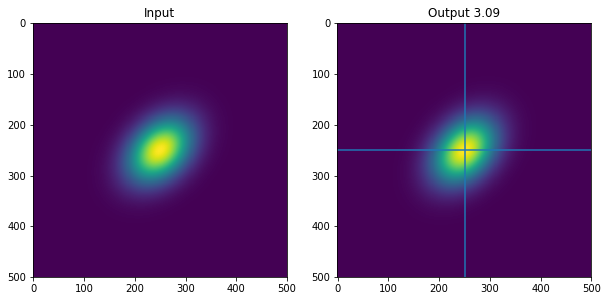

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.0026  250.12474]
 [249.87526 247.0026 ]]
(2, 3)


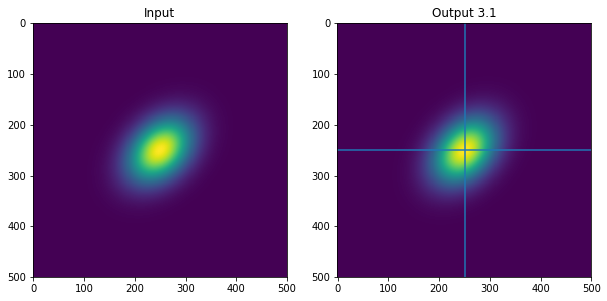

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.0015  250.09476]
 [249.90524 247.0015 ]]
(2, 3)


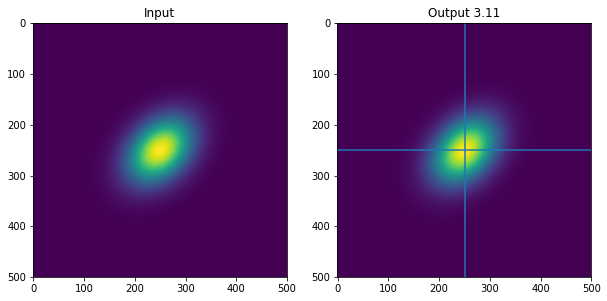

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.0007  250.06477]
 [249.93523 247.0007 ]]
(2, 3)


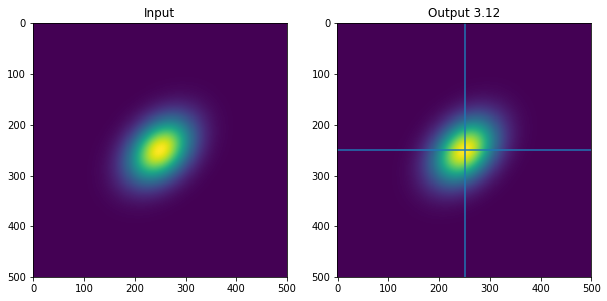

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.0002  250.03477]
 [249.96523 247.0002 ]]
(2, 3)


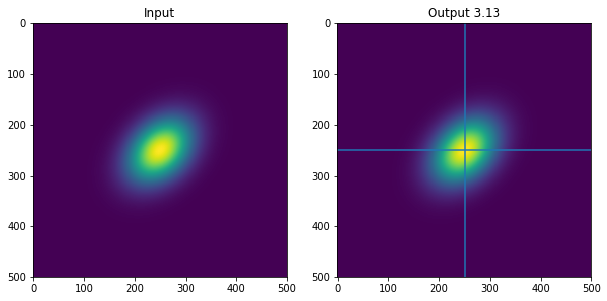

(2, 1)
(2, 2)
(1, 2)
[[250. 250.]
 [253. 250.]
 [250. 253.]]
[[250.      250.     ]
 [247.      250.00478]
 [249.99522 247.     ]]
(2, 3)


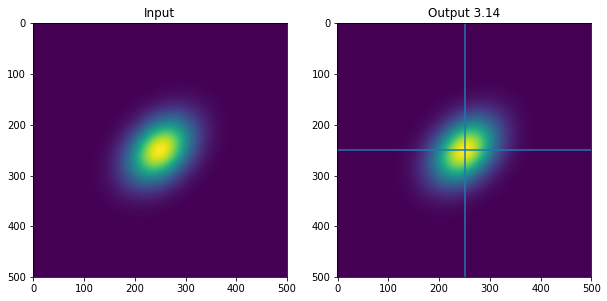

In [11]:
transform(psf_image)

In [12]:
help(cv2.getRotationMatrix2D)

Help on built-in function getRotationMatrix2D:

getRotationMatrix2D(...)
    getRotationMatrix2D(center, angle, scale) -> retval
    .   @brief Calculates an affine matrix of 2D rotation.
    .   
    .   The function calculates the following matrix:
    .   
    .   \f[\begin{bmatrix} \alpha &  \beta & (1- \alpha )  \cdot \texttt{center.x} -  \beta \cdot \texttt{center.y} \\ - \beta &  \alpha &  \beta \cdot \texttt{center.x} + (1- \alpha )  \cdot \texttt{center.y} \end{bmatrix}\f]
    .   
    .   where
    .   
    .   \f[\begin{array}{l} \alpha =  \texttt{scale} \cdot \cos \texttt{angle} , \\ \beta =  \texttt{scale} \cdot \sin \texttt{angle} \end{array}\f]
    .   
    .   The transformation maps the rotation center to itself. If this is not the target, adjust the shift.
    .   
    .   @param center Center of the rotation in the source image.
    .   @param angle Rotation angle in degrees. Positive values mean counter-clockwise rotation (the
    .   coordinate origin is assumed to